# Full ml application

importing libraries and adjusting figure size

In [39]:
#Importing essentials
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.mlab as mlab
import pandas as pd
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestRegressor
from scipy.stats import norm
from sklearn.model_selection import RandomizedSearchCV
from sklearn.preprocessing import normalize
from sklearn.metrics import mean_squared_error
from operator import itemgetter, attrgetter

# Get current size
fig_size = plt.rcParams["figure.figsize"]
# Prints: [8.0, 6.0]
#print ("Current size:", fig_size)
# Set figure width to 12 and height to 9
fig_size[0] = 20
fig_size[1] = 18
plt.rcParams["figure.figsize"] = fig_size

Necessary functions

In [40]:
def nbindingE(Z,N):  #New Binding Energy Function
    A=Z+N
    a_v  =15.422
    a_s  =16.831
    a_c  =0.686
    a_a  =26.002
    a_as =-18.711
    a_p  = 11.199
    
    if((Z%2 ==0) and (N%2==0)):
        #print("even-even")
        n=1

    elif((Z%2 !=0) and (N%2!=0)):
        n=-1
        #print("odd-odd")
    else:
        n=0
        #print("even-odd")
    
    p_1 = a_v * A
    
    p_2 = a_s * (A**(2/3))

    p_3 = a_c * ( (Z**2)/(A**(1/3)) )
    
    p_4 = a_a + a_as/(A**(1/3))
    
    p_5 = ((A-(2*Z))**2)/A
    
    p_6 = a_p*n/(A**(1/2))
    
    
    
    B= p_1 -p_2 -p_3 -p_4 * p_5 -p_6
    
    return B
   

In [41]:
def ki(exp,the):
    ki_2=0
    
    #print(exp_the[0], "\n\n")
    
    
    for i in range(0, len(exp)):
        ki_2=ki_2+(exp[i]-the[i])**2
    
    #print(len(exp_the)) 
    return np.sqrt(ki_2/(len(exp)))

In [42]:
def nuc_error(exp, the):
    err=abs(exp-the)/exp
    return err 



### Importing Theoretical data

In [43]:
#SKMS_all_nuclei-new.dat
#SKP_all_nuclei.dat
#SLY4_all_nuclei-new.dat

#SV-MIN_all_nuclei-new.dat
#UNEDF0_all_nuclei-new.dat
#UNEDF1_all_nuclei-new.dat

#6 Different theoretical Models


names=["SKMS_all_nuclei-new.dat", 
       "SKP_all_nuclei.dat",
       "SLY4_all_nuclei-new.dat", 
       "SV-MIN_all_nuclei-new.dat", 
       "UNEDF0_all_nuclei-new.dat", 
       "UNEDF1_all_nuclei-new.dat"]

#Experimental: skip_header=350, skip_footer=3433-2953
skip_H=[347,  304,  287,  316,  321,  310    ]
#skip_H =[0,    0,    0,    0,    0,    0  ]

top_F=[ 8700, 7478, 7264, 7924, 8300, 8324   ]
#top_F =[0,    0,    0,    0,    0,    0  ]
#skip_F=[0,    0,    0,    0,    0,    0  ]
skip_F=[5606, 4977, 4806, 5176, 5412, 5323   ]

Z_the    =[[],[],[],[],[],[]]
N_the    =[[],[],[],[],[],[]]
A_the    =[[],[],[],[],[],[]]

y_the    =[[],[],[],[],[],[]]
y_the_d  =[{},{},{},{},{},{}]

Q_the    =[[],[],[],[],[],[]]
Q_the_d  =[{},{},{},{},{},{}]

S_p_the  =[[],[],[],[],[],[]]
S_p_the_d=[{},{},{},{},{},{}]

S_2p_the    =[[],[],[],[],[],[]]
S_2p_the_d  =[{},{},{},{},{},{}]


S_n_the    =[[],[],[],[],[],[]]
S_n_the_d  =[{},{},{},{},{},{}]


S_2n_the   =[[],[],[],[],[],[]]
S_2n_the_d =[{},{},{},{},{},{}]

X_the      =[[],[],[],[],[],[]]

ZN_the    =[[],[],[],[],[],[]]
ZN_the_d  =[{},{},{},{},{},{}]
X_the    =[[],[],[],[],[],[]]

for i in range(0,6):
    Z_the [i]   = np.genfromtxt(names[i],usecols=1, skip_header=skip_H[i], skip_footer=(top_F[i]-skip_F[i])) #Number of protons
    N_the [i]   = np.genfromtxt(names[i],usecols=2, skip_header=skip_H[i], skip_footer=(top_F[i]-skip_F[i])) #Number of neutrons
    A_the [i]   = N_the[i]+Z_the[i]                     

    y_the [i]   = -np.genfromtxt(names[i],usecols=4, skip_header=skip_H[i], skip_footer=(top_F[i]-skip_F[i]))
    for j in range(0,len(y_the[i])):
        y_the_d[i][Z_the[i][j],N_the[i][j]]=y_the[i][j]
    
    
    Q_the [i]   = -np.genfromtxt(names[i],usecols=9, skip_header=skip_H[i], skip_footer=(top_F[i]-skip_F[i]))
    for j in range(0,len(Q_the[i])):
        Q_the_d[i][Z_the[i][j],N_the[i][j]]=Q_the[i][j]
    
    
    S_p_the  [i]= -np.genfromtxt(names[i],usecols=5, skip_header=skip_H[i], skip_footer=(top_F[i]-skip_F[i]))
    for j in range(0,len(S_p_the[i])):
        S_p_the_d[i][Z_the[i][j],N_the[i][j]]=S_p_the[i][j]
    
    
    S_2p_the [i]= -np.genfromtxt(names[i],usecols=6, skip_header=skip_H[i], skip_footer=(top_F[i]-skip_F[i]))
    for j in range(0,len(S_2p_the[i])):
        S_2p_the_d[i][Z_the[i][j],N_the[i][j]]=S_2p_the[i][j]
    
    
    S_n_the [i] = -np.genfromtxt(names[i],usecols=7, skip_header=skip_H[i], skip_footer=(top_F[i]-skip_F[i]))
    for j in range(0,len(S_n_the[i])):
        S_n_the_d[i][Z_the[i][j],N_the[i][j]]=S_n_the[i][j]
    
    
    S_2n_the[i] = -np.genfromtxt(names[i],usecols=8, skip_header=skip_H[i], skip_footer=(top_F[i]-skip_F[i]))
    for j in range(0,len(S_2n_the[i])):
        S_2n_the_d[i][Z_the[i][j],N_the[i][j]]=S_2n_the[i][j]
    
    ZN_the[i]= np.transpose(np.stack( (Z_the[i],N_the[i]) ))
    
    for j in range(0,len(ZN_the[i])):
        ZN_the_d[i][Z_the[i][j], N_the[i][j]]  =ZN_the[i][j]
    
    X_the[i]= np.transpose(np.stack(  (Z_the[i],      #0
                                       N_the[i],      #1
                                       A_the[i],      #2
                                       y_the[i],      #3
                                       S_p_the[i],    #4
                                       S_n_the[i],    #5
                                       S_2p_the[i],   #6
                                       S_2n_the[i],   #7
                                       Q_the[i]) ))   #8
     

## Importing experimental data values

In [44]:
exp_h=350
exp_f=3433-3046

N_exp    = np.genfromtxt('EXPERIMENT_AME2016.dat',usecols=3, skip_header=exp_h, skip_footer=exp_f)
Z_exp    = np.genfromtxt('EXPERIMENT_AME2016.dat',usecols=4, skip_header=exp_h, skip_footer=exp_f)
A_exp    = N_exp+Z_exp                                                        #Total number of Nucleons
# Difference between the experimental binding energy and the Liquid drop model
y_exp    = -np.genfromtxt('EXPERIMENT_AME2016.dat',usecols=5, skip_header=exp_h, skip_footer=exp_f)

S_p_exp  = -np.genfromtxt('EXPERIMENT_AME2016.dat',usecols=12, skip_header=exp_h, skip_footer=exp_f)
S_2p_exp = -np.genfromtxt('EXPERIMENT_AME2016.dat',usecols=18, skip_header=exp_h, skip_footer=exp_f)

S_n_exp  =-np.genfromtxt('EXPERIMENT_AME2016.dat',usecols=9, skip_header=exp_h, skip_footer=exp_f)
S_2n_exp =-np.genfromtxt('EXPERIMENT_AME2016.dat',usecols=15, skip_header=exp_h, skip_footer=exp_f)


ZN_exp   = np.transpose(np.stack((Z_exp, N_exp)))
X_exp    = np.transpose(np.stack((Z_exp, N_exp,   A_exp,   y_exp,   S_p_exp,   S_n_exp,   S_2p_exp,   S_2n_exp)))

y_exp_d={}
S_n_exp_d={}
S_2n_exp_d={}
S_p_exp_d={}
S_2p_exp_d={}

for i in range(0,len(N_exp)):
    y_exp_d[     Z_exp[i],   N_exp[i]]=  y_exp[i]
    
    S_n_exp_d[   Z_exp[i],   N_exp[i]]=  S_n_exp[i]
    S_2n_exp_d[  Z_exp[i],   N_exp[i]]=  S_2n_exp[i]
    
    S_p_exp_d[   Z_exp[i],   N_exp[i]]=  S_p_exp[i]
    S_2p_exp_d[  Z_exp[i],   N_exp[i]]=  S_2p_exp[i]




## Finding where theoretical and experimental data set match

Separation Energy difference
(2548,)
(2, 2548)
(2548,)
(2548,)


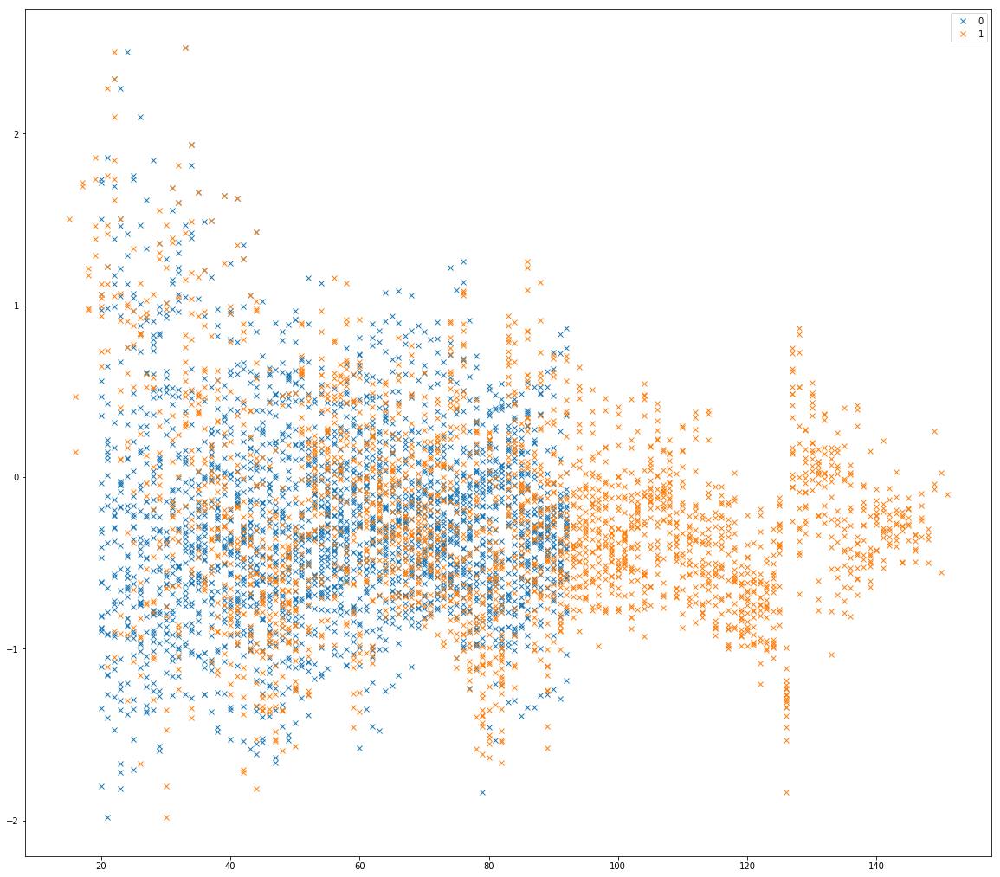

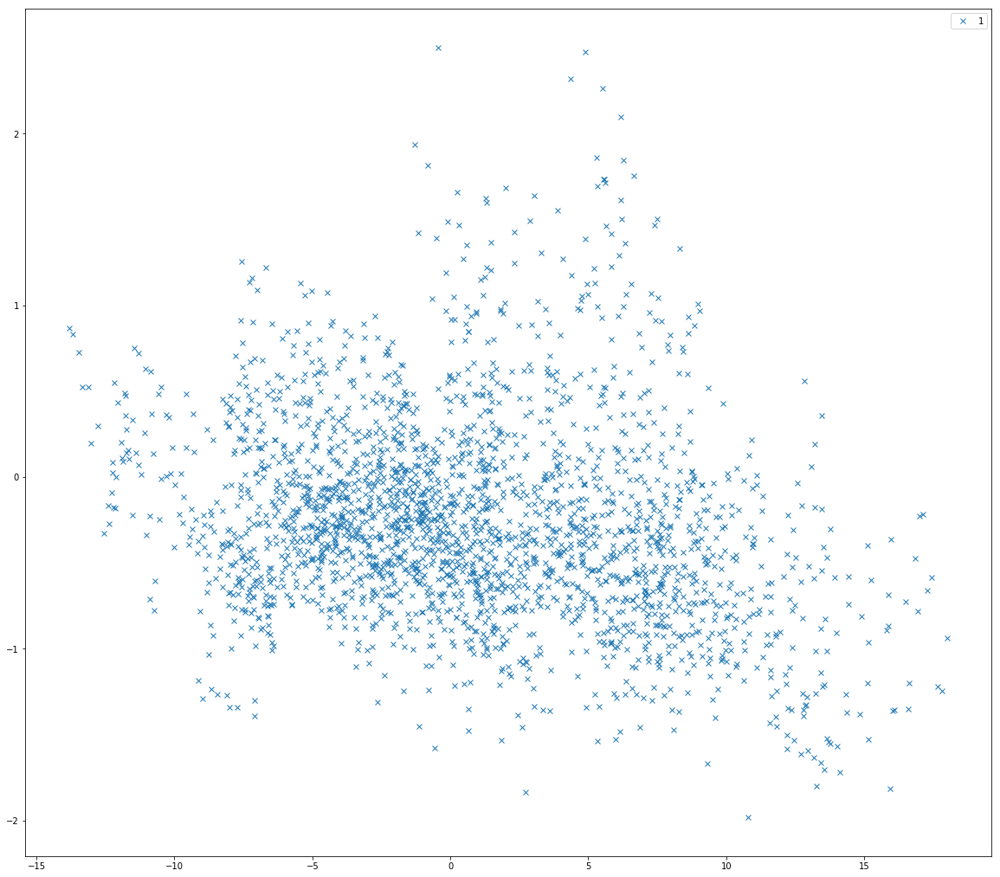

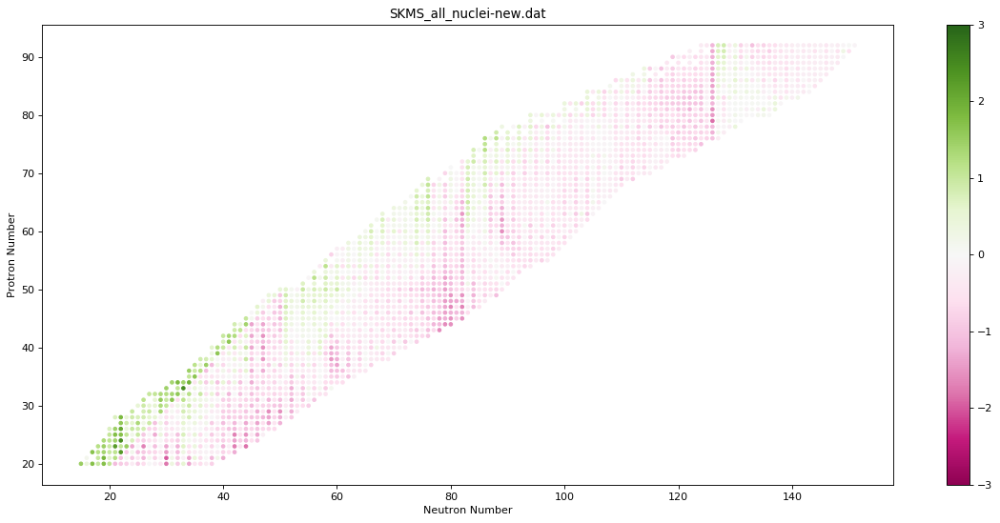

Separation Energy difference
(2575,)
(2, 2575)
(2575,)
(2575,)


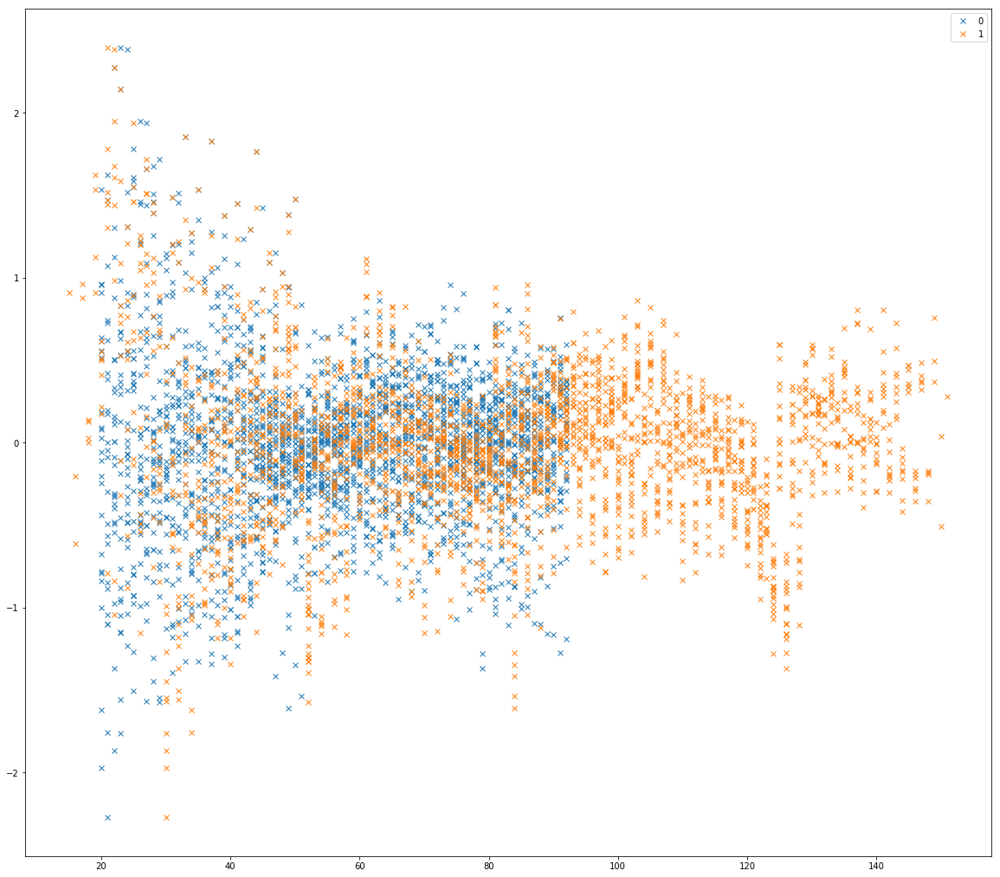

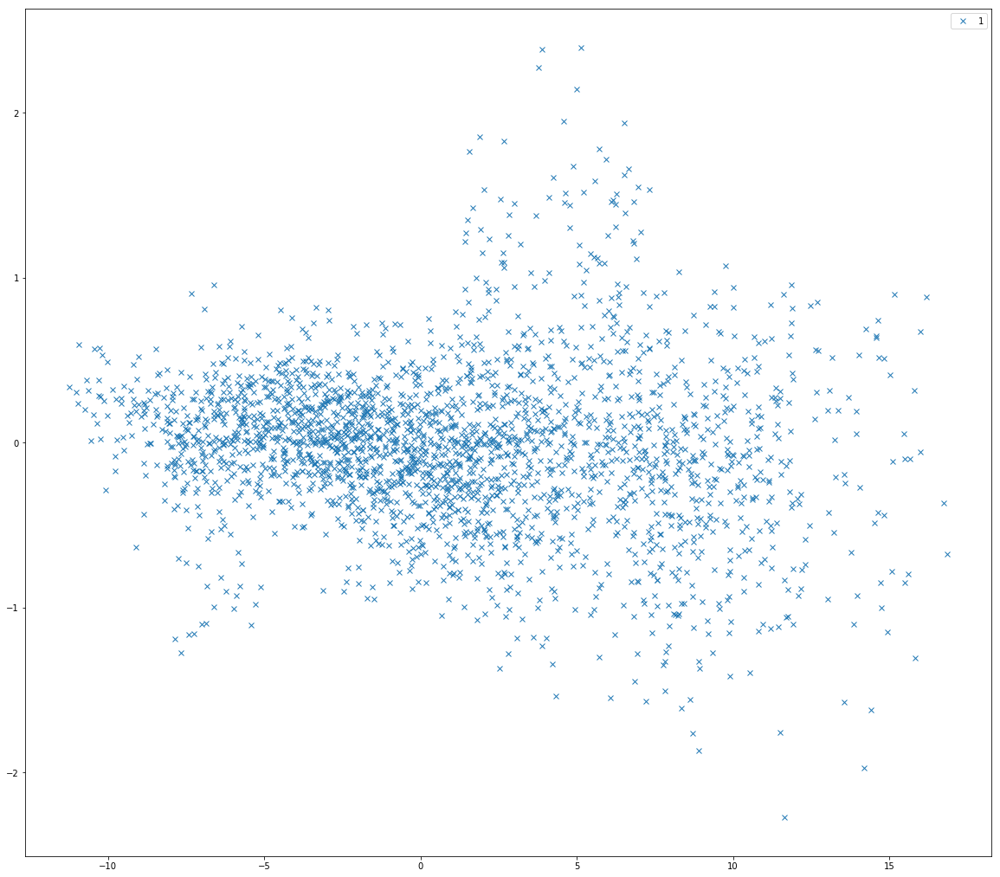

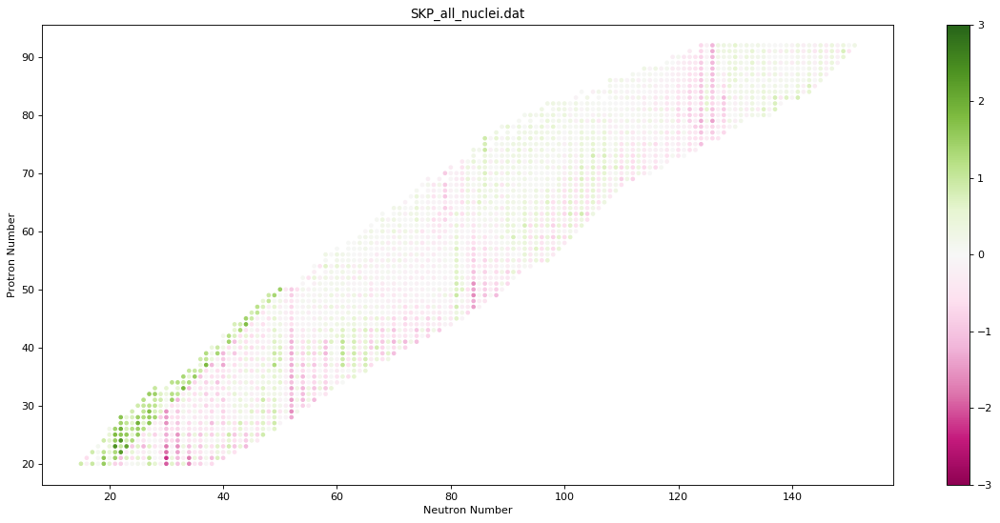

Separation Energy difference
(2575,)
(2, 2575)
(2575,)
(2575,)


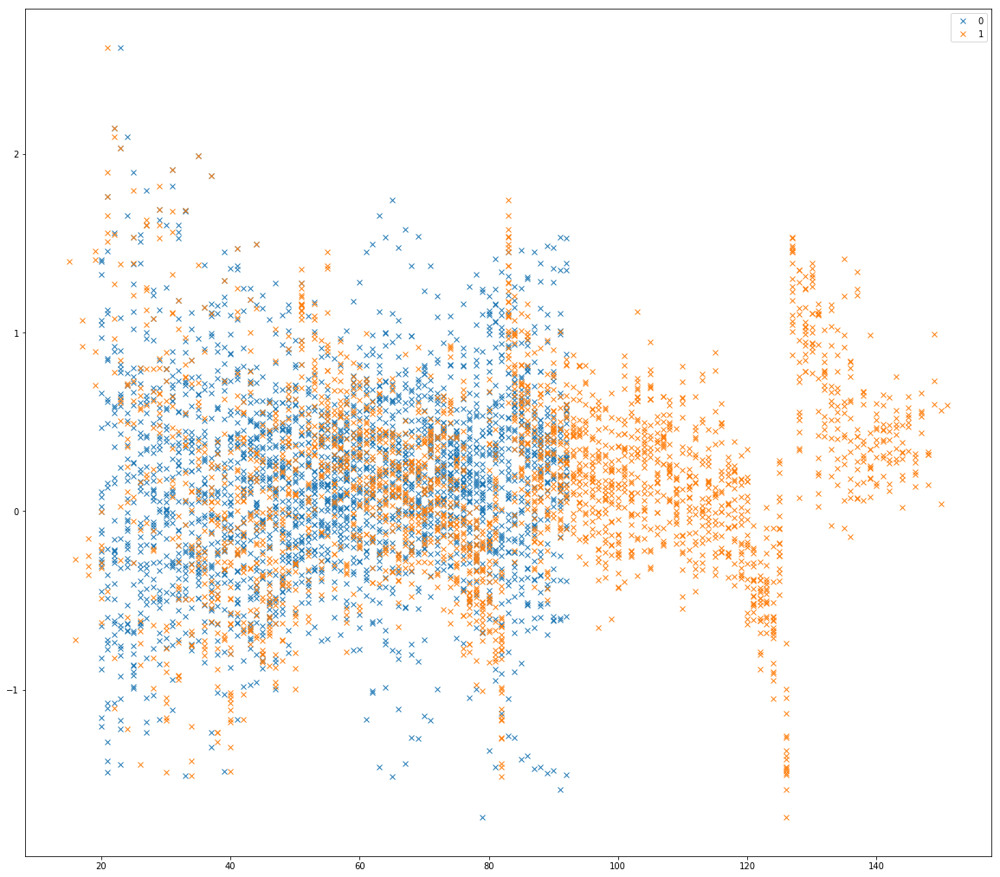

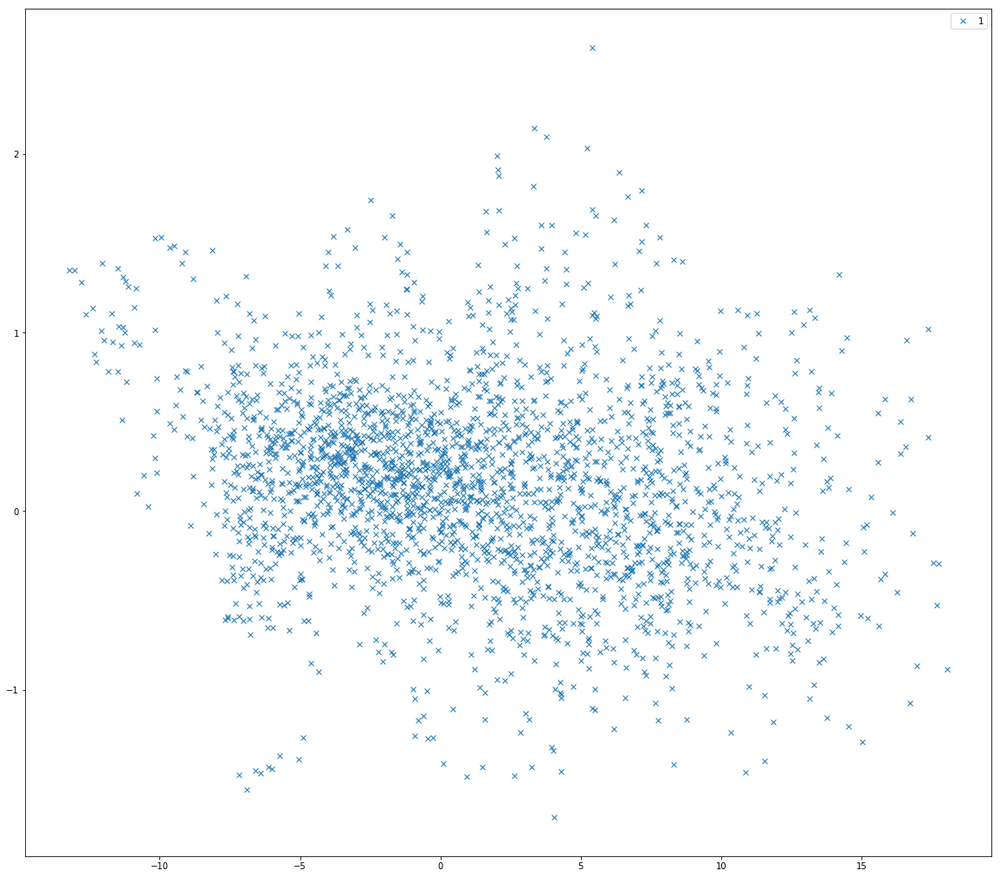

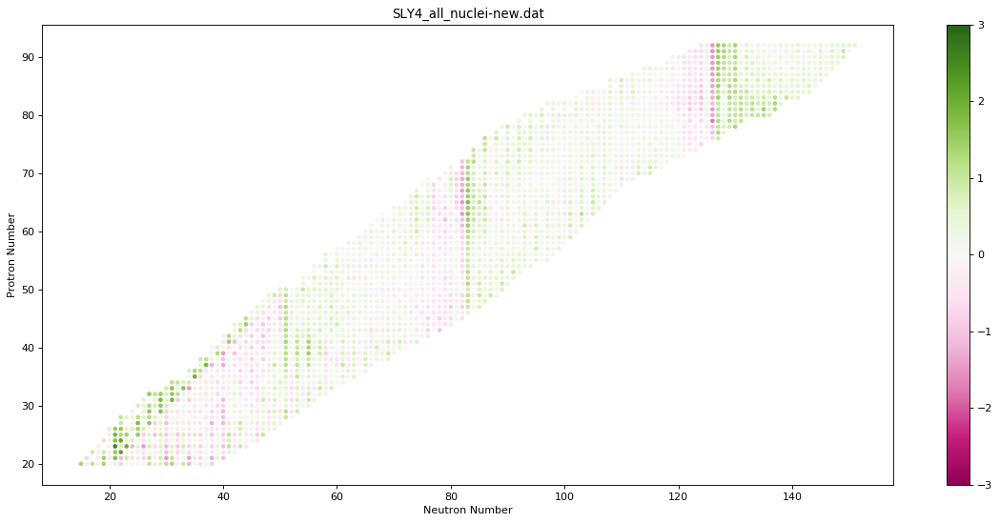

Separation Energy difference
(2572,)
(2, 2572)
(2572,)
(2572,)


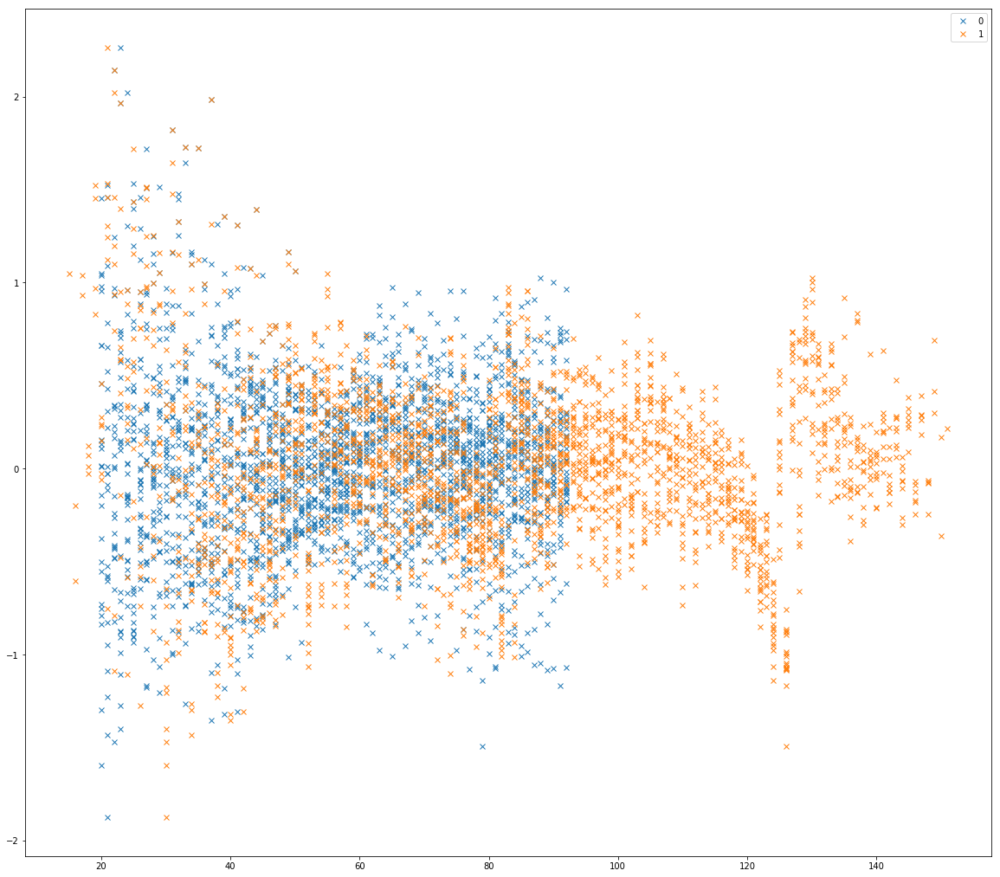

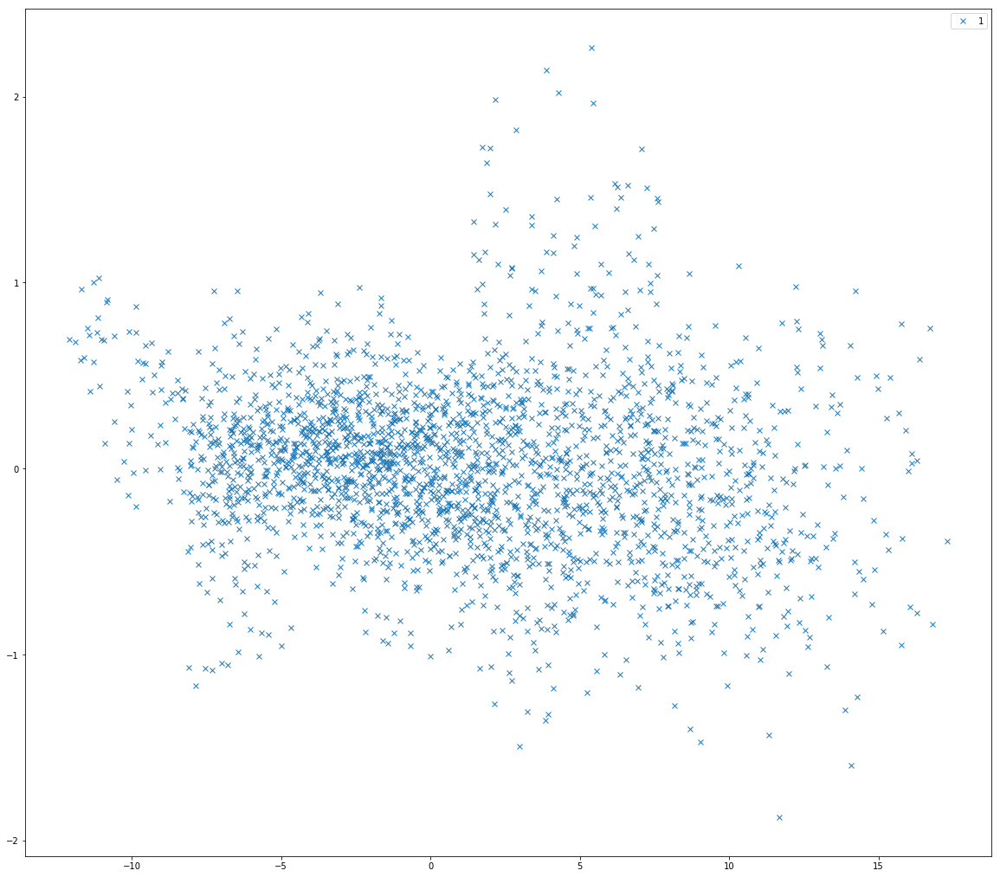

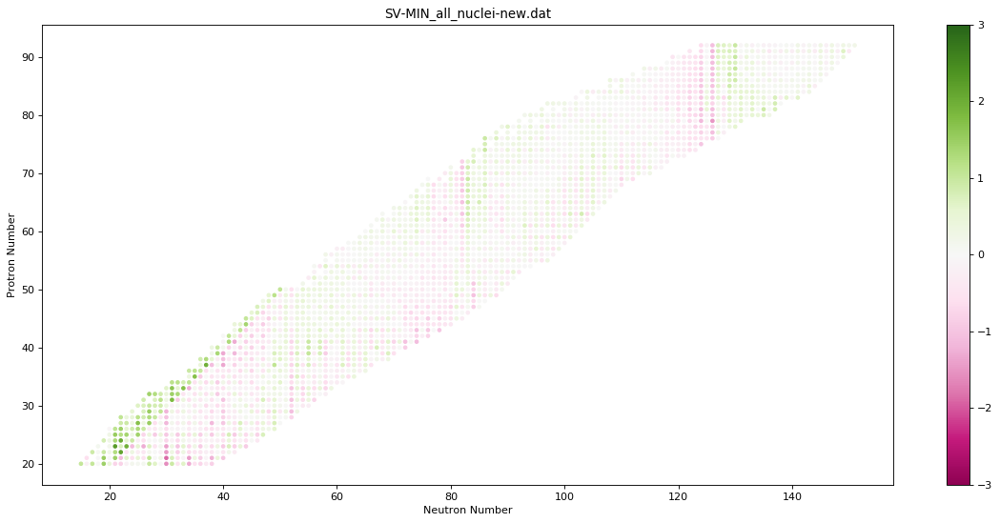

Separation Energy difference
(2570,)
(2, 2570)
(2570,)
(2570,)


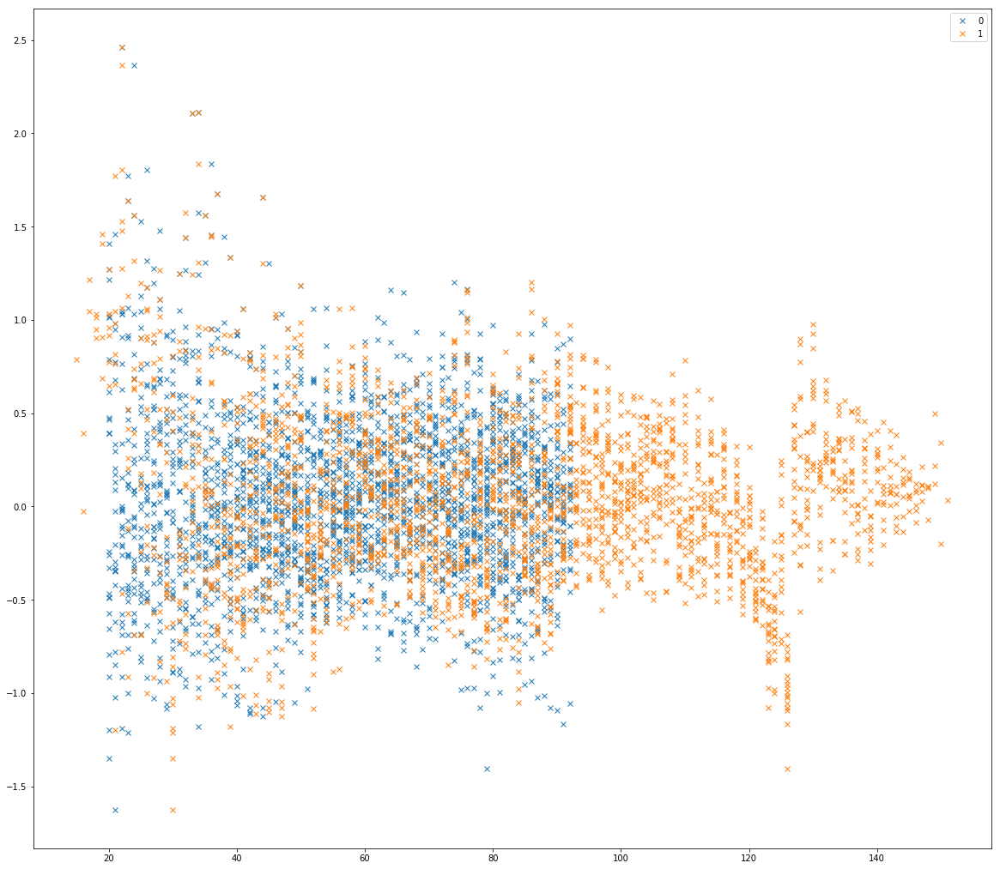

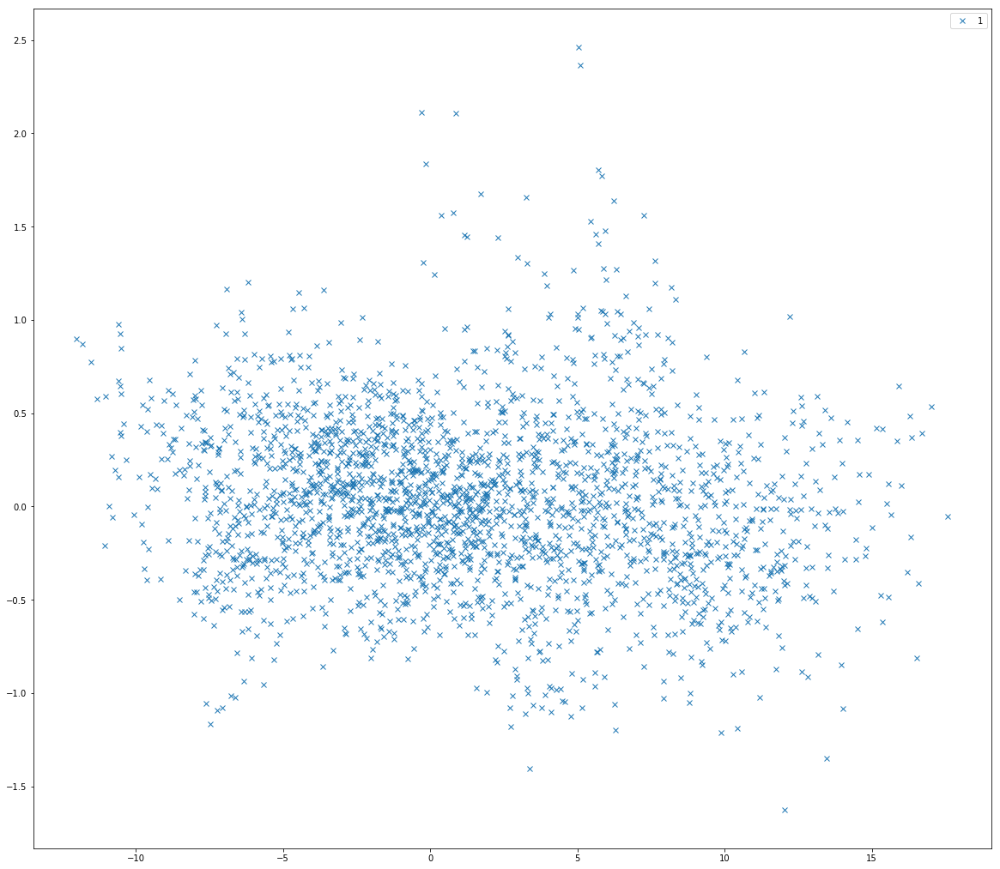

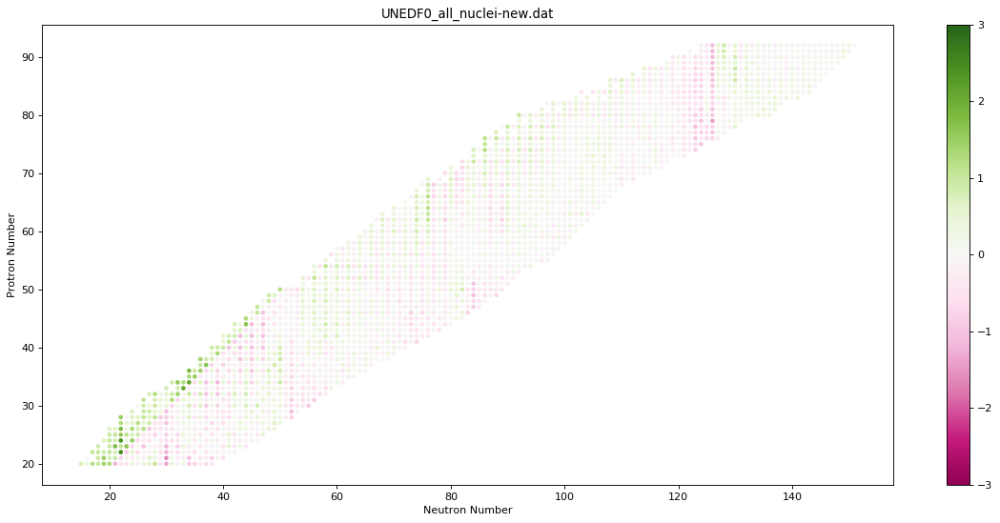

Separation Energy difference
(2580,)
(2, 2580)
(2580,)
(2580,)


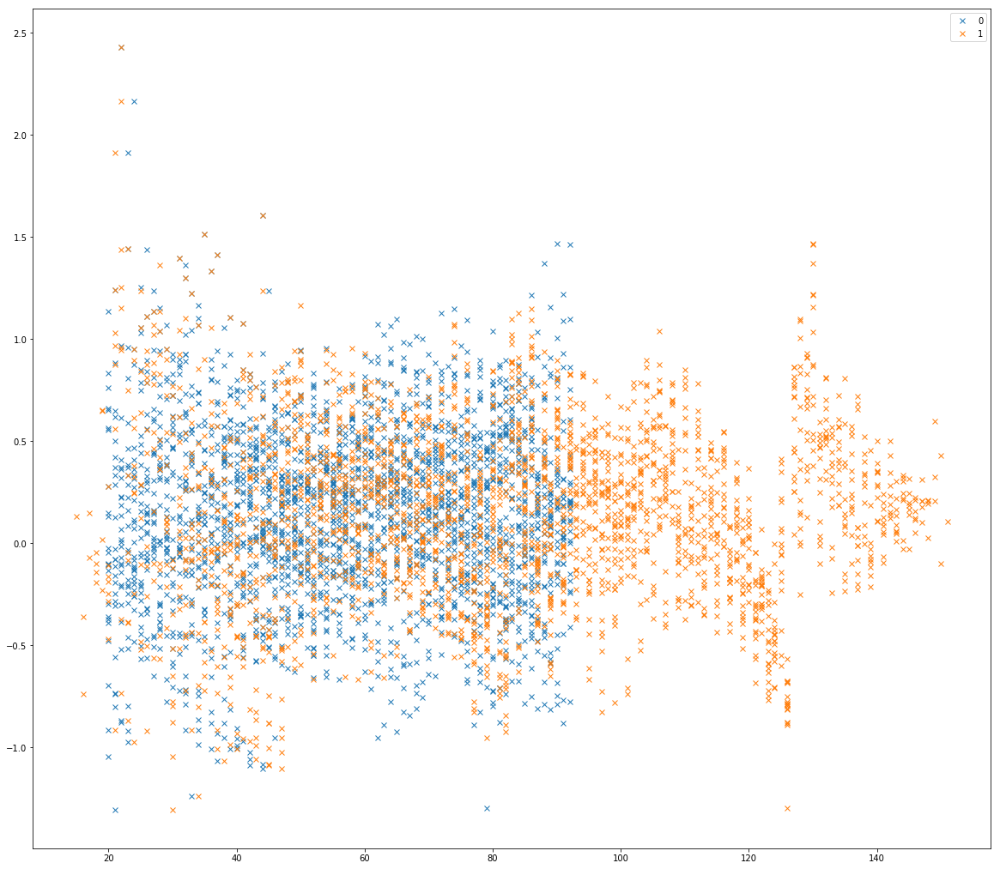

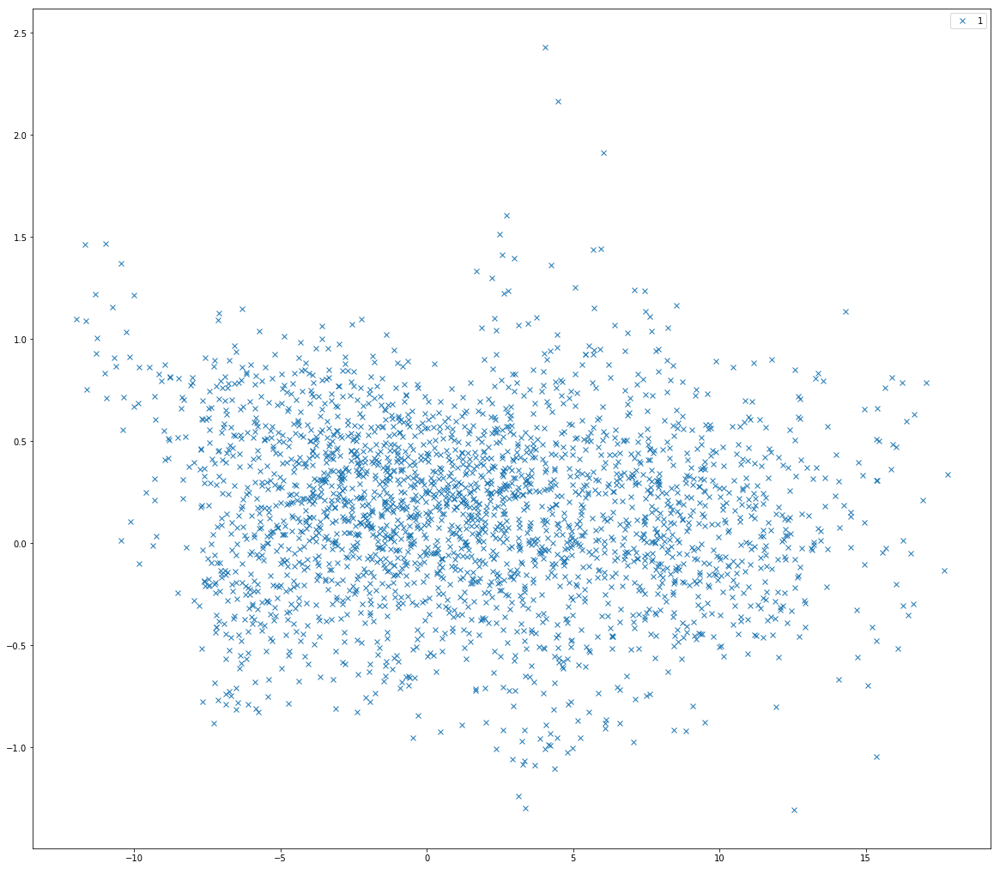

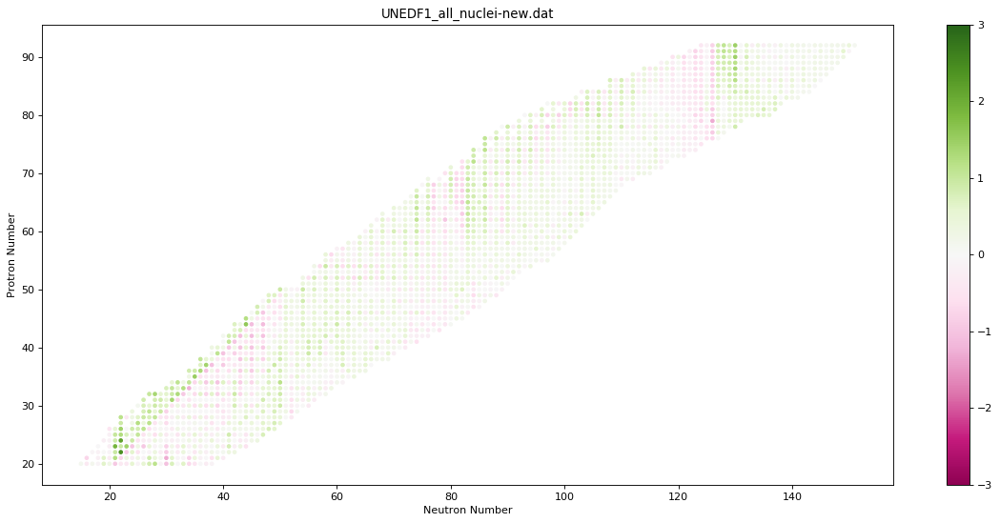

In [45]:

y_mat_the         =[[],[],[],[],[],[]]
y_mat_exp         =[[],[],[],[],[],[]]    
ZN_y_mat          =[[],[],[],[],[],[]]

S_p_mat_the       =[[],[],[],[],[],[]]
S_p_mat_exp       =[[],[],[],[],[],[]]

S_p_mat_the_d     =[{},{},{}, {},{},{}]
S_p_mat_exp_d     =[{},{},{}, {},{},{}]

ZN_S_p_mat        =[[],[],[],[],[],[]]

S_2p_mat_the      =[[],[],[],[],[],[]]
S_2p_mat_exp      =[[],[],[],[],[],[]]
ZN_S_2p_mat       =[[],[],[],[],[],[]]

S_n_mat_the       =[[],[],[],[],[],[]]
S_n_mat_exp       =[[],[],[],[],[],[]]
#!!!!
#!!!!
S_n_mat_the_exp_diff    =[[],[],[],[],[],[]]
S_n_mat_the_exp_diff_d  =[{},{},{}, {},{},{}]
#!!!!
#!!!!

S_n_mat_the_d     =[{},{},{}, {},{},{}]
S_n_mat_exp_d     =[{},{},{}, {},{},{}]

ZN_S_n_mat        =[[],[],[],[],[],[]]
ZQ_S_n_mat         =[[],[],[],[],[],[]]


S_2n_mat_the      =[[],[],[],[],[],[]]
S_2n_mat_exp      =[[],[],[],[],[],[]]
ZN_S_2n_mat       =[[],[],[],[],[],[]]

Q_mat_the         =[[],[],[],[],[],[]]
Q_mat_the_d       =[{},{},{}, {},{},{}]
ZN_Q_mat          =[[],[],[],[],[],[]]
ZQ_mat            =[[],[],[],[],[],[]]
NQ_mat            =[[],[],[],[],[],[]]


X_mat             =[[],[],[],[],[],[]]

sigma             =[[],[],[],[],[],[]]

Z_y_mat           =[[],[],[],[],[],[]]
N_y_mat           =[[],[],[],[],[],[]]

y_mat_the_d       =[{},{},{}, {},{},{},]
y_mat_exp_d       =[{},{},{}, {},{},{},]

y_of_Q_mat_the_d  =[{},{},{}, {},{},{},]



for i in range(0,6):
    for ZN_exp_i in ZN_exp:
        
        try:
            y_mat_the[i].append(y_the_d[i][ZN_exp_i[0],ZN_exp_i[1]])
            y_mat_the_d[i][ZN_exp_i[0],ZN_exp_i[1]]=y_the_d[i][ZN_exp_i[0],ZN_exp_i[1]]
            
            y_mat_exp[i].append(y_exp_d[ZN_exp_i[0],ZN_exp_i[1]])
            y_mat_exp_d[i][ZN_exp_i[0], ZN_exp_i[1]]=y_exp_d[ZN_exp_i[0],ZN_exp_i[1]]
            
            Z_y_mat[i].append(ZN_exp_i[0])
            N_y_mat[i].append(ZN_exp_i[1])
            
            ZN_y_mat[i].append(ZN_the_d[i][ZN_exp_i[0],ZN_exp_i[1]])
            
        except KeyError:
            continue
        
        try:
            S_p_mat_the[i].append(S_p_the_d[i][ZN_exp_i[0],ZN_exp_i[1]])
            S_p_mat_the_d[i][ZN_exp_i[0],ZN_exp_i[1]]=S_p_the_d[i][ZN_exp_i[0],ZN_exp_i[1]]
            
            S_p_mat_exp[i].append(S_p_exp_d[ZN_exp_i[0],ZN_exp_i[1]])  
            S_p_mat_exp_d[i][ZN_exp_i[0],ZN_exp_i[1]]=S_p_exp_d[ZN_exp_i[0],ZN_exp_i[1]]
            
            ZN_S_p_mat[i].append(ZN_the_d[i][ZN_exp_i[0],ZN_exp_i[1]])
        except KeyError:
            continue
        
        try:
            S_2p_mat_the[i].append(S_2p_the_d[i][ZN_exp_i[0],ZN_exp_i[1]])
            S_2p_mat_exp[i].append(S_2p_exp_d[ZN_exp_i[0],ZN_exp_i[1]])  
            ZN_S_2p_mat[i].append(ZN_the_d[i][ZN_exp_i[0],ZN_exp_i[1]])
        except KeyError:
            continue
        
        try:
            a=S_n_the_d[i][ZN_exp_i[0],ZN_exp_i[1]]
            b=S_n_exp_d[ZN_exp_i[0],ZN_exp_i[1]]
            
            if a!=0 and b!=0:
                S_n_mat_the[i].append(S_n_the_d[i][ZN_exp_i[0],ZN_exp_i[1]])
                S_n_mat_exp[i].append(S_n_exp_d[ZN_exp_i[0],ZN_exp_i[1]])

                S_n_mat_the_exp_diff[i].append(S_n_the_d[i][ZN_exp_i[0],ZN_exp_i[1]]-S_n_exp_d[ZN_exp_i[0],ZN_exp_i[1]])
                S_n_mat_the_exp_diff_d[i][ZN_exp_i[0],ZN_exp_i[1]]=S_n_the_d[i][ZN_exp_i[0],ZN_exp_i[1]]-S_n_exp_d[ZN_exp_i[0],ZN_exp_i[1]]


                ZN_S_n_mat[i].append(ZN_the_d[i][ZN_exp_i[0],ZN_exp_i[1]])
                
                ZQ_S_n_mat[i].append((ZN_exp_i[0],Q_the_d[i][ZN_exp_i[0],ZN_exp_i[1]]))
                
                S_n_mat_the_d[i][ZN_exp_i[0],ZN_exp_i[1]]=S_n_the_d[i][ZN_exp_i[0],ZN_exp_i[1]]
                S_n_mat_exp_d[i][ZN_exp_i[0],ZN_exp_i[1]]=S_n_exp_d[ZN_exp_i[0],ZN_exp_i[1]]
            
            
            
            
        except KeyError:
            continue
        
        try:
            S_2n_mat_the[i].append(S_2n_the_d[i][ZN_exp_i[0],ZN_exp_i[1]])
            S_2n_mat_exp[i].append(S_2n_exp_d[ZN_exp_i[0],ZN_exp_i[1]])  
            ZN_S_2n_mat[i].append(ZN_the_d[i][ZN_exp_i[0],ZN_exp_i[1]])
        except KeyError:
            continue
       
        try:
            Q_mat_the[i].append(Q_the_d[i][ZN_exp_i[0],ZN_exp_i[1]])
            Q_mat_the_d[i][ZN_exp_i[0],ZN_exp_i[1]]=Q_the_d[i][ZN_exp_i[0],ZN_exp_i[1]]
            
            ZN_Q_mat[i].append( (ZN_exp_i[0], ZN_exp_i[1]                          ) )
            ZQ_mat[i].append(   (ZN_exp_i[0], Q_the_d[i][ZN_exp_i[0],ZN_exp_i[1]]  ) )
            NQ_mat[i].append(   (ZN_exp_i[1], Q_the_d[i][ZN_exp_i[0],ZN_exp_i[1]]  ) )
            
            y_of_Q_mat_the_d[i][ZN_exp_i[0],ZN_exp_i[1]]=y_the_d[i][ZN_exp_i[0],ZN_exp_i[1]]
            
        except KeyError:
            continue
    """        
    print(np.shape(y_mat_the[i]))
    print(np.shape(y_mat_the_d[i]))
    print(np.shape(y_mat_exp[i]))
    print(np.shape(y_mat_exp_d[i]))
    print(np.shape(Z_y_mat[i]))
    print(np.shape(N_y_mat[i]), "\n\n")
    """        
    

for i in range(0,6):
    ZN_y_mat[i]=np.transpose(ZN_y_mat[i])
    ZN_S_p_mat[i]=np.transpose(ZN_S_p_mat[i])
    ZN_S_2p_mat[i]=np.transpose(ZN_S_2p_mat[i])
    ZN_S_n_mat[i]=np.transpose(ZN_S_n_mat[i])
    ZN_S_2n_mat[i]=np.transpose(ZN_S_2n_mat[i])
    ZN_Q_mat[i]=np.transpose(ZN_Q_mat[i])
    
    ZQ_S_n_mat[i]=np.transpose(ZQ_S_n_mat[i])

    
"""
for i in range(0,6):
    X_mat[i]=np.transpose(np.stack((y_mat_the[i], y_mat_exp[i], 
                                    ZN_y_mat[i][0], ZN_y_mat[i][1],
                                    
                                    S_p_mat_the[i], S_p_mat_exp[i],  
                                    ZN_S_p_mat[i][0], ZN_S_p_mat[i][1],
                                    
                                    S_2p_mat_the[i], S_2p_mat_exp[i],   
                                    ZN_S_2p_mat[i][0], ZN_S_2p_mat[i][1],
                                    
                                    S_n_mat_the[i], S_n_mat_exp[i],  
                                    ZN_S_n_mat[i][0], ZN_S_n_mat[i][1],     
                                    
                                    S_2n_mat_the[i], S_2n_mat_exp[i], 
                                    ZN_S_2n_mat[i][0], ZN_S_2n_mat[i][1],
                                    
                                    Q_mat_the[i],
                                    ZN_Q_mat[i][0], ZN_Q_mat[i][1], ) ) )
    X_mat[i]=np.transpose(X_mat[i])
    #print(np.shape(X_mat[i]))
"""

for i in range(0,6):
    ZN_Q_mat[i]=np.transpose(ZN_Q_mat[i])
    #print(np.shape(ZN_Q_mat[i]))
    #print(np.shape(ZQ_mat[i]  ))
    #print(np.shape(NQ_mat[i]  ), "\n")


for i in range(0,6):
    S_n_mat_the_exp_diff[i]=np.transpose(S_n_mat_the_exp_diff[i])
    print("Separation Energy difference")
    print(np.shape(S_n_mat_the_exp_diff[i]))
    print(np.shape(ZN_S_n_mat[i]))
    print(np.shape(S_n_mat_the[i]))
    print(np.shape(S_n_mat_exp[i]))
    
    
    plt.plot(ZN_S_n_mat[i][0],S_n_mat_the_exp_diff[i], "x", label="Z")
    plt.plot(ZN_S_n_mat[i][1],S_n_mat_the_exp_diff[i], "x", label="N")
    plt.legend()
    plt.show()
    
    #plt.plot(ZQ_S_n_mat[i][0],S_n_mat_the_exp_diff[i], "x", label="0")
    plt.plot(ZQ_S_n_mat[i][1],S_n_mat_the_exp_diff[i], "x", label="Q")
    plt.legend()
    plt.show()
    
    
    
    ext = np.int(np.ceil(max(-np.min(S_n_mat_the_exp_diff[i]),np.max(S_n_mat_the_exp_diff[i]))))
    fig = plt.figure(figsize=(18, 8), dpi= 80, facecolor='w', edgecolor='k')
    sc  = plt.scatter(ZN_S_n_mat[i][1],ZN_S_n_mat[i][0],c=S_n_mat_the_exp_diff[i],cmap='PiYG',vmin=-ext,vmax=ext,s=10)
    plt.colorbar(sc)
    plt.title(names[i])
    plt.xlabel('Neutron Number')
    plt.ylabel('Protron Number')
    plt.show()
    
    """
    print("DIFFERENCE")
    ext = np.int(np.ceil(max(-np.min(X_mat[i][0]-X_mat[i][1]),np.max(X_mat[i][0]-X_mat[i][1]))))
    fig = plt.figure(figsize=(18, 8), dpi= 80, facecolor='w', edgecolor='k')
    sc  = plt.scatter(X_mat[i][3],X_mat[i][2],c=X_mat[i][0]-X_mat[i][1],cmap='PiYG',vmin=-ext,vmax=ext,s=10)
    plt.colorbar(sc)
    plt.title(names[i])
    plt.xlabel('Neutron Number')
    plt.ylabel('Protron Number')
    plt.show()
    
    
    print("THEORETICAL")
    ext = np.int(np.ceil(max(-np.min(X_mat[i][0]),np.max(X_mat[i][0]))))
    fig = plt.figure(figsize=(18, 8), dpi= 80, facecolor='w', edgecolor='k')
    sc  = plt.scatter(X_mat[i][3],X_mat[i][2],c=X_mat[i][0],cmap='PiYG',vmin=-ext,vmax=ext,s=10)
    plt.colorbar(sc)
    plt.title(names[i])
    plt.xlabel('Neutron Number')
    plt.ylabel('Protron Number')
    plt.show()
    
    print("EXPERIMENTAL")
    ext = np.int(np.ceil(max(-np.min(X_mat[i][1]),np.max(X_mat[i][1]))))
    fig = plt.figure(figsize=(18, 8), dpi= 80, facecolor='w', edgecolor='k')
    sc  = plt.scatter(X_mat[i][3],X_mat[i][2],c=X_mat[i][1],cmap='PiYG',vmin=-ext,vmax=ext,s=10)
    plt.colorbar(sc)
    plt.title(names[i])
    plt.xlabel('Neutron Number')
    plt.ylabel('Protron Number')
    plt.show()
    """
for i in range(0,6):
    ZQ_S_n_mat[i]=np.transpose(ZQ_S_n_mat[i])
    ZN_S_n_mat[i]=np.transpose(ZN_S_n_mat[i])
    


In [55]:


rf_S_n_diff_ZQ_name=["rf_diff_Snexp_ZQ_SKMS",
                     "rf_diff_Snexp_ZQ_SKP",
                     "rf_diff_Snexp_ZQ_SLY4",
                     "rf_diff_Snexp_ZQ_SV-MIN",
                     "rf_diff_Snexp_ZQ_UNEDF0",
                     "rf_diff_Snexp_ZQ_UNEDF1",]


S_n_diff_ZQ_ml         =[ [], [], [], [], [], [] ]

for i in range(0,6):

    
    rf_S_n_diff_ZQ_name[i]=RandomForestRegressor(n_estimators=1000)
    X_train, X_test, y_train, y_test = train_test_split(ZQ_S_n_mat[i],S_n_mat_the_exp_diff[i], test_size =0.25)#, random_state=42 )
    rf_S_n_diff_ZQ_name[i].fit(X_train,y_train) 
    print(names[i])
    print( " training score: ", rf_S_n_diff_ZQ_name[i].score(X_train,y_train))
    print( " testing score:  ", rf_S_n_diff_ZQ_name[i].score(X_test,y_test))
    
    print( " ki: ", ki(S_n_mat_the_exp_diff[i],rf_S_n_diff_ZQ_name[i].predict(ZQ_S_n_mat[i])))

    
rf_S_n_diff_ZN_name=["rf_diff_Snexp_ZQ_SKMS",
                     "rf_diff_Snexp_ZQ_SKP",
                     "rf_diff_Snexp_ZQ_SLY4",
                     "rf_diff_Snexp_ZQ_SV-MIN",
                     "rf_diff_Snexp_ZQ_UNEDF0",
                     "rf_diff_Snexp_ZQ_UNEDF1",]


S_n_diff_ZN_ml         =[ [], [], [], [], [], [] ]
print("\n\n")
for i in range(0,6):

    
    rf_S_n_diff_ZN_name[i]=RandomForestRegressor(n_estimators=1000)
    X_train, X_test, y_train, y_test = train_test_split(ZN_S_n_mat[i],S_n_mat_the_exp_diff[i], test_size =0.25)#, random_state=42 )
    rf_S_n_diff_ZN_name[i].fit(X_train,y_train) 
    print(names[i])
    print(" training score: ", rf_S_n_diff_ZN_name[i].score(X_train,y_train))
    print(" testing score: ", rf_S_n_diff_ZN_name[i].score(X_test,y_test))
    print( " ki: ", ki(S_n_mat_the_exp_diff[i],rf_S_n_diff_ZN_name[i].predict(ZN_S_n_mat[i])))



(2548, 2)
(2548,)
[[20.        7.480085]
 [20.        6.186146]
 [20.        5.623388]
 ...
 [92.       -4.676583]
 [92.       -4.749608]
 [92.       -4.76598 ]]
[ 1.500436  0.467378  1.71214  ... -0.070441  0.025075 -0.102522]
SKMS_all_nuclei-new.dat
 training score:  0.901879652256649
 testing score:   0.3004231799075765
 ki:  0.28753119352504913
SKP_all_nuclei.dat
 training score:  0.8561134875835276
 testing score:   -0.09160203269248557
 ki:  0.3033523695140671
SLY4_all_nuclei-new.dat
 training score:  0.8603971727531066
 testing score:   0.006864959148480954
 ki:  0.3221181921027116
SV-MIN_all_nuclei-new.dat
 training score:  0.8543711306339539
 testing score:   -0.11594012378250329
 ki:  0.27453788859520806
UNEDF0_all_nuclei-new.dat
 training score:  0.8565914101113196
 testing score:   -0.026592891222249726
 ki:  0.26890595221543806
UNEDF1_all_nuclei-new.dat
 training score:  0.8485664964362764
 testing score:   -0.13746518437541755
 ki:  0.27662952258485474



SKMS_all_nuclei-

In [8]:
rf_ZQ_name=["rf_ZQ_SKMS",
            "rf_ZQ_SKP",
         "rf_ZQ_SLY4",
         "rf_ZQ_SV-MIN",
         "rf_ZQ_UNEDF0",
         "rf_ZQ_UNEDF1",]


ZQ_ml         =[ [], [], [], [], [], [] ]

rf_diff_Snexp_ZQ_name=["rf_diff_Snexp_ZQ_SKMS",
                       "rf_diff_Snexp_ZQ_SKP",
                       "rf_diff_Snexp_ZQ_SLY4",
                       "rf_diff_Snexp_ZQ_SV-MIN",
                       "rf_diff_Snexp_ZQ_UNEDF0",
                       "rf_diff_Snexp_ZQ_UNEDF1",]


diff_Snexp_ZQ_ml         =[ [], [], [], [], [], [] ]





rf_ZQ_sigma   =[ [], [], [], [], [], [] ]
rf_ZQ_score   =[ [], [], [], [], [], [] ]

std_ZQ        =[ [], [], [], [], [], [] ]
mean_ZQ       =[ [], [], [], [], [], [] ]

rf_NQ_name=["rf_NQ_SKMS",
            "rf_NQ_SKP",
         "rf_NQ_SLY4",
         "rf_NQ_SV-MIN",
         "rf_NQ_UNEDF0",
         "rf_NQ_UNEDF1",]

NQ_ml         =[ [], [], [], [], [], [] ]

rf_NQ_sigma   =[ [], [], [], [], [], [] ]
rf_NQ_score   =[ [], [], [], [], [], [] ]

std_NQ        =[ [], [], [], [], [], [] ]
mean_NQ       =[ [], [], [], [], [], [] ]

rf_ZN_Q_name=["rf_ZN_Q_SKMS",
            "rf_ZN_Q_SKP",
         "rf_ZN_Q_SLY4",
         "rf_ZN_Q_SV-MIN",
         "rf_ZN_Q_UNEDF0",
         "rf_ZN_Q_UNEDF1",]


ZN_Q_ml         =[ [], [], [], [], [], [] ]

rf_ZN_Q_sigma   =[ [], [], [], [], [], [] ]
rf_ZN_Q_score   =[ [], [], [], [], [], [] ]

std_ZN_Q        =[ [], [], [], [], [], [] ]
mean_ZN_Q       =[ [], [], [], [], [], [] ]



    
diff            =[ [], [], [], [], [], [] ]

for i in range(0,6):
    for j in range(0, len(y_mat_the[i])):
        diff[i].append(y_mat_the[i][j]-y_mat_exp[i][j])
        

for i in range(0,6):
    print(names[i])
    
    
    rf_ZQ_name[i]=RandomForestRegressor(n_estimators=1000)
    X_train, X_test, y_train, y_test = train_test_split(ZQ_mat[i], diff[i], test_size =0.25, random_state=42 )
    rf_ZQ_name[i].fit(X_train,y_train) 
    
    ZQ_ml[i]=rf_ZQ_name[i].predict(ZQ_mat[i])
    rf_ZQ_score[i] =rf_ZQ_name[i].score(ZQ_mat[i], diff[i])
    rf_ZQ_sigma[i] =ki(diff[i], ZQ_ml[i])
    
    print("ZQ_ml: train score", rf_ZQ_name[i].score(X_train,y_train))
    print("ZQ_ml: test score", rf_ZQ_name[i].score(X_test,y_test))
    print("ZQ_ml: all score", rf_ZQ_score[i])
    print("ZQ_ml: sigma", ki(diff[i],ZQ_ml[i]), '\n')
    
    #####
    #####
    #####
    sub_target=[]
    for j in range(0,len(diff[i])):
        sub_target.append((diff[i][j],S_n_mat_exp[i][j]))
        
    
    
    rf_diff_Snexp_ZQ_name[i]=RandomForestRegressor(n_estimators=1000)
    X_train, X_test, y_train, y_test = train_test_split(ZQ_mat[i], sub_target, test_size =0.25, random_state=42 )
    rf_diff_Snexp_ZQ_name[i].fit(X_train,y_train) 
    
    print("difference and S_n_exp train score: ", rf_diff_Snexp_ZQ_name[i].score(X_train,y_train))
    print("difference and S_n_exp test score:  ", rf_diff_Snexp_ZQ_name[i].score(X_test,y_test))
    
    
    diff_Snexp_ZQ_ml[i]=rf_diff_Snexp_ZQ_name[i].predict(ZQ_mat[i])
    #####
    #####
    #####
    
    
    rf_NQ_name[i]=RandomForestRegressor(n_estimators=1000)
    X_train, X_test, y_train, y_test = train_test_split(NQ_mat[i], diff[i], test_size =0.25, random_state=42 )
    rf_NQ_name[i].fit(X_train,y_train) 
    
    NQ_ml[i]=rf_NQ_name[i].predict(NQ_mat[i])
    rf_NQ_score[i] =rf_NQ_name[i].score(NQ_mat[i], diff[i])
    rf_NQ_sigma[i] =ki(diff[i],NQ_ml[i])
    print("NQ_ml: train score", rf_NQ_name[i].score(X_train,y_train))
    print("NQ_ml: test score", rf_NQ_name[i].score(X_test,y_test))
    print("NQ_ml: all score", rf_NQ_score[i])
    print("NQ_ml: sigma", ki(diff[i],NQ_ml[i]), '\n')
    
    
    
    rf_ZN_Q_name[i]=RandomForestRegressor(n_estimators=1000)
    X_train, X_test, y_train, y_test = train_test_split(ZN_Q_mat[i], diff[i], test_size =0.25, random_state=42 )
    rf_ZN_Q_name[i].fit(X_train,y_train) 
    
    ZN_Q_ml[i]=rf_ZN_Q_name[i].predict(ZN_Q_mat[i])
    rf_ZN_Q_score[i] =rf_ZN_Q_name[i].score(ZN_Q_mat[i], diff[i])
    rf_ZN_Q_sigma[i] =ki(diff[i], ZN_Q_ml[i])
    print("ZN_Q_ml: train score", rf_ZN_Q_name[i].score(X_train,y_train))
    print("ZN_Q_ml: test score", rf_ZN_Q_name[i].score(X_test,y_test))
    print("ZN_Q_ml: all score", rf_ZN_Q_score[i])
    print("ZN_Q_ml: sigma", ki(diff[i],ZN_Q_ml[i]), '\n')
    


SKMS_all_nuclei-new.dat
ZQ_ml: train score 0.9779484838587881
ZQ_ml: test score 0.8532742673545891
ZQ_ml: all score 0.9467809680638514
ZQ_ml: sigma 1.3354431037003482 

difference and S_n_exp train score:  0.9583881966722869
difference and S_n_exp test score:   0.691422690642434
NQ_ml: train score 0.9934709188688078
NQ_ml: test score 0.9508546831300584
NQ_ml: all score 0.9828170988469288
NQ_ml: sigma 0.7588224137608466 

ZN_Q_ml: train score 0.9992779752664912
ZN_Q_ml: test score 0.9949823233407293
ZN_Q_ml: all score 0.998204093717435
ZN_Q_ml: sigma 0.24532044250429877 

SKP_all_nuclei.dat
ZQ_ml: train score 0.9804793886079483
ZQ_ml: test score 0.8517619522080113
ZQ_ml: all score 0.9488586229022336
ZQ_ml: sigma 0.5970479098913831 

difference and S_n_exp train score:  0.9429874775330753
difference and S_n_exp test score:   0.5437545899421012
NQ_ml: train score 0.9936783302726748
NQ_ml: test score 0.9431458085139571
NQ_ml: all score 0.9812644780673948
NQ_ml: sigma 0.36137314161101386 



In [9]:
print(diff_Snexp_ZQ_ml[0])

print(np.transpose(diff_Snexp_ZQ_ml[0])[0])

[[  5.86579675  -2.97205717]
 [  4.85631826 -14.22981409]
 [  3.69819351 -17.89061327]
 ...
 [ -6.25660386  -4.98819965]
 [ -6.21079464  -5.69129124]
 [ -6.24751079  -5.7149738 ]]
[ 5.86579675  4.85631826  3.69819351 ... -6.25660386 -6.21079464
 -6.24751079]


SKMS_all_nuclei-new.dat
without ml:            6.388461909522252
with ml ZQ ki:         1.3264328256507274
with ml diff_Snexp ZQ ki:         1.3257610222039122
with ml NQ ki:         0.757360334833408
with ml ZN_Q ki:       0.2377296252484838 


SKP_all_nuclei.dat
without ml:            2.8985454384374814
with ml ZQ ki:         0.5938536220995789
with ml diff_Snexp ZQ ki:         0.5948026749998032
with ml NQ ki:         0.360975166611807
with ml ZN_Q ki:       0.20338361852847853 


SLY4_all_nuclei-new.dat
without ml:            4.582177127872668
with ml ZQ ki:         0.9618988890394788
with ml diff_Snexp ZQ ki:         0.9588318710442547
with ml NQ ki:         0.36298388231207174
with ml ZN_Q ki:       0.20933922892851936 


SV-MIN_all_nuclei-new.dat
without ml:            2.7553941391041423
with ml ZQ ki:         0.5276441652550854
with ml diff_Snexp ZQ ki:         0.5276147969282928
with ml NQ ki:         0.2963467786272853
with ml ZN_Q ki:       0.1942598544347064 


UNEDF0_all_n

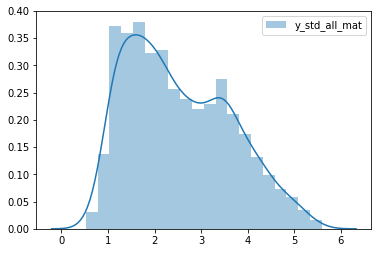

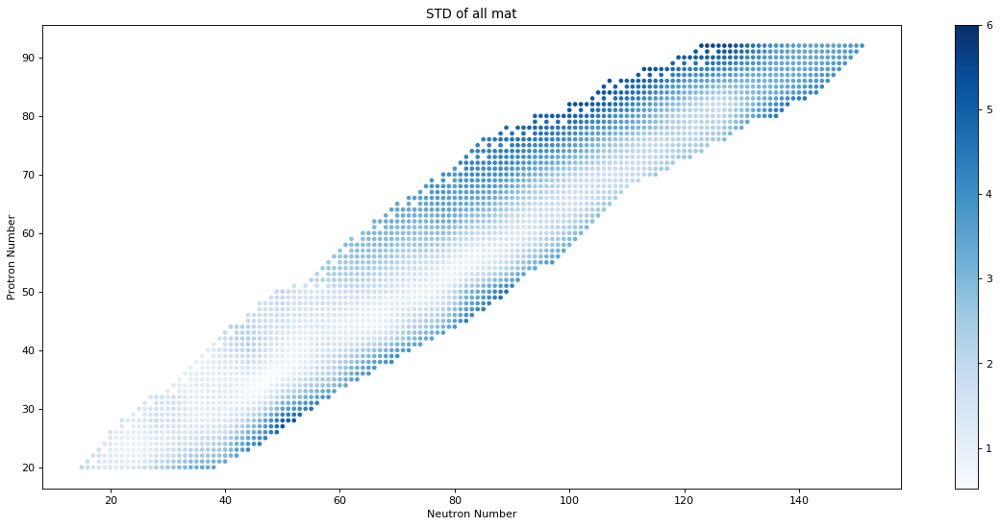

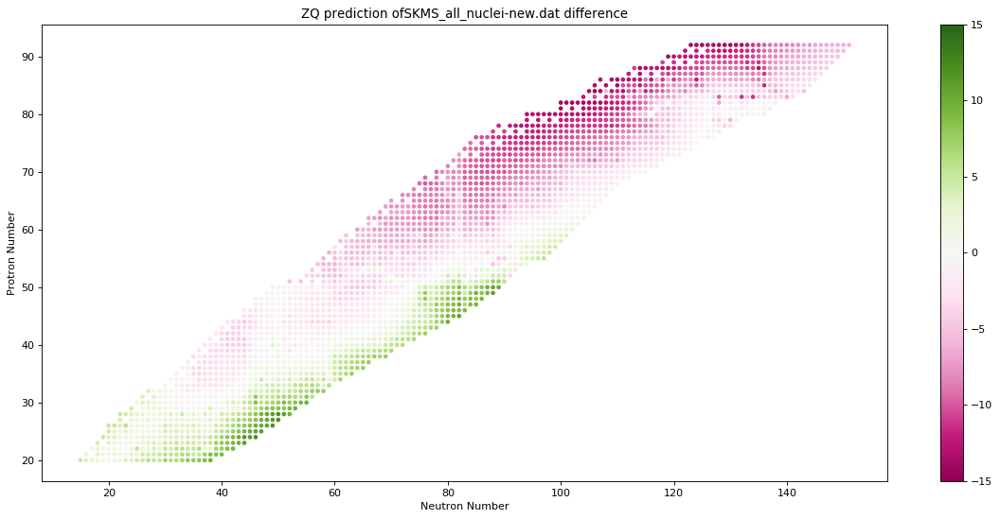

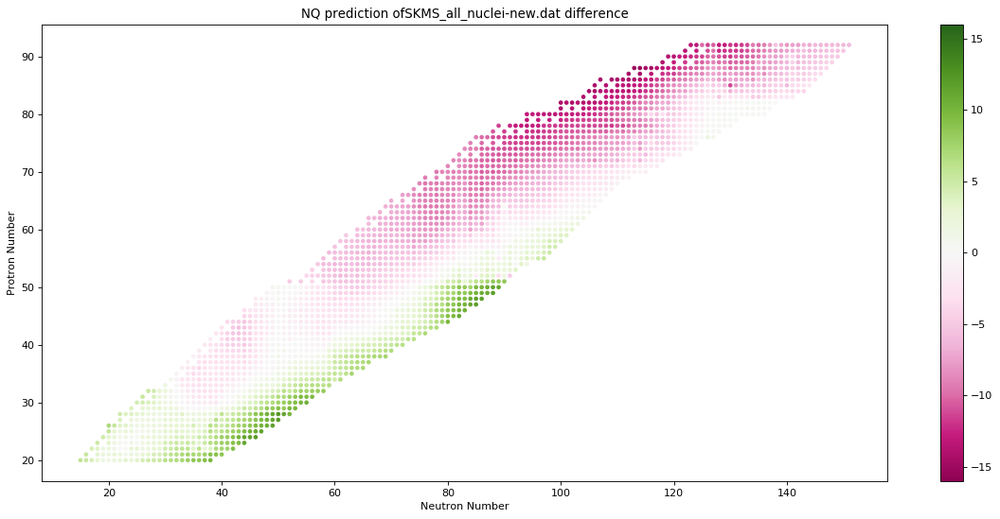

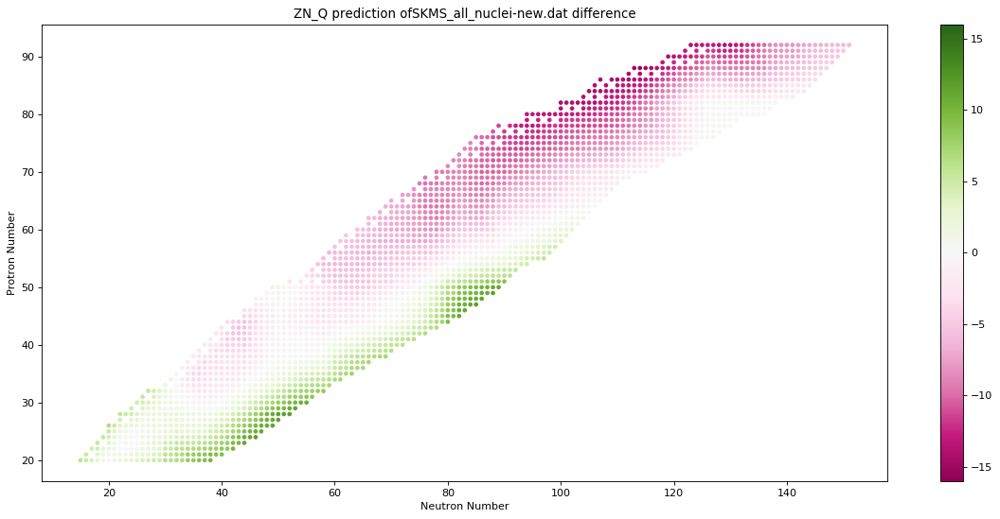

...

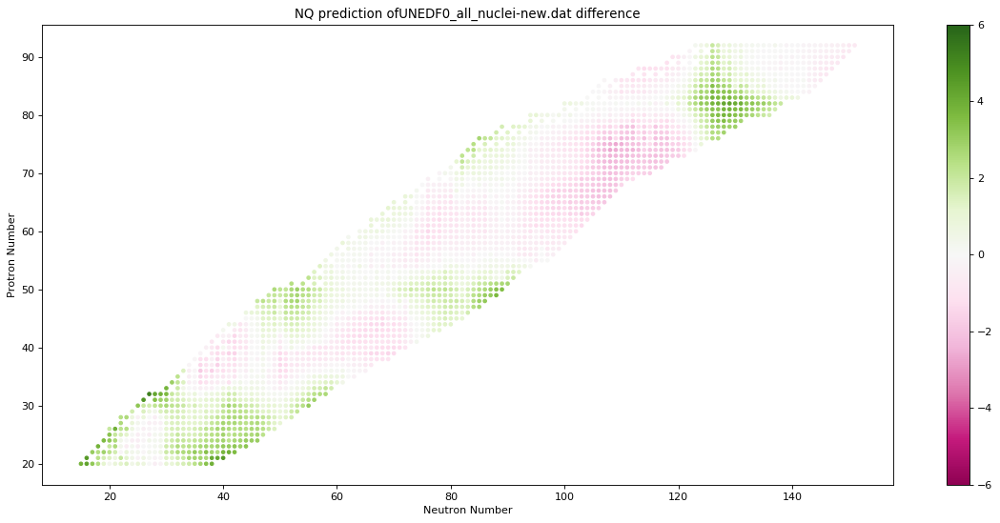

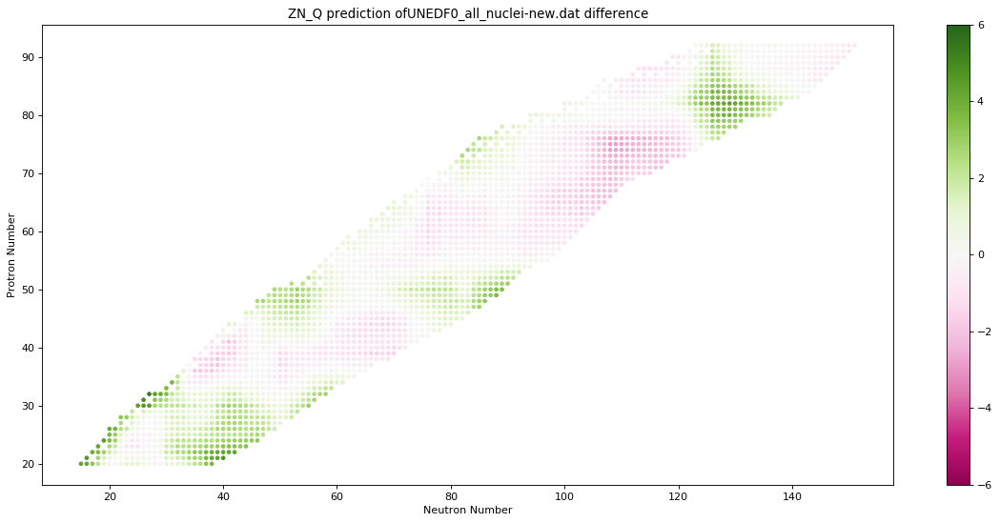

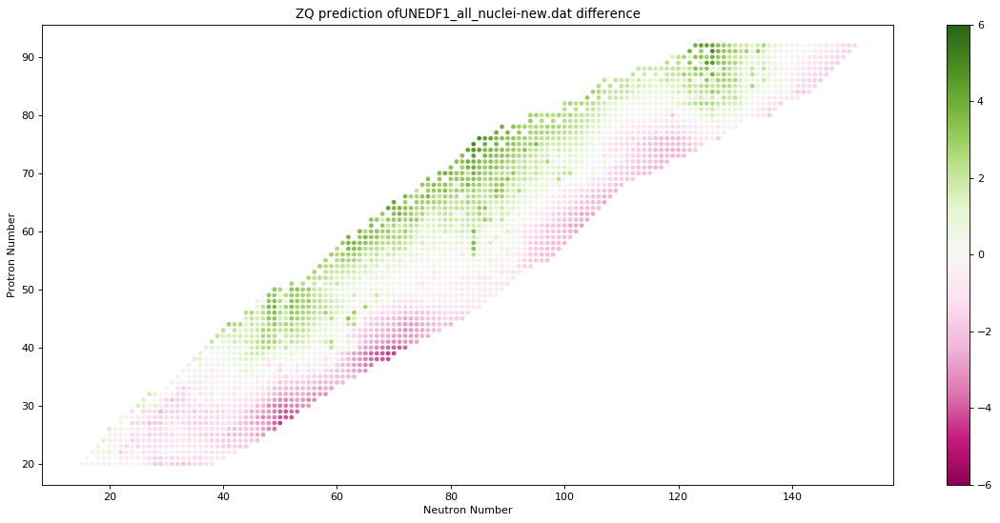

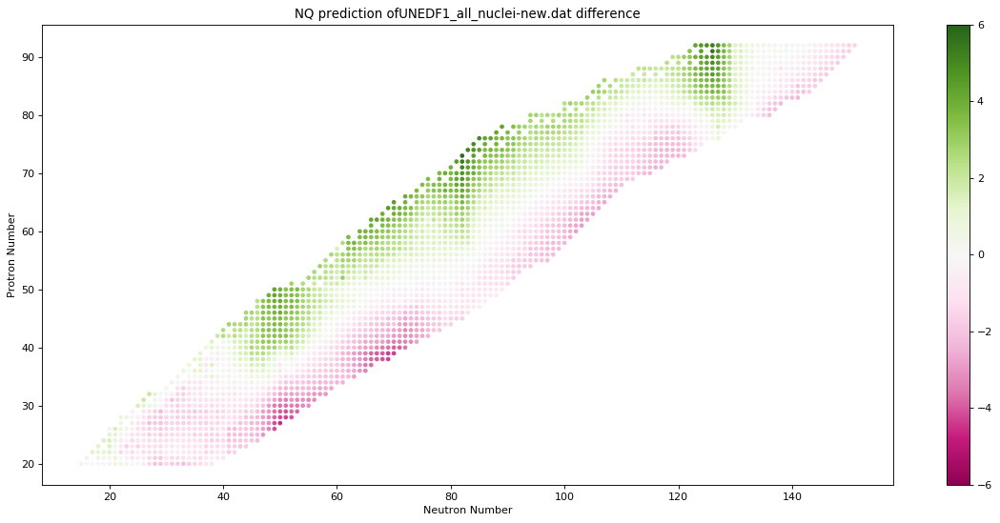

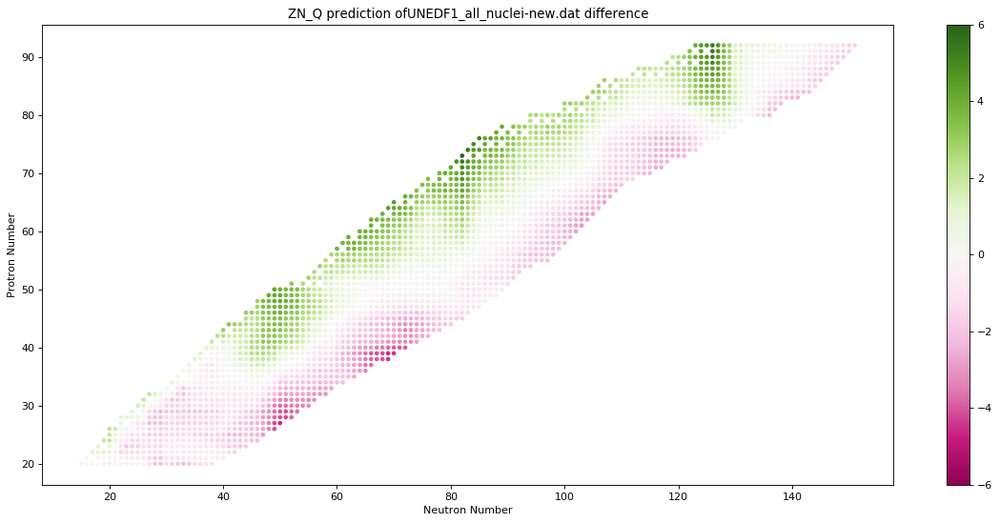

In [10]:
Z_all_mat          =[]
N_all_mat          =[]
y_all_mat          =[[],[],[],[],[],[]]
Q_all_mat          =[[],[],[],[],[],[]]

y_all_mat_d        =[{},{},{},{},{},{}]
Q_all_mat_d        =[{},{},{},{},{},{}]

y_exp_mat          =[]
y_exp_mat_d        ={}

y_std_all_mat      =[]
y_mean_all_mat     =[]

for z in range(19,120):
    for n in range(10, 200):
        try:
            sub=[]
            
            test=y_the_d[0][z,n]
            test=y_the_d[1][z,n]
            test=y_the_d[2][z,n]
            test=y_the_d[3][z,n]
            test=y_the_d[4][z,n]
            test=y_the_d[5][z,n]
            test=y_exp_d[z,n]
            
            y_exp_mat.append(y_exp_d[z,n])
            y_exp_mat_d[z,n]=y_exp_d[z,n]
            
            y_all_mat[0].append(y_the_d[0][z,n])
            y_all_mat_d[0][z,n]=y_the_d[0][z,n]
            Q_all_mat[0].append(Q_the_d[0][z,n])
            Q_all_mat_d[0][z,n]=Q_the_d[0][z,n]
            
            sub.append(y_the_d[0][z,n])
            
            y_all_mat[1].append(y_the_d[1][z,n])
            y_all_mat_d[1][z,n]=y_the_d[1][z,n]
            Q_all_mat[1].append(Q_the_d[1][z,n])
            Q_all_mat_d[1][z,n]=Q_the_d[1][z,n]
            
            sub.append(y_the_d[1][z,n])
            
            y_all_mat[2].append(y_the_d[2][z,n])
            y_all_mat_d[2][z,n]=y_the_d[2][z,n]
            Q_all_mat[2].append(Q_the_d[2][z,n])
            Q_all_mat_d[2][z,n]=Q_the_d[2][z,n]
            
            sub.append(y_the_d[2][z,n])
            
            y_all_mat[3].append(y_the_d[3][z,n])
            y_all_mat_d[3][z,n]=y_the_d[3][z,n]
            Q_all_mat[3].append(Q_the_d[3][z,n])
            Q_all_mat_d[3][z,n]=Q_the_d[3][z,n]
            
            sub.append(y_the_d[3][z,n])
            
            y_all_mat[4].append(y_the_d[4][z,n])
            y_all_mat_d[4][z,n]=y_the_d[4][z,n]
            Q_all_mat[4].append(Q_the_d[4][z,n])
            Q_all_mat_d[4][z,n]=Q_the_d[4][z,n]
            
            sub.append(y_the_d[4][z,n])
            
            y_all_mat[5].append(y_the_d[5][z,n])
            y_all_mat_d[5][z,n]=y_the_d[5][z,n]
            Q_all_mat[5].append(Q_the_d[5][z,n])
            Q_all_mat_d[5][z,n]=Q_the_d[5][z,n]
            
            sub.append(y_the_d[5][z,n])
            
            
            
            y_std_all_mat.append( np.std(sub))
            y_mean_all_mat.append(np.mean(sub))
            Z_all_mat.append(z)
            N_all_mat.append(n)
            
            
        except KeyError:
            continue
 


y_all_mat_w_ZQ_ml      =[[],[],[],[],[],[]]  
y_all_mat_w_NQ_ml      =[[],[],[],[],[],[]]  
y_all_mat_w_ZN_Q_ml    =[[],[],[],[],[],[]]  


y_all_mat_w_diff_Snexp_ZQ_ml      =[[],[],[],[],[],[]]  
diff_Snexp_ZQ_ml_comp             =[[],[],[],[],[],[]]


ZQ_ml_comp             =[[],[],[],[],[],[]]
NQ_ml_comp             =[[],[],[],[],[],[]]
ZN_Q_ml_comp           =[[],[],[],[],[],[]]

for i in range(0,6):
    sub_ZQ    =np.transpose(np.stack( (Z_all_mat,Q_all_mat[i])  ))
    sub_NQ    =np.transpose(np.stack( (N_all_mat,Q_all_mat[i])  ))
    sub_ZN_Q  =np.transpose(np.stack( (Z_all_mat,N_all_mat)  ))
    
    ZQ_ml_comp[i]            =rf_ZQ_name[i].predict(sub_ZQ)
    NQ_ml_comp[i]            =rf_NQ_name[i].predict(sub_NQ)
    ZN_Q_ml_comp[i]          =rf_ZN_Q_name[i].predict(sub_ZN_Q)
    
    
    diff_Snexp_ZQ_ml_comp[i]            =rf_diff_Snexp_ZQ_name[i].predict(sub_ZQ)
    y_all_mat_w_diff_Snexp_ZQ_ml[i]     = y_all_mat[i] -  np.transpose(diff_Snexp_ZQ_ml_comp[i])[0]    
    
    
    
    y_all_mat_w_ZQ_ml[i]     = y_all_mat[i] -  ZQ_ml_comp[i]    
    y_all_mat_w_NQ_ml[i]     = y_all_mat[i] -  NQ_ml_comp[i]    
    y_all_mat_w_ZN_Q_ml[i]   = y_all_mat[i] -  ZN_Q_ml_comp[i] 
    
    print(names[i])
    print("without ml:           ", ki(y_exp_mat, y_all_mat[i]) )        
    print("with ml ZQ ki:        ", ki(y_exp_mat, y_all_mat_w_ZQ_ml[i]) )
    
    print("with ml diff_Snexp ZQ ki:        ", ki(y_exp_mat, y_all_mat_w_diff_Snexp_ZQ_ml[i]) )
    
    
    print("with ml NQ ki:        ", ki(y_exp_mat, y_all_mat_w_NQ_ml[i]) )    
    print("with ml ZN_Q ki:      ", ki(y_exp_mat, y_all_mat_w_ZN_Q_ml[i]), "\n\n" )    

    
            
print("STANDARD DEVIATION WITHOUT ML")
sns.distplot(y_std_all_mat, label='y_std_all_mat')
plt.legend()
plt.show()

   
ext = np.int(np.ceil(max(y_std_all_mat)))
fig = plt.figure(figsize=(18, 8), dpi= 80, facecolor='w', edgecolor='k')
sc  = plt.scatter(N_all_mat,Z_all_mat,c=y_std_all_mat,cmap='Blues',vmax=ext,s=10)
plt.colorbar(sc)
plt.title("STD of all mat")
plt.xlabel('Neutron Number')
plt.ylabel('Protron Number')
plt.show()

    
for i in range(0,6):
    ext = np.int(np.ceil(max(-np.min(ZQ_ml_comp[i]),np.max(ZQ_ml_comp[i]))))
    fig = plt.figure(figsize=(18, 8), dpi= 80, facecolor='w', edgecolor='k')
    sc  = plt.scatter(N_all_mat,Z_all_mat,c=ZQ_ml_comp[i],cmap='PiYG',vmin=-ext,vmax=ext,s=10)
    plt.colorbar(sc)
    plt.title("ZQ prediction of"+names[i]+" difference")
    plt.xlabel('Neutron Number')
    plt.ylabel('Protron Number')
    plt.show()
    
    ext = np.int(np.ceil(max(-np.min(NQ_ml_comp[i]),np.max(NQ_ml_comp[i]))))
    fig = plt.figure(figsize=(18, 8), dpi= 80, facecolor='w', edgecolor='k')
    sc  = plt.scatter(N_all_mat,Z_all_mat,c=NQ_ml_comp[i],cmap='PiYG',vmin=-ext,vmax=ext,s=10)
    plt.colorbar(sc)
    plt.title("NQ prediction of"+names[i]+" difference")
    plt.xlabel('Neutron Number')
    plt.ylabel('Protron Number')
    plt.show()
    
    ext = np.int(np.ceil(max(-np.min(ZN_Q_ml_comp[i]),np.max(ZN_Q_ml_comp[i]))))
    fig = plt.figure(figsize=(18, 8), dpi= 80, facecolor='w', edgecolor='k')
    sc  = plt.scatter(N_all_mat,Z_all_mat,c=ZN_Q_ml_comp[i],cmap='PiYG',vmin=-ext,vmax=ext,s=10)
    plt.colorbar(sc)
    plt.title("ZN_Q prediction of"+names[i]+" difference")
    plt.xlabel('Neutron Number')
    plt.ylabel('Protron Number')
    plt.show()
    
    
    


In [11]:
Z_all_mat          =[]
N_all_mat          =[]
y_all_mat          =[[],[],[],[],[],[]]
Q_all_mat          =[[],[],[],[],[],[]]

y_all_mat_d        =[{},{},{},{},{},{}]
Q_all_mat_d        =[{},{},{},{},{},{}]

#y_exp_mat          =[]
#y_exp_mat_d        ={}

y_std_all_mat      =[]
y_mean_all_mat     =[]
S_n_all_mat        =[[], [], [],  [], [], []]
S_n_all_mat_d      =[{}, {}, {},  {}, {}, {}]

for z in range(19,120):
    for n in range(10, 200):
        try:
            sub=[]
            
            test=y_the_d[0][z,n]
            test=y_the_d[1][z,n]
            test=y_the_d[2][z,n]
            test=y_the_d[3][z,n]
            test=y_the_d[4][z,n]
            test=y_the_d[5][z,n]
            #test=y_exp_d[z,n]
            
            #y_exp_mat.append(y_exp_d[z,n])
            
            y_all_mat[0].append(y_the_d[0][z,n])
            y_all_mat_d[0][z,n]=y_the_d[0][z,n]
            Q_all_mat[0].append(Q_the_d[0][z,n])
            Q_all_mat_d[0][z,n]=Q_the_d[0][z,n]
            
            sub.append(y_the_d[0][z,n])
            
            y_all_mat[1].append(y_the_d[1][z,n])
            y_all_mat_d[1][z,n]=y_the_d[1][z,n]
            Q_all_mat[1].append(Q_the_d[1][z,n])
            Q_all_mat_d[1][z,n]=Q_the_d[1][z,n]
            
            sub.append(y_the_d[1][z,n])
            
            y_all_mat[2].append(y_the_d[2][z,n])
            y_all_mat_d[2][z,n]=y_the_d[2][z,n]
            Q_all_mat[2].append(Q_the_d[2][z,n])
            Q_all_mat_d[2][z,n]=Q_the_d[2][z,n]
            
            sub.append(y_the_d[2][z,n])
            
            y_all_mat[3].append(y_the_d[3][z,n])
            y_all_mat_d[3][z,n]=y_the_d[3][z,n]
            Q_all_mat[3].append(Q_the_d[3][z,n])
            Q_all_mat_d[3][z,n]=Q_the_d[3][z,n]
            
            sub.append(y_the_d[3][z,n])
            
            y_all_mat[4].append(y_the_d[4][z,n])
            y_all_mat_d[4][z,n]=y_the_d[4][z,n]
            Q_all_mat[4].append(Q_the_d[4][z,n])
            Q_all_mat_d[4][z,n]=Q_the_d[4][z,n]
            
            sub.append(y_the_d[4][z,n])
            
            y_all_mat[5].append(y_the_d[5][z,n])
            y_all_mat_d[5][z,n]=y_the_d[5][z,n]
            Q_all_mat[5].append(Q_the_d[5][z,n])
            Q_all_mat_d[5][z,n]=Q_the_d[5][z,n]
            
            S_n_all_mat[0].append(S_n_the_d[0][z,n])
            S_n_all_mat[1].append(S_n_the_d[1][z,n])
            S_n_all_mat[2].append(S_n_the_d[2][z,n])
            S_n_all_mat[3].append(S_n_the_d[3][z,n])
            S_n_all_mat[4].append(S_n_the_d[4][z,n])
            S_n_all_mat[5].append(S_n_the_d[5][z,n])
            
            S_n_all_mat_d[0][z,n]=S_n_the_d[0][z,n]
            S_n_all_mat_d[1][z,n]=S_n_the_d[1][z,n]
            S_n_all_mat_d[2][z,n]=S_n_the_d[2][z,n]
            S_n_all_mat_d[3][z,n]=S_n_the_d[3][z,n]
            S_n_all_mat_d[4][z,n]=S_n_the_d[4][z,n]
            S_n_all_mat_d[5][z,n]=S_n_the_d[5][z,n]
            
            
            sub.append(y_the_d[5][z,n])
            
            
            
            y_std_all_mat.append( np.std(sub))
            y_mean_all_mat.append(np.mean(sub))
            Z_all_mat.append(z)
            N_all_mat.append(n)
            
            
        except KeyError:
            continue
 


y_all_mat_w_ZQ_ml      =[[],[],[],[],[],[]]

y_all_mat_w_diff_Snexp_ZQ_ml      =[[],[],[],[],[],[]]
Snexp_all_mat_w_diff_Snexp_ZQ_ml  =[[],[],[],[],[],[]]


y_all_mat_w_NQ_ml      =[[],[],[],[],[],[]]  
y_all_mat_w_ZN_Q_ml    =[[],[],[],[],[],[]]  
ZQ_ml_comp             =[[],[],[],[],[],[]]
NQ_ml_comp             =[[],[],[],[],[],[]]
ZN_Q_ml_comp           =[[],[],[],[],[],[]]

for i in range(0,6):
    sub_ZQ                   =np.transpose(np.stack( (Z_all_mat,Q_all_mat[i])  ))
    sub_NQ                   =np.transpose(np.stack( (N_all_mat,Q_all_mat[i])  ))
    sub_ZN_Q                 =np.transpose(np.stack( (Z_all_mat,N_all_mat)     ))
    
    ZQ_ml_comp[i]            =rf_ZQ_name[i].predict(sub_ZQ)
    NQ_ml_comp[i]            =rf_NQ_name[i].predict(sub_NQ)
    ZN_Q_ml_comp[i]          =rf_ZN_Q_name[i].predict(sub_ZN_Q)
    
    
    #!!!!!!!!!!!!!!!!!
    #!!!!!!!!!!!!!!!!!
    #!!!!!!!!!!!!!!!!!
    diff_Snexp_ZQ_ml_comp[i]            =rf_diff_Snexp_ZQ_name[i].predict(sub_ZQ)
    y_all_mat_w_diff_Snexp_ZQ_ml[i]     = y_all_mat[i] -  np.transpose(diff_Snexp_ZQ_ml_comp[i])[0]  
    Snexp_all_mat_w_diff_Snexp_ZQ_ml[i] = np.transpose(diff_Snexp_ZQ_ml_comp[i])[1]  
    #!!!!!!!!!!!!!!!!!
    #!!!!!!!!!!!!!!!!!
    #!!!!!!!!!!!!!!!!!
    
    
    y_all_mat_w_ZQ_ml[i]     = y_all_mat[i] -  ZQ_ml_comp[i]    
    y_all_mat_w_NQ_ml[i]     = y_all_mat[i] -  NQ_ml_comp[i]    
    y_all_mat_w_ZN_Q_ml[i]   = y_all_mat[i] -  ZN_Q_ml_comp[i] 
    
y_all_mat_w_ZQ_ml_d      =[{},{},{},  {},{},{}]



y_all_mat_w_diff_Snexp_ZQ_ml_d      =[{},{},{},  {},{},{}]
Snexp_all_mat_w_diff_Snexp_ZQ_ml_d  =[{},{},{},  {},{},{}]

y_all_mat_w_NQ_ml_d      =[{},{},{},  {},{},{}]
y_all_mat_w_ZN_Q_ml_d    =[{},{},{},  {},{},{}]
for i in range(0,6):
    
    for j in range(0,len(y_all_mat_w_ZQ_ml[i])):
        y_all_mat_w_diff_Snexp_ZQ_ml_d[i][Z_all_mat[j],N_all_mat[j]]=y_all_mat_w_diff_Snexp_ZQ_ml[i][j]
        Snexp_all_mat_w_diff_Snexp_ZQ_ml_d[i][Z_all_mat[j],N_all_mat[j]]=np.transpose(diff_Snexp_ZQ_ml_comp[i])[1][j]
    
    
    for j in range(0,len(y_all_mat_w_ZQ_ml[i])):
        y_all_mat_w_ZQ_ml_d[i][Z_all_mat[j],N_all_mat[j]]=y_all_mat_w_ZQ_ml[i][j]
        
    for j in range(0,len(y_all_mat_w_NQ_ml[i])):
        y_all_mat_w_NQ_ml_d[i][Z_all_mat[j],N_all_mat[j]]=y_all_mat_w_NQ_ml[i][j]
        
    for j in range(0,len(y_all_mat_w_ZN_Q_ml[i])):
        y_all_mat_w_ZN_Q_ml_d[i][Z_all_mat[j],N_all_mat[j]]=y_all_mat_w_ZN_Q_ml[i][j]
        
    
    print(np.shape(y_all_mat_w_diff_Snexp_ZQ_ml_d[i]))
    print(np.shape(y_all_mat_w_diff_Snexp_ZQ_ml[i]))
    print(np.shape(np.transpose(diff_Snexp_ZQ_ml_comp[i])[1]))
    print(np.shape(Snexp_all_mat_w_diff_Snexp_ZQ_ml_d[i]))

"""  
print("STANDARD DEVIATION WITHOUT ML")
sns.distplot(y_std_all_mat, label='y_std_all_mat')
plt.legend()
plt.show()

   
ext = np.int(np.ceil(max(y_std_all_mat)))
fig = plt.figure(figsize=(18, 8), dpi= 80, facecolor='w', edgecolor='k')
sc  = plt.scatter(N_all_mat,Z_all_mat,c=y_std_all_mat,cmap='Blues',vmax=ext,s=10)
plt.colorbar(sc)
plt.title("STD of all mat")
plt.xlabel('Neutron Number')
plt.ylabel('Protron Number')
plt.show()



    
for i in range(0,6):
    ext = np.int(np.ceil(max(-np.min(ZQ_ml_comp[i]),np.max(ZQ_ml_comp[i]))))
    fig = plt.figure(figsize=(18, 8), dpi= 80, facecolor='w', edgecolor='k')
    sc  = plt.scatter(N_all_mat,Z_all_mat,c=ZQ_ml_comp[i],cmap='PiYG',vmin=-ext,vmax=ext,s=10)
    plt.colorbar(sc)
    plt.title(names[i]+ " ZQ")
    plt.xlabel('Neutron Number')
    plt.ylabel('Protron Number')
    plt.show()
    
    ext = np.int(np.ceil(max(-np.min(NQ_ml_comp[i]),np.max(NQ_ml_comp[i]))))
    fig = plt.figure(figsize=(18, 8), dpi= 80, facecolor='w', edgecolor='k')
    sc  = plt.scatter(N_all_mat,Z_all_mat,c=NQ_ml_comp[i],cmap='PiYG',vmin=-ext,vmax=ext,s=10)
    plt.colorbar(sc)
    plt.title(names[i]+ " NQ")
    plt.xlabel('Neutron Number')
    plt.ylabel('Protron Number')
    plt.show()
    
    ext = np.int(np.ceil(max(-np.min(ZN_Q_ml_comp[i]),np.max(ZN_Q_ml_comp[i]))))
    fig = plt.figure(figsize=(18, 8), dpi= 80, facecolor='w', edgecolor='k')
    sc  = plt.scatter(N_all_mat,Z_all_mat,c=ZN_Q_ml_comp[i],cmap='PiYG',vmin=-ext,vmax=ext,s=10)
    plt.colorbar(sc)
    plt.title(names[i]+ " ZN_Q")
    plt.xlabel('Neutron Number')
    plt.ylabel('Protron Number')
    plt.show()
    
    
"""  


()
(4395,)
(4395,)
()
()
(4395,)
(4395,)
()
()
(4395,)
(4395,)
()
()
(4395,)
(4395,)
()
()
(4395,)
(4395,)
()
()
(4395,)
(4395,)
()


'  \nprint("STANDARD DEVIATION WITHOUT ML")\nsns.distplot(y_std_all_mat, label=\'y_std_all_mat\')\nplt.legend()\nplt.show()\n\n   \next = np.int(np.ceil(max(y_std_all_mat)))\nfig = plt.figure(figsize=(18, 8), dpi= 80, facecolor=\'w\', edgecolor=\'k\')\nsc  = plt.scatter(N_all_mat,Z_all_mat,c=y_std_all_mat,cmap=\'Blues\',vmax=ext,s=10)\nplt.colorbar(sc)\nplt.title("STD of all mat")\nplt.xlabel(\'Neutron Number\')\nplt.ylabel(\'Protron Number\')\nplt.show()\n\n\n\n    \nfor i in range(0,6):\n    ext = np.int(np.ceil(max(-np.min(ZQ_ml_comp[i]),np.max(ZQ_ml_comp[i]))))\n    fig = plt.figure(figsize=(18, 8), dpi= 80, facecolor=\'w\', edgecolor=\'k\')\n    sc  = plt.scatter(N_all_mat,Z_all_mat,c=ZQ_ml_comp[i],cmap=\'PiYG\',vmin=-ext,vmax=ext,s=10)\n    plt.colorbar(sc)\n    plt.title(names[i]+ " ZQ")\n    plt.xlabel(\'Neutron Number\')\n    plt.ylabel(\'Protron Number\')\n    plt.show()\n    \n    ext = np.int(np.ceil(max(-np.min(NQ_ml_comp[i]),np.max(NQ_ml_comp[i]))))\n    fig = plt.figure(

In [12]:
Snexp_all_mat_w_diff_Snexp_ZQ_ml_d[0]

{(20, 15): -14.229814091000218,
 (20, 16): -17.89061326600023,
 (20, 17): -14.45958307000015,
 (20, 18): -16.66028831500002,
 (20, 19): -13.889003781000163,
 (20, 20): -13.455356358999989,
 (20, 21): -10.282964447999973,
 (20, 22): -11.02106471900003,
 (20, 23): -8.308153633000007,
 (20, 24): -8.808987467000108,
 (20, 25): -6.9996154869999145,
 (20, 26): -9.139018023999947,
 (20, 27): -5.398093922000076,
 (20, 28): -7.935534382000121,
 (20, 29): -5.996975544000037,
 (20, 30): -5.704182715000086,
 (20, 31): -5.978294710000055,
 (20, 32): -5.701970435000052,
 (20, 33): -3.649512814000059,
 (20, 34): -4.216984766000059,
 (20, 35): -2.9555480470000277,
 (20, 36): -4.174412006,
 (20, 37): -2.312219995999992,
 (20, 38): -3.1837126590000198,
 (20, 39): -3.123490998999984,
 (20, 40): -2.457533998999982,
 (20, 42): -3.466371999000026,
 (20, 44): -3.466371999000026,
 (20, 46): -3.466371999000026,
 (20, 48): -3.466371999000026,
 (21, 16): -17.26512459899994,
 (21, 18): -17.477058896000155,
 (21, 

All standard deviations


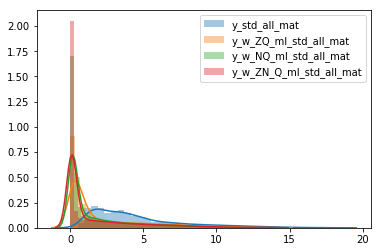

STANDARD DEVIATION WITHOUT ML


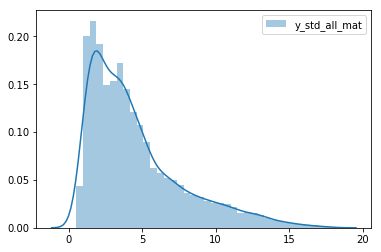

STANDARD DEVIATION WITH ZQ ML


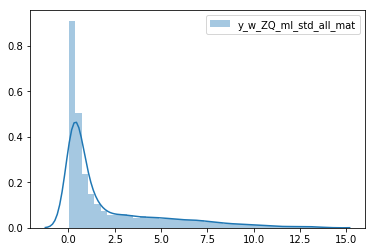

STANDARD DEVIATION WITH NQ ML


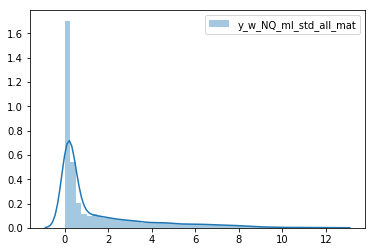

STANDARD DEVIATION WITH ZN_Q ML


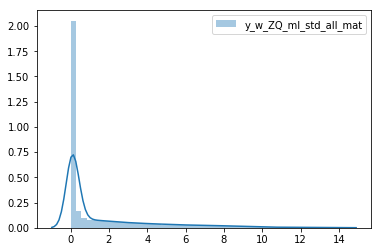

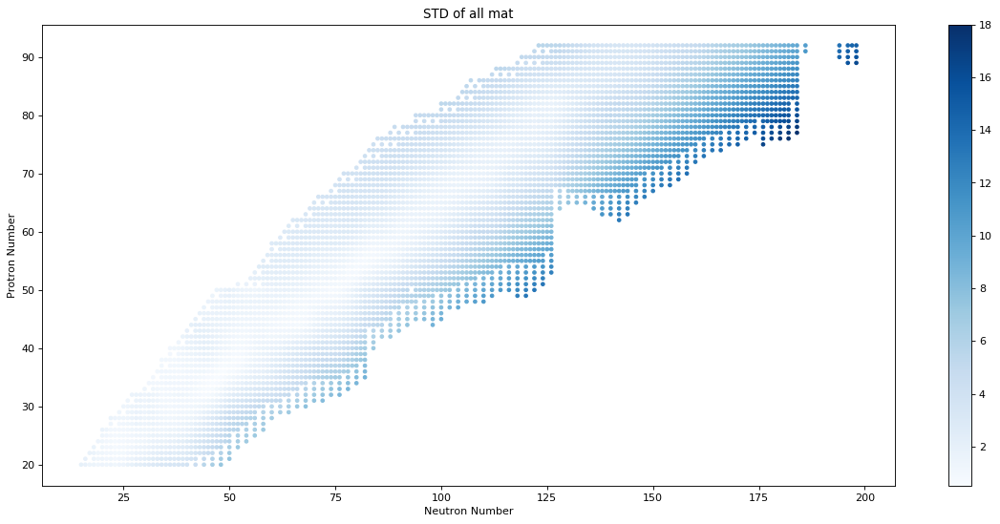

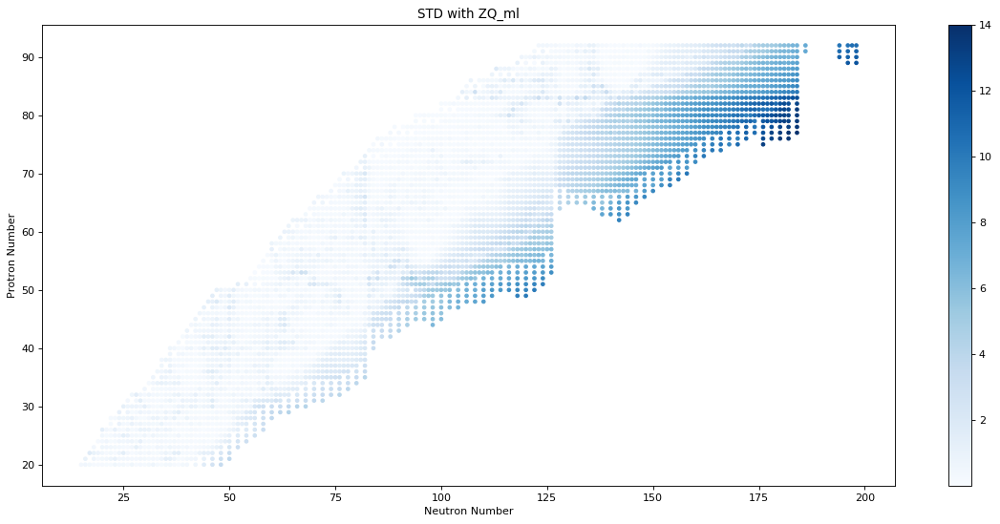

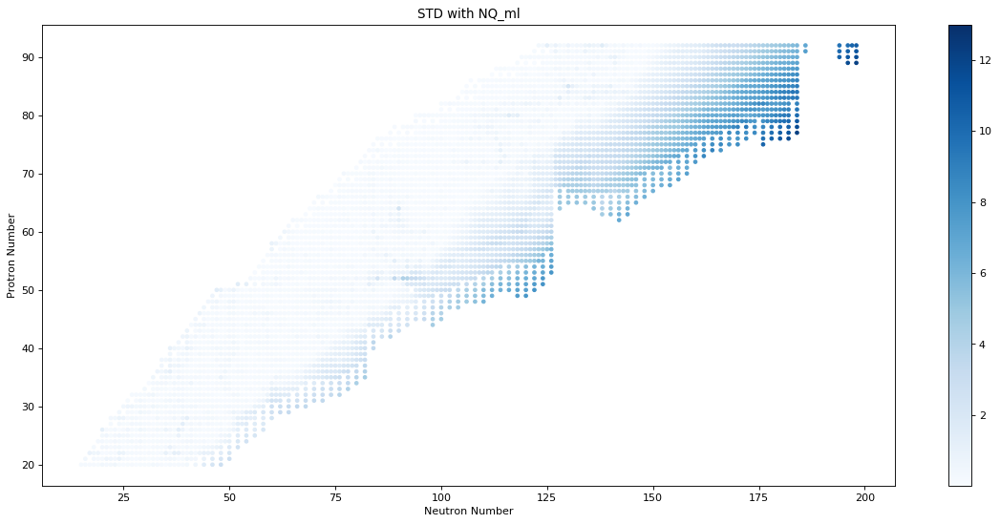

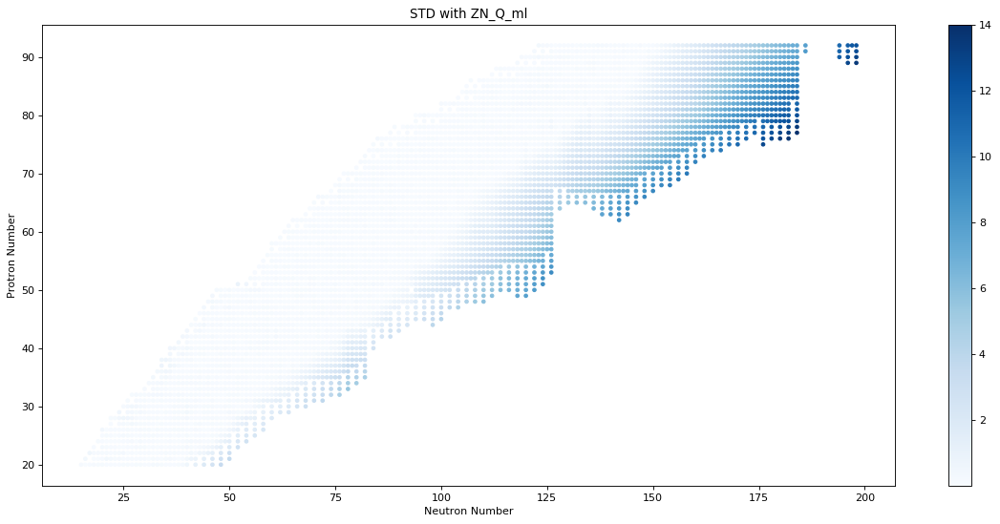

In [13]:
y_w_ZQ_ml_std_all_mat=[]
for i in range(0,len(y_all_mat_w_ZQ_ml[0])):
    sub=[]
    for j in range(0,6):
        sub.append(y_all_mat_w_ZQ_ml[j][i])
    y_w_ZQ_ml_std_all_mat.append(np.std(sub))


y_w_NQ_ml_std_all_mat=[]
for i in range(0,len(y_all_mat_w_NQ_ml[0])):
    sub=[]
    for j in range(0,6):
        sub.append(y_all_mat_w_NQ_ml[j][i])
    
    y_w_NQ_ml_std_all_mat.append(np.std(sub))
    


y_w_ZN_Q_ml_std_all_mat=[]
for i in range(0,len(y_all_mat_w_ZN_Q_ml[0])):
    sub=[]
    for j in range(0,6):
        sub.append(y_all_mat_w_ZN_Q_ml[j][i])
    
    y_w_ZN_Q_ml_std_all_mat.append(np.std(sub))

    
    
    
print("All standard deviations")   
sns.distplot(y_std_all_mat,           label='y_std_all_mat')
sns.distplot(y_w_ZQ_ml_std_all_mat,   label='y_w_ZQ_ml_std_all_mat')
sns.distplot(y_w_NQ_ml_std_all_mat,   label='y_w_NQ_ml_std_all_mat')
sns.distplot(y_w_ZN_Q_ml_std_all_mat, label='y_w_ZN_Q_ml_std_all_mat')
plt.legend()
plt.show()

    
print("STANDARD DEVIATION WITHOUT ML")
sns.distplot(y_std_all_mat, label='y_std_all_mat')
plt.legend()
plt.show()

print("STANDARD DEVIATION WITH ZQ ML")
sns.distplot(y_w_ZQ_ml_std_all_mat, label='y_w_ZQ_ml_std_all_mat')
plt.legend()
plt.show()

print("STANDARD DEVIATION WITH NQ ML")
sns.distplot(y_w_NQ_ml_std_all_mat, label='y_w_NQ_ml_std_all_mat')
plt.legend()
plt.show()

print("STANDARD DEVIATION WITH ZN_Q ML")
sns.distplot(y_w_ZN_Q_ml_std_all_mat, label='y_w_ZQ_ml_std_all_mat')
plt.legend()
plt.show()



ext = np.int(np.ceil(max(y_std_all_mat)))
fig = plt.figure(figsize=(18, 8), dpi= 80, facecolor='w', edgecolor='k')
sc  = plt.scatter(N_all_mat,Z_all_mat,c=y_std_all_mat,cmap='Blues',vmax=ext,s=10)
plt.colorbar(sc)
plt.title("STD of all mat")
plt.xlabel('Neutron Number')
plt.ylabel('Protron Number')
plt.show()

ext = np.int(np.ceil(max(y_w_ZQ_ml_std_all_mat)))
fig = plt.figure(figsize=(18, 8), dpi= 80, facecolor='w', edgecolor='k')
sc  = plt.scatter(N_all_mat,Z_all_mat,c=y_w_ZQ_ml_std_all_mat,cmap='Blues',vmax=ext,s=10)
plt.colorbar(sc)
plt.title("STD with ZQ_ml")
plt.xlabel('Neutron Number')
plt.ylabel('Protron Number')
plt.show()

ext = np.int(np.ceil(max(y_w_NQ_ml_std_all_mat)))
fig = plt.figure(figsize=(18, 8), dpi= 80, facecolor='w', edgecolor='k')
sc  = plt.scatter(N_all_mat,Z_all_mat,c=y_w_NQ_ml_std_all_mat,cmap='Blues',vmax=ext,s=10)
plt.colorbar(sc)
plt.title("STD with NQ_ml")
plt.xlabel('Neutron Number')
plt.ylabel('Protron Number')
plt.show()

ext = np.int(np.ceil(max(y_w_ZN_Q_ml_std_all_mat)))
fig = plt.figure(figsize=(18, 8), dpi= 80, facecolor='w', edgecolor='k')
sc  = plt.scatter(N_all_mat,Z_all_mat,c=y_w_ZN_Q_ml_std_all_mat,cmap='Blues',vmax=ext,s=10)
plt.colorbar(sc)
plt.title("STD with ZN_Q_ml")
plt.xlabel('Neutron Number')
plt.ylabel('Protron Number')
plt.show()


## Binding Energies and Separation Energies

experimental, theoretical, the+3 mls one theory unedf0

!!!! (30,)
!!!! (30,)


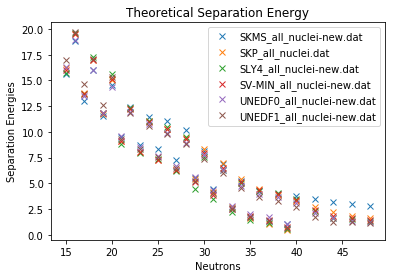

In [14]:
N_Ca_exp                =[]
y_Ca_exp                =[]

N_Ca_the                =[[],[],[],[],[],[]]
y_Ca_the                =[[],[],[],[],[],[]]

N_Ca_the_w_ZQ_ml        =[[],[],[],[],[],[]]
y_Ca_the_w_ZQ_ml        =[[],[],[],[],[],[]]




N_Ca_the_w_diff_Snexp_ZQ_ml        =[[],[],[],[],[],[]]
y_Ca_the_w_diff_Snexp_ZQ_ml        =[[],[],[],[],[],[]]

Sn_Ca_the_w_diff_Snexp_ZQ_ml       =[[],[],[],[],[],[]]




N_Ca_the_w_NQ_ml        =[[],[],[],[],[],[]]
y_Ca_the_w_NQ_ml        =[[],[],[],[],[],[]]

N_Ca_the_w_ZN_Q_ml      =[[],[],[],[],[],[]]
y_Ca_the_w_ZN_Q_ml      =[[],[],[],[],[],[]]


for n in range(0, 250):
    try:
        y_Ca_exp.append(y_exp_d[20,n])
        N_Ca_exp.append(n)
    except KeyError:
        continue
        
        
for n in range(0, 250):    
    for i in range(0,6):
        try:
            y_Ca_the[i].append(y_all_mat_d[i][20,n])
            N_Ca_the[i].append(n)
        except KeyError:
            continue
        
for n in range(0, 250):
    for i in range(0,6):
        try:
            y_Ca_the_w_ZQ_ml[i].append(y_all_mat_w_ZQ_ml_d[i][20,n])
            N_Ca_the_w_ZQ_ml[i].append(n)
        except KeyError:
            continue

for n in range(0, 250):
    for i in range(0,6):
        try:
            y_Ca_the_w_diff_Snexp_ZQ_ml[i].append(y_all_mat_w_diff_Snexp_ZQ_ml_d[i][20,n])
            
            
            N_Ca_the_w_diff_Snexp_ZQ_ml[i].append(n)
        except KeyError:
            continue
            

            
N_Ca_the_w_given_diff_Snexp_ZQ_ml=[[],[],[], [],[],[],]
for n in range(0, 250):
    for i in range(0,6):
        try:
            
            Sn_Ca_the_w_diff_Snexp_ZQ_ml[i].append(-Snexp_all_mat_w_diff_Snexp_ZQ_ml_d[i][20,n])
            
            N_Ca_the_w_given_diff_Snexp_ZQ_ml[i].append(n)
        except KeyError:
            continue
      

print("!!!!", np.shape(y_Ca_the_w_diff_Snexp_ZQ_ml[i]))
print("!!!!", np.shape(Sn_Ca_the_w_diff_Snexp_ZQ_ml[i]))
 
            
for n in range(0, 250):
    for i in range(0,6):
        try:
            y_Ca_the_w_NQ_ml[i].append(y_all_mat_w_NQ_ml_d[i][20,n])
            N_Ca_the_w_NQ_ml[i].append(n)
        except KeyError:
            continue

for n in range(0, 250):
    for i in range(0,6):
        try:
            y_Ca_the_w_ZN_Q_ml[i].append(y_all_mat_w_ZN_Q_ml_d[i][20,n])
            N_Ca_the_w_ZN_Q_ml[i].append(n)
        except KeyError:
            continue
            
S_n_given = [[],[],[],[],[],[],]
n_given   = [[],[],[],[],[],[],]

for i in range(0,6):
    for n in range(0,250):
        try:
            S_n_given[i].append(-S_n_all_mat_d[i][20,n])
            n_given[i].append(n)
        except KeyError:
            continue


for i in range(0,6):
    plt.plot(n_given[i], S_n_given[i],'x', label=names[i])

plt.legend()
plt.title("Theoretical Separation Energy")
plt.xlabel("Neutrons")
plt.ylabel("Separation Energies")
plt.show()

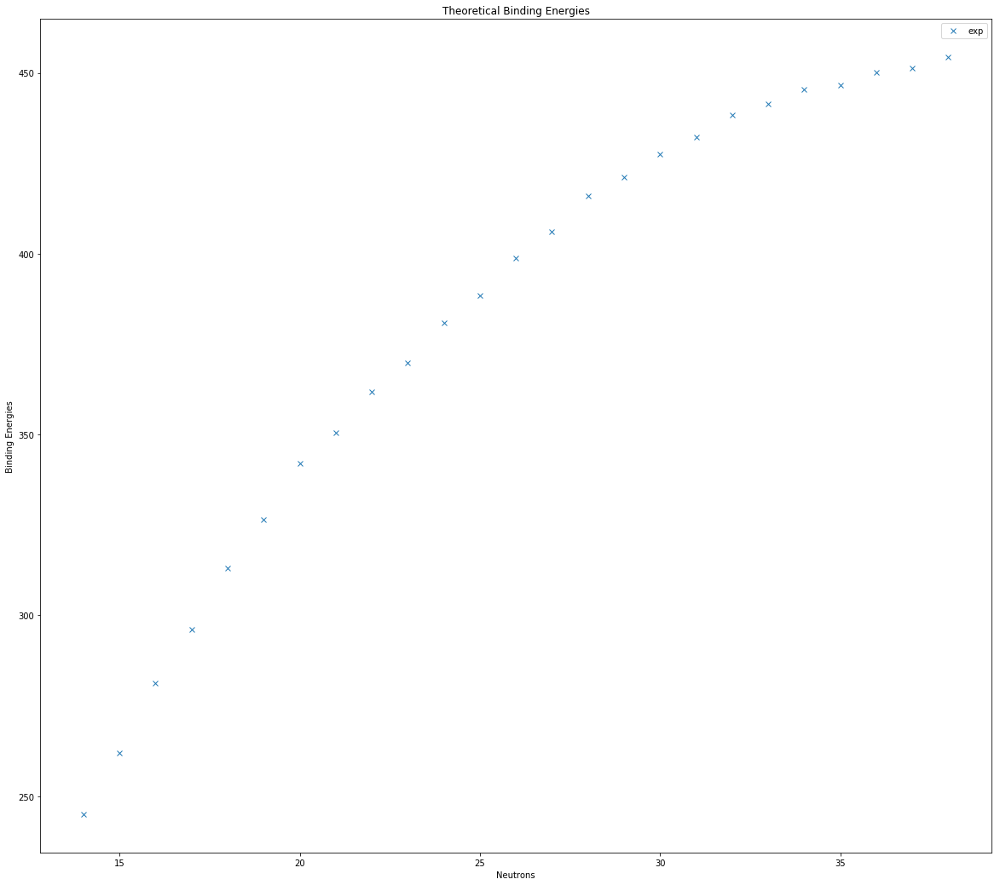

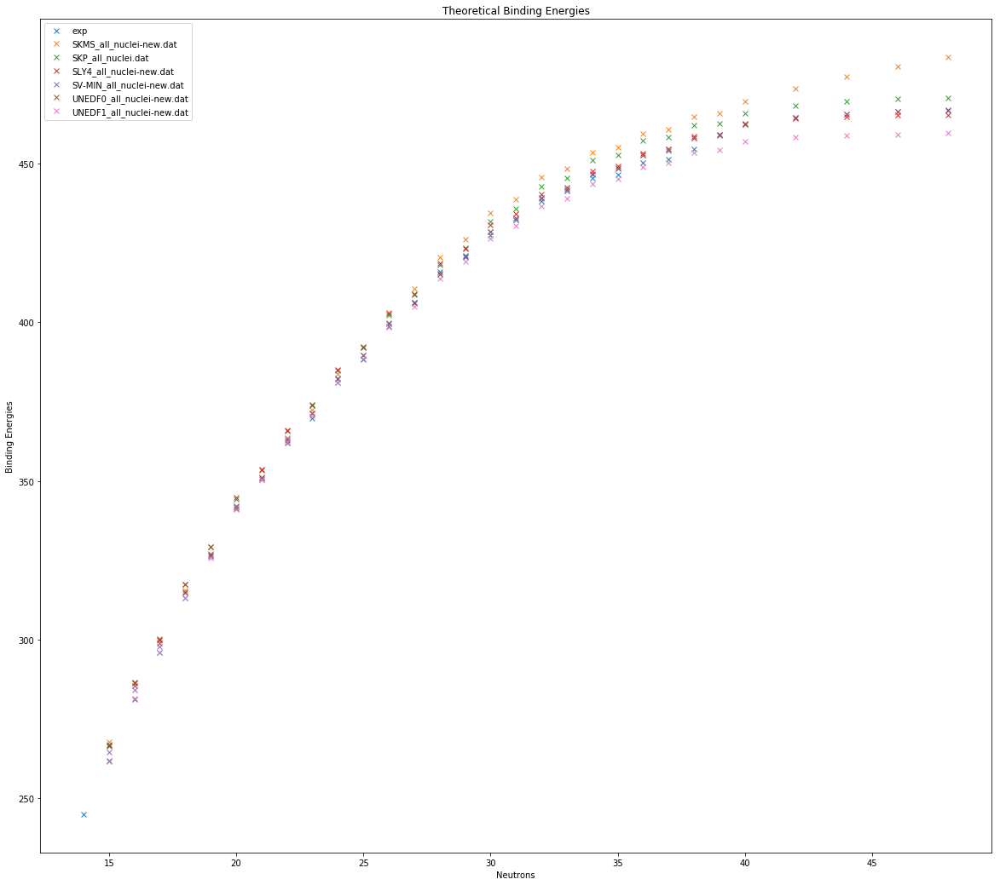

w_ZQ_ml


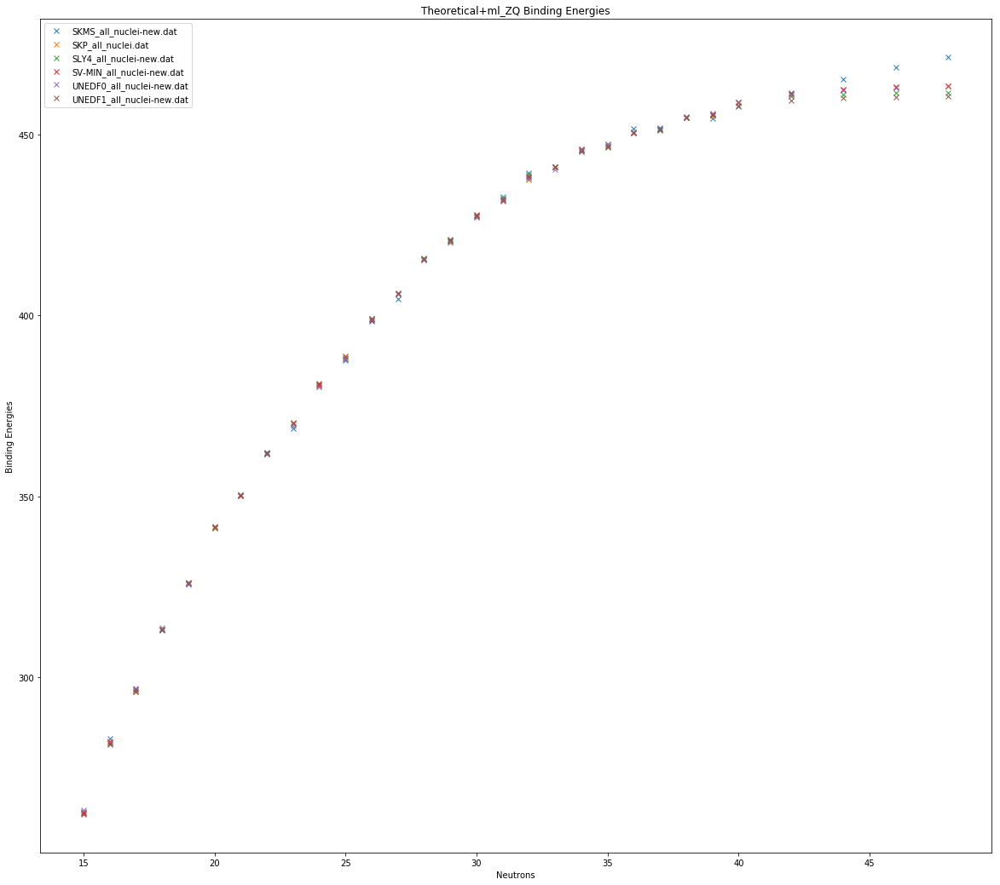

w_diff_Snexp_ZQ_ml


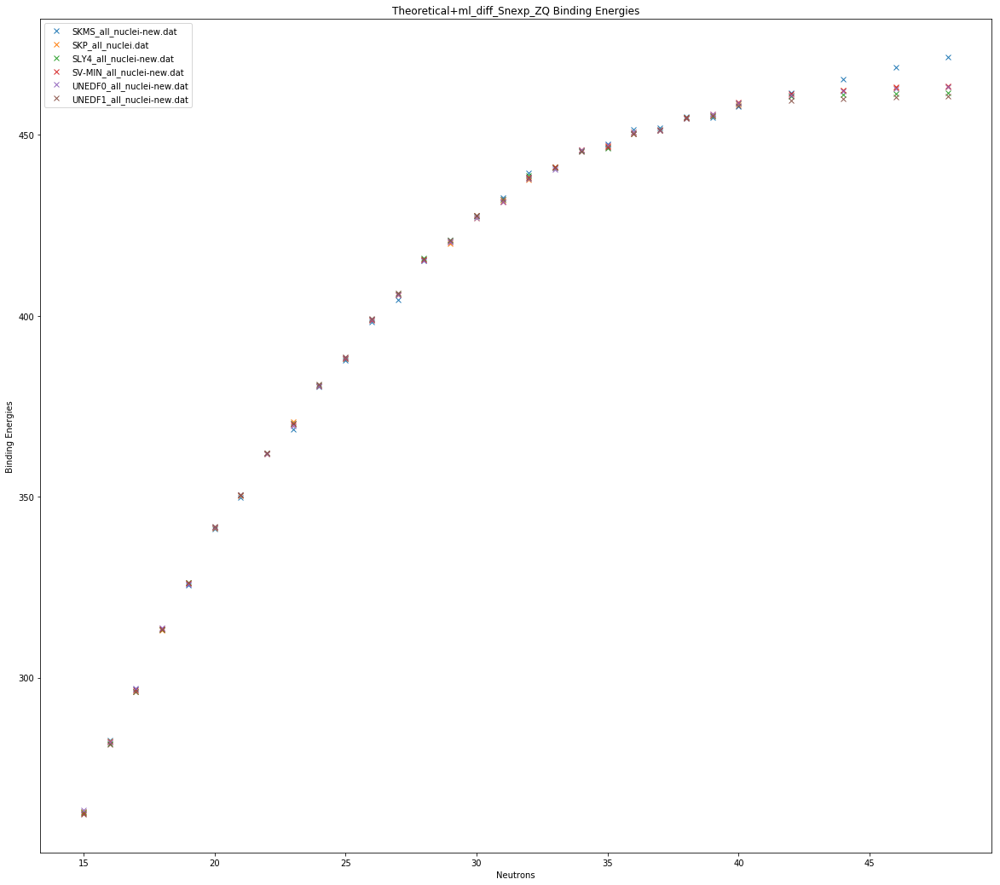

'\nprint("w_NQ_ml")\nfor i in range(0,6):\n    plt.plot(N_Ca_the_w_NQ_ml[i], y_Ca_the_w_NQ_ml[i], \'x\', label=names[i])\nplt.legend()\nplt.title("Theoretical+ml_NQ Binding Energies")\nplt.xlabel("Neutrons")\nplt.ylabel("Binding Energies")\nplt.show()\n\nprint("w_ZN_Q_ml")\nfor i in range(0,6):\n    plt.plot(N_Ca_the_w_ZN_Q_ml[i], y_Ca_the_w_ZN_Q_ml[i], \'x\', label=names[i])\nplt.legend()\nplt.title("Theoretical+ml_ZN_Q Binding Energies")\nplt.xlabel("Neutrons")\nplt.ylabel("Binding Energies")\nplt.show()\n'

In [70]:

plt.plot(N_Ca_exp, y_Ca_exp, 'x', label="exp")
plt.legend()
plt.title("Theoretical Binding Energies")
plt.xlabel("Neutrons")
plt.ylabel("Binding Energies")
plt.show()

plt.plot(N_Ca_exp, y_Ca_exp, 'x', label="exp")
for i in range(0,6):
    plt.plot(N_Ca_the[i], y_Ca_the[i], 'x', label=names[i])
plt.legend()
plt.title("Theoretical Binding Energies")
plt.xlabel("Neutrons")
plt.ylabel("Binding Energies")
plt.show()


print("w_ZQ_ml")
for i in range(0,6):
    plt.plot(N_Ca_the_w_ZQ_ml[i], y_Ca_the_w_ZQ_ml[i], 'x', label=names[i])
plt.legend()
plt.title("Theoretical+ml_ZQ Binding Energies")
plt.xlabel("Neutrons")
plt.ylabel("Binding Energies")
plt.show()

print("w_diff_Snexp_ZQ_ml")
for i in range(0,6):
    plt.plot(N_Ca_the_w_diff_Snexp_ZQ_ml[i], y_Ca_the_w_diff_Snexp_ZQ_ml[i], 'x', label=names[i])
plt.legend()
plt.title("Theoretical+ml_diff_Snexp_ZQ Binding Energies")
plt.xlabel("Neutrons")
plt.ylabel("Binding Energies")
plt.show()


"""
print("w_NQ_ml")
for i in range(0,6):
    plt.plot(N_Ca_the_w_NQ_ml[i], y_Ca_the_w_NQ_ml[i], 'x', label=names[i])
plt.legend()
plt.title("Theoretical+ml_NQ Binding Energies")
plt.xlabel("Neutrons")
plt.ylabel("Binding Energies")
plt.show()

print("w_ZN_Q_ml")
for i in range(0,6):
    plt.plot(N_Ca_the_w_ZN_Q_ml[i], y_Ca_the_w_ZN_Q_ml[i], 'x', label=names[i])
plt.legend()
plt.title("Theoretical+ml_ZN_Q Binding Energies")
plt.xlabel("Neutrons")
plt.ylabel("Binding Energies")
plt.show()
"""

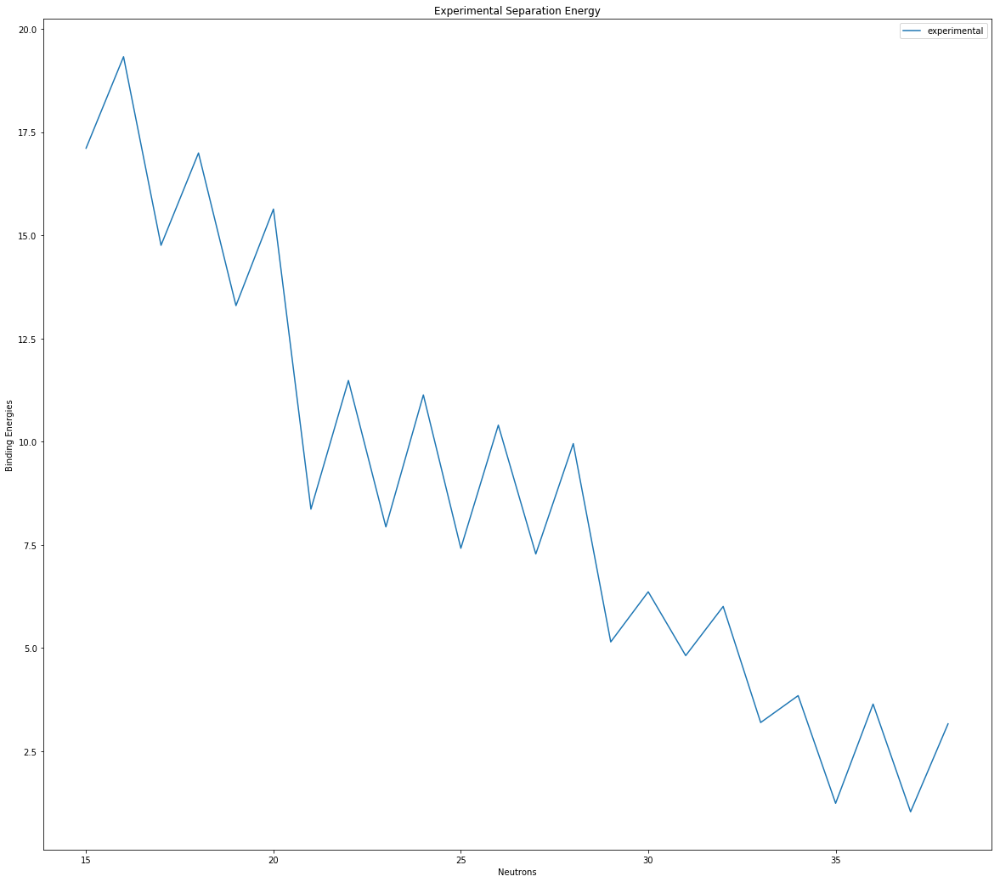

Separation Energy made from theoretical predictions


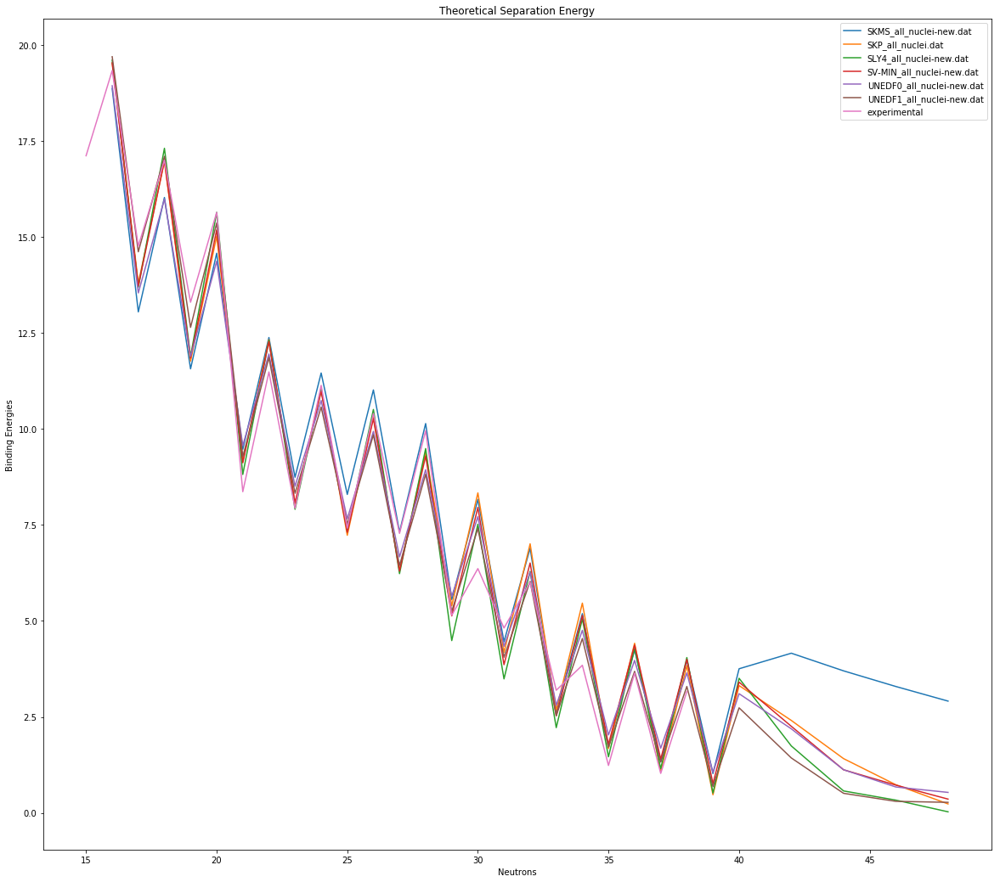

Made Separation Energy from prediction of diff alone


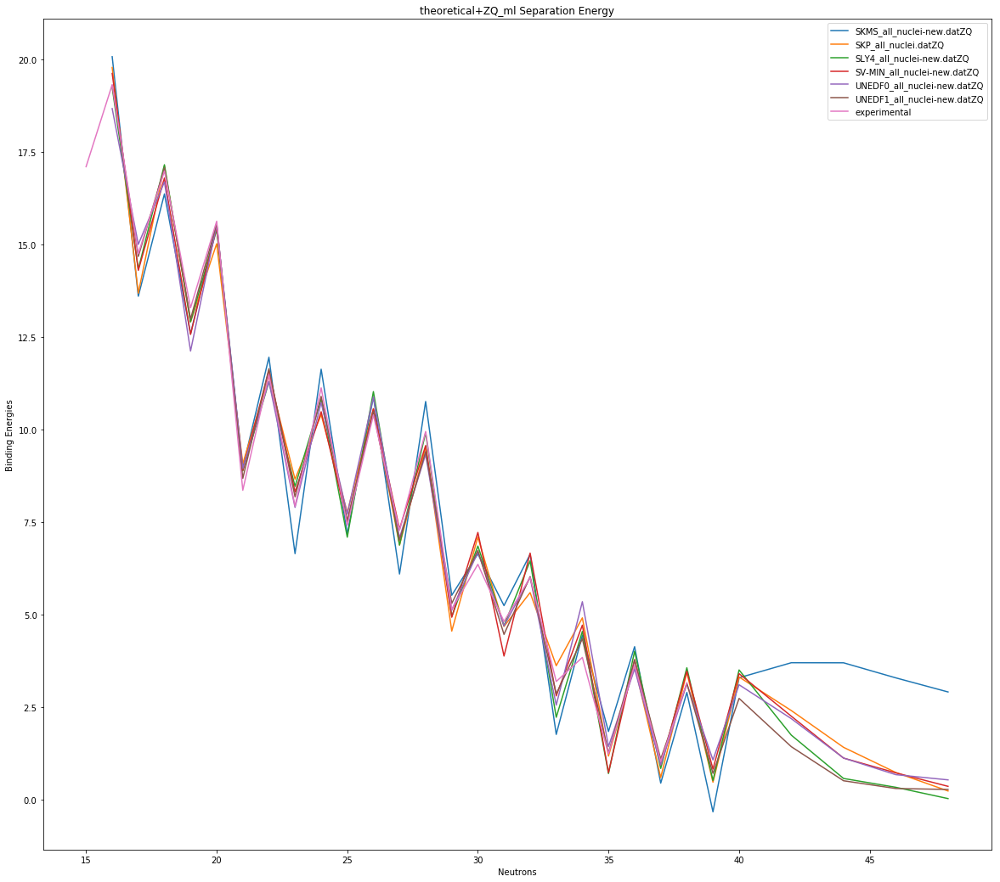

Made Separation Energy from prediction of diff + Sn combo


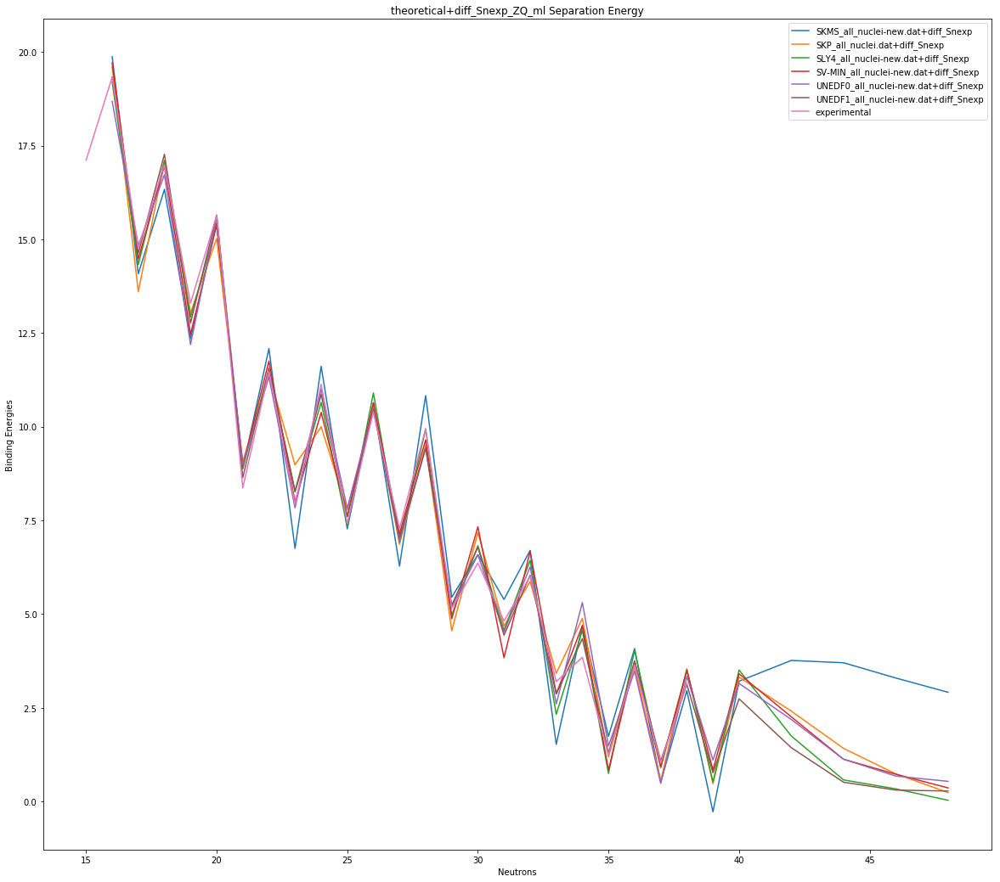

Separation energy made from diff + Sn combo 


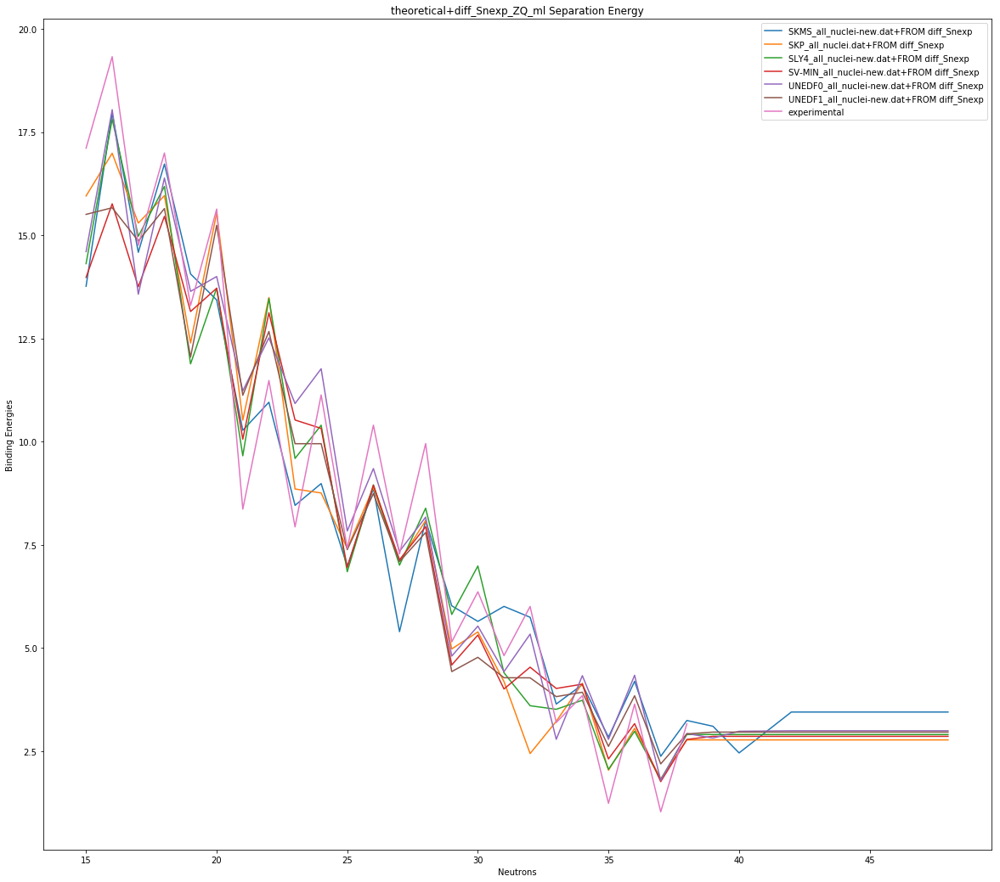

'\nfor j in range(0,6):\n    for i in range(1, len(N_Ca_the_w_NQ_ml[j])):\n        Se_Ca_the_w_NQ_ml[j].append(y_Ca_the_w_NQ_ml[j][i]-y_Ca_the_w_NQ_ml[j][i-1])\n        N_Ca_S_the_w_NQ_ml[j].append(N_Ca_the_w_NQ_ml[j][i])\n    plt.plot(N_Ca_S_the_w_NQ_ml[j], Se_Ca_the_w_NQ_ml[j], \'x\',  markersize=15,label=names[j])\n\nplt.title("theoretical+NQ_ml Separation Energy")\nplt.legend()\nplt.xlabel("Neutrons")\nplt.ylabel("Binding Energies")\nplt.show() \n\nfor j in range(0,6):\n    for i in range(1, len(N_Ca_the_w_ZN_Q_ml[j])):\n        Se_Ca_the_w_ZN_Q_ml[j].append(y_Ca_the_w_ZN_Q_ml[j][i]-y_Ca_the_w_ZN_Q_ml[j][i-1])\n        N_Ca_S_the_w_ZN_Q_ml[j].append(N_Ca_the_w_ZN_Q_ml[j][i])\n    plt.plot(N_Ca_S_the_w_ZN_Q_ml[j], Se_Ca_the_w_ZN_Q_ml[j], \'x\', markersize=15, label=names[j])\n\nplt.legend()\nplt.title("theoretical+ZN_Q_ml Separation Energy")\nplt.xlabel("Neutrons")\nplt.ylabel("Binding Energies")\nplt.show() \n'

In [72]:
N_Ca_S_exp                =[]
Se_Ca_exp                 =[]

N_Ca_S_the                =[[],[],[],[],[],[]]
Se_Ca_the                 =[[],[],[],[],[],[]]

N_Ca_S_the_w_ZQ_ml        =[[],[],[],[],[],[]]
Se_Ca_the_w_ZQ_ml         =[[],[],[],[],[],[]]

N_Ca_S_the_w_diff_Snexp_ZQ_ml        =[[],[],[],[],[],[]]
Se_Ca_the_w_diff_Snexp_ZQ_ml         =[[],[],[],[],[],[]]






N_Ca_S_the_w_NQ_ml        =[[],[],[],[],[],[]]
Se_Ca_the_w_NQ_ml         =[[],[],[],[],[],[]]

N_Ca_S_the_w_ZN_Q_ml      =[[],[],[],[],[],[]]
Se_Ca_the_w_ZN_Q_ml       =[[],[],[],[],[],[]]


for i in range(1, len(N_Ca_exp)):
    Se_Ca_exp.append(y_Ca_exp[i]-y_Ca_exp[i-1])
    N_Ca_S_exp.append(N_Ca_exp[i])

plt.plot(N_Ca_S_exp, Se_Ca_exp,  label="experimental")
plt.legend()
plt.title("Experimental Separation Energy")
plt.xlabel("Neutrons")
plt.ylabel("Binding Energies")
plt.show()

print("Separation Energy made from theoretical predictions")
for j in range(0,6):
    for i in range(1, len(N_Ca_the[j])):
        Se_Ca_the[j].append(y_Ca_the[j][i]-y_Ca_the[j][i-1])
        N_Ca_S_the[j].append(N_Ca_the[j][i])
    plt.plot(N_Ca_S_the[j], Se_Ca_the[j], label=names[j])

plt.plot(N_Ca_S_exp, Se_Ca_exp,  label="experimental")
plt.legend()
plt.title("Theoretical Separation Energy")
plt.xlabel("Neutrons")
plt.ylabel("Binding Energies")
plt.show()

print("Made Separation Energy from prediction of diff alone")

for j in range(0,6):
    for i in range(1, len(N_Ca_the_w_ZQ_ml[j])):
        Se_Ca_the_w_ZQ_ml[j].append(y_Ca_the_w_ZQ_ml[j][i]-y_Ca_the_w_ZQ_ml[j][i-1])
        N_Ca_S_the_w_ZQ_ml[j].append(N_Ca_the_w_ZQ_ml[j][i])
    plt.plot(N_Ca_S_the_w_ZQ_ml[j], Se_Ca_the_w_ZQ_ml[j], label=names[j]+"ZQ")

plt.plot(N_Ca_S_exp, Se_Ca_exp,  label="experimental")
plt.legend()
plt.title("theoretical+ZQ_ml Separation Energy")
plt.xlabel("Neutrons")
plt.ylabel("Binding Energies")
plt.show()

print("Made Separation Energy from prediction of diff + Sn combo")
for j in range(0,6):
    for i in range(1, len(N_Ca_the_w_diff_Snexp_ZQ_ml[j])):
        Se_Ca_the_w_diff_Snexp_ZQ_ml[j].append(y_Ca_the_w_diff_Snexp_ZQ_ml[j][i]-y_Ca_the_w_diff_Snexp_ZQ_ml[j][i-1])
        N_Ca_S_the_w_diff_Snexp_ZQ_ml[j].append(N_Ca_the_w_diff_Snexp_ZQ_ml[j][i])
    plt.plot(N_Ca_S_the_w_diff_Snexp_ZQ_ml[j], Se_Ca_the_w_diff_Snexp_ZQ_ml[j], label=names[j]+"+diff_Snexp")

plt.plot(N_Ca_S_exp, Se_Ca_exp,  label="experimental")
plt.legend()
plt.title("theoretical+diff_Snexp_ZQ_ml Separation Energy")
plt.xlabel("Neutrons")
plt.ylabel("Binding Energies")
plt.show()



print("Separation energy made from diff + Sn combo ")

    
for j in range(0,6):
    plt.plot(N_Ca_the_w_given_diff_Snexp_ZQ_ml[j], Sn_Ca_the_w_diff_Snexp_ZQ_ml[j], label=names[j]+"+FROM diff_Snexp")

plt.plot(N_Ca_S_exp, Se_Ca_exp,  label="experimental")
plt.legend()
plt.title("theoretical+diff_Snexp_ZQ_ml Separation Energy")
plt.xlabel("Neutrons")
plt.ylabel("Binding Energies")
plt.show()




"""
for j in range(0,6):
    for i in range(1, len(N_Ca_the_w_NQ_ml[j])):
        Se_Ca_the_w_NQ_ml[j].append(y_Ca_the_w_NQ_ml[j][i]-y_Ca_the_w_NQ_ml[j][i-1])
        N_Ca_S_the_w_NQ_ml[j].append(N_Ca_the_w_NQ_ml[j][i])
    plt.plot(N_Ca_S_the_w_NQ_ml[j], Se_Ca_the_w_NQ_ml[j], 'x',  markersize=15,label=names[j])

plt.title("theoretical+NQ_ml Separation Energy")
plt.legend()
plt.xlabel("Neutrons")
plt.ylabel("Binding Energies")
plt.show() 

for j in range(0,6):
    for i in range(1, len(N_Ca_the_w_ZN_Q_ml[j])):
        Se_Ca_the_w_ZN_Q_ml[j].append(y_Ca_the_w_ZN_Q_ml[j][i]-y_Ca_the_w_ZN_Q_ml[j][i-1])
        N_Ca_S_the_w_ZN_Q_ml[j].append(N_Ca_the_w_ZN_Q_ml[j][i])
    plt.plot(N_Ca_S_the_w_ZN_Q_ml[j], Se_Ca_the_w_ZN_Q_ml[j], 'x', markersize=15, label=names[j])

plt.legend()
plt.title("theoretical+ZN_Q_ml Separation Energy")
plt.xlabel("Neutrons")
plt.ylabel("Binding Energies")
plt.show() 
"""


     

!!!! (37,)
!!!! (37,)


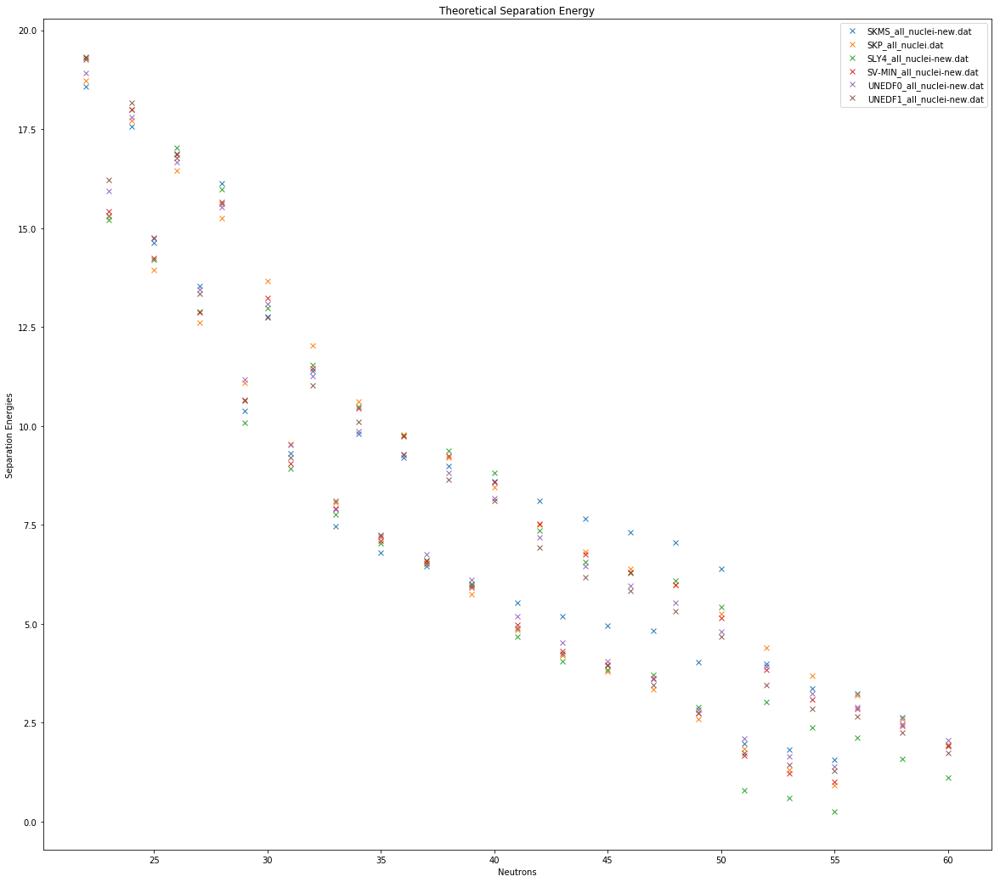

In [73]:
N_Ca_exp                =[]
y_Ca_exp                =[]

N_Ca_the                =[[],[],[],[],[],[]]
y_Ca_the                =[[],[],[],[],[],[]]

N_Ca_the_w_ZQ_ml        =[[],[],[],[],[],[]]
y_Ca_the_w_ZQ_ml        =[[],[],[],[],[],[]]




N_Ca_the_w_diff_Snexp_ZQ_ml        =[[],[],[],[],[],[]]
y_Ca_the_w_diff_Snexp_ZQ_ml        =[[],[],[],[],[],[]]

Sn_Ca_the_w_diff_Snexp_ZQ_ml       =[[],[],[],[],[],[]]




N_Ca_the_w_NQ_ml        =[[],[],[],[],[],[]]
y_Ca_the_w_NQ_ml        =[[],[],[],[],[],[]]

N_Ca_the_w_ZN_Q_ml      =[[],[],[],[],[],[]]
y_Ca_the_w_ZN_Q_ml      =[[],[],[],[],[],[]]


for n in range(0, 250):
    try:
        y_Ca_exp.append(y_exp_d[28,n])
        N_Ca_exp.append(n)
    except KeyError:
        continue
        
        
for n in range(0, 250):    
    for i in range(0,6):
        try:
            y_Ca_the[i].append(y_all_mat_d[i][28,n])
            N_Ca_the[i].append(n)
        except KeyError:
            continue
        
for n in range(0, 250):
    for i in range(0,6):
        try:
            y_Ca_the_w_ZQ_ml[i].append(y_all_mat_w_ZQ_ml_d[i][28,n])
            N_Ca_the_w_ZQ_ml[i].append(n)
        except KeyError:
            continue

for n in range(0, 250):
    for i in range(0,6):
        try:
            y_Ca_the_w_diff_Snexp_ZQ_ml[i].append(y_all_mat_w_diff_Snexp_ZQ_ml_d[i][28,n])
            
            
            N_Ca_the_w_diff_Snexp_ZQ_ml[i].append(n)
        except KeyError:
            continue
            

            
N_Ca_the_w_given_diff_Snexp_ZQ_ml=[[],[],[], [],[],[],]
for n in range(0, 250):
    for i in range(0,6):
        try:
            
            Sn_Ca_the_w_diff_Snexp_ZQ_ml[i].append(-Snexp_all_mat_w_diff_Snexp_ZQ_ml_d[i][28,n])
            
            N_Ca_the_w_given_diff_Snexp_ZQ_ml[i].append(n)
        except KeyError:
            continue
      

print("!!!!", np.shape(y_Ca_the_w_diff_Snexp_ZQ_ml[i]))
print("!!!!", np.shape(Sn_Ca_the_w_diff_Snexp_ZQ_ml[i]))
 
            
for n in range(0, 250):
    for i in range(0,6):
        try:
            y_Ca_the_w_NQ_ml[i].append(y_all_mat_w_NQ_ml_d[i][28,n])
            N_Ca_the_w_NQ_ml[i].append(n)
        except KeyError:
            continue

for n in range(0, 250):
    for i in range(0,6):
        try:
            y_Ca_the_w_ZN_Q_ml[i].append(y_all_mat_w_ZN_Q_ml_d[i][28,n])
            N_Ca_the_w_ZN_Q_ml[i].append(n)
        except KeyError:
            continue
            
S_n_given = [[],[],[],[],[],[],]
n_given   = [[],[],[],[],[],[],]

for i in range(0,6):
    for n in range(0,250):
        try:
            S_n_given[i].append(-S_n_all_mat_d[i][28,n])
            n_given[i].append(n)
        except KeyError:
            continue


for i in range(0,6):
    plt.plot(n_given[i], S_n_given[i],'x', label=names[i])

plt.legend()
plt.title("Theoretical Separation Energy")
plt.xlabel("Neutrons")
plt.ylabel("Separation Energies")
plt.show()

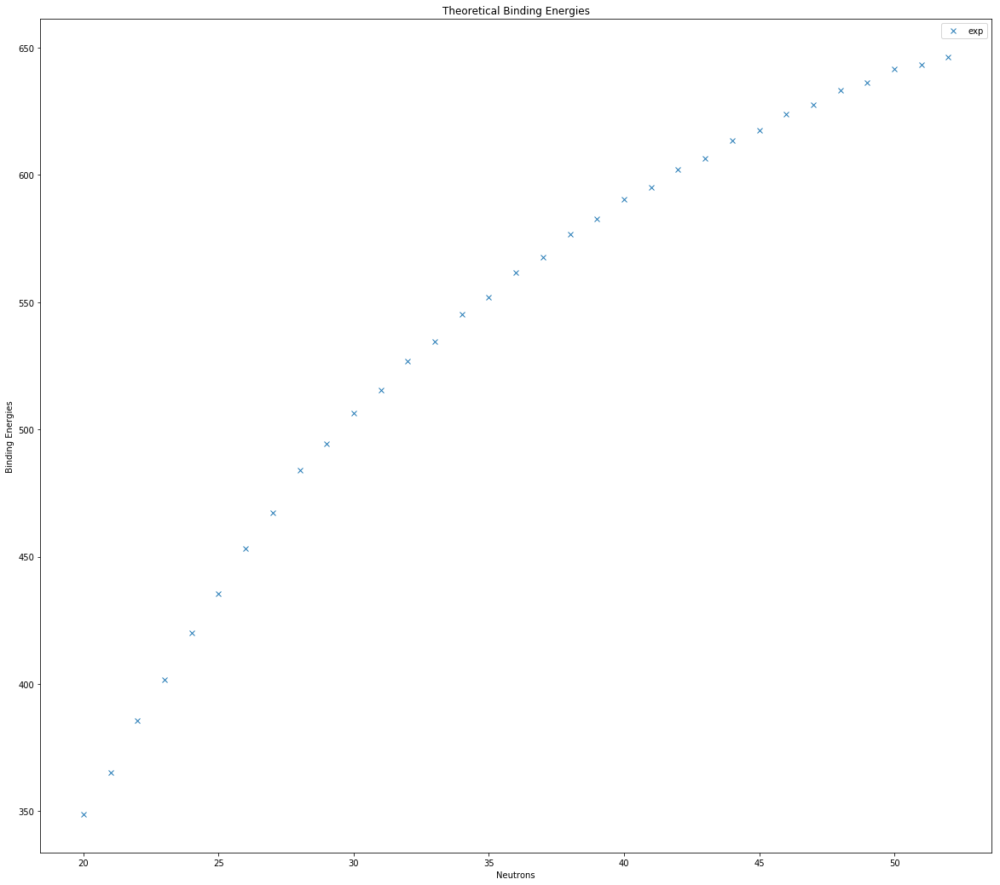

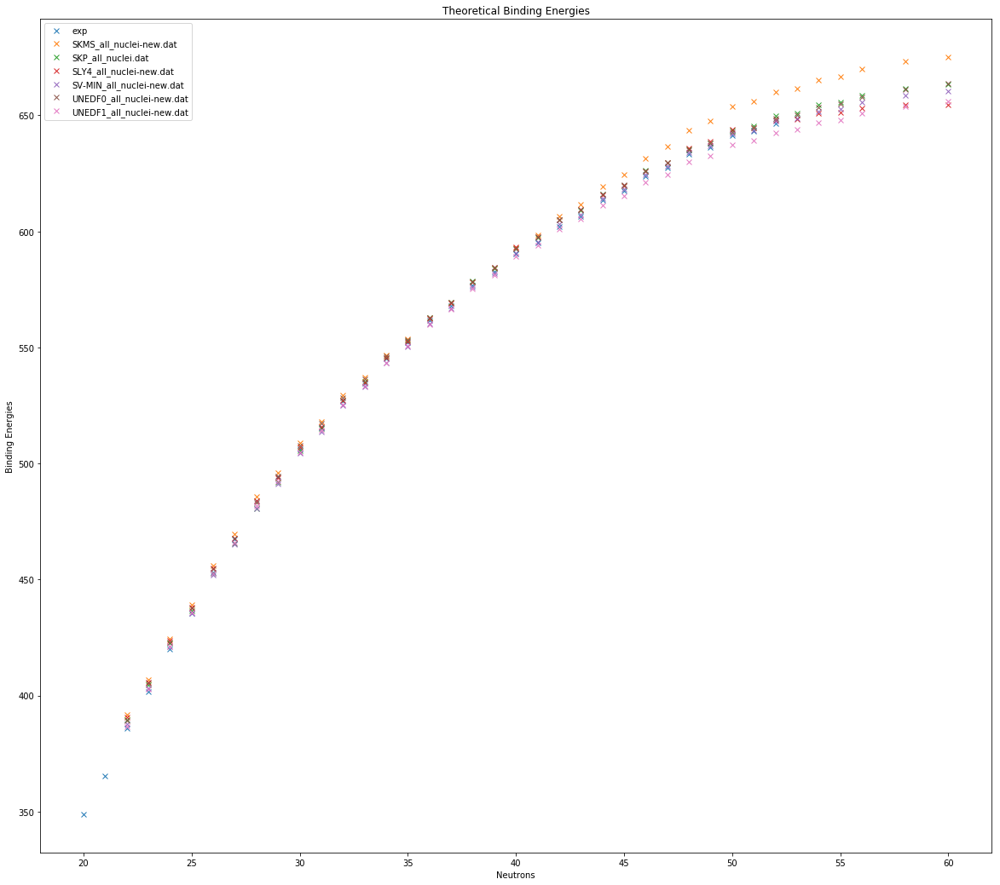

w_ZQ_ml


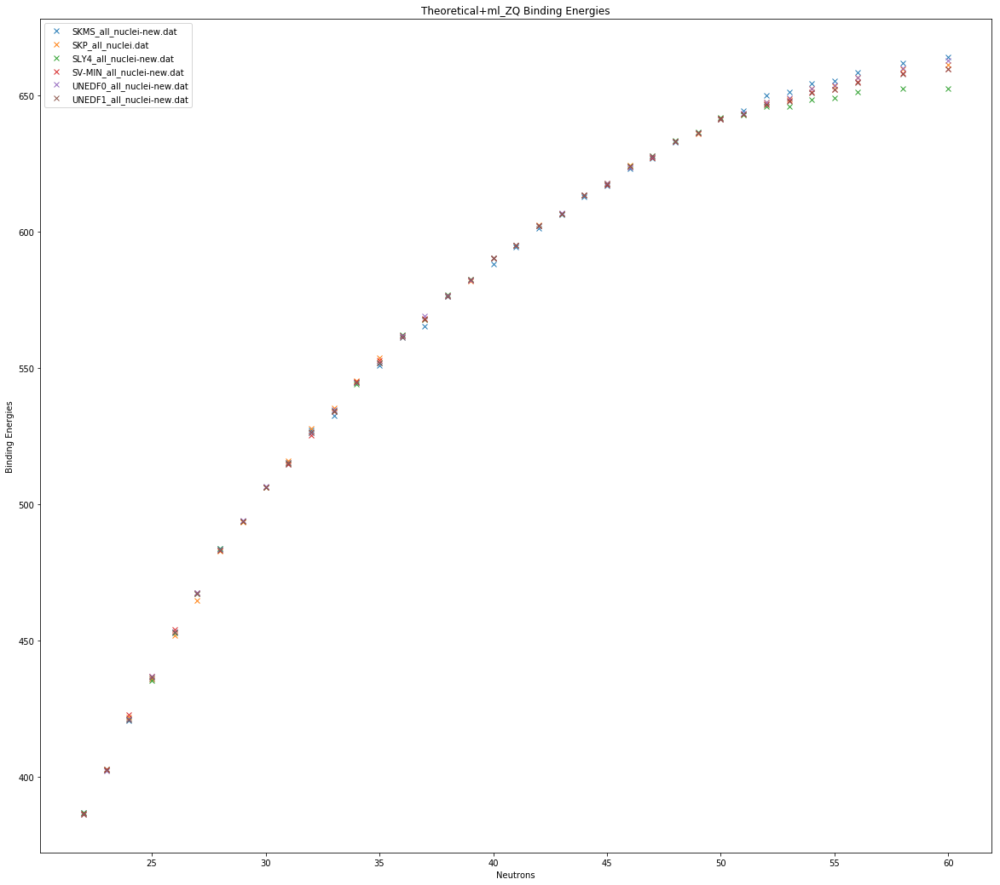

w_diff_Snexp_ZQ_ml


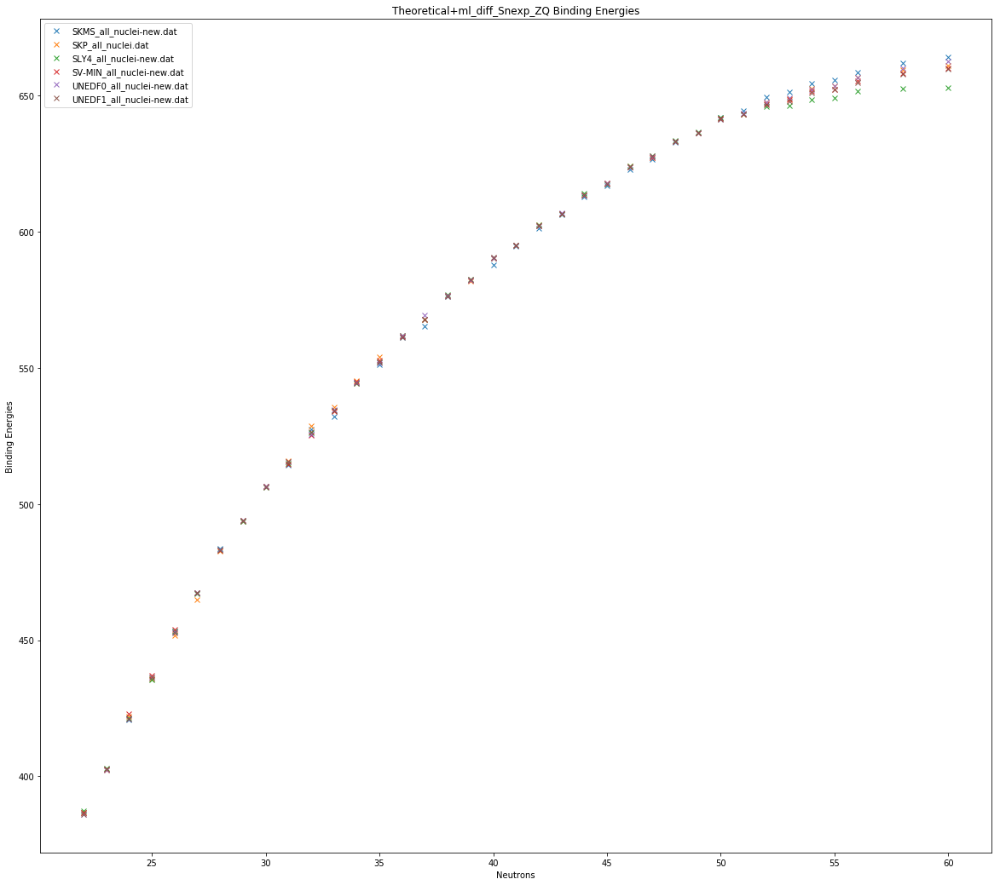

'\nprint("w_NQ_ml")\nfor i in range(0,6):\n    plt.plot(N_Ca_the_w_NQ_ml[i], y_Ca_the_w_NQ_ml[i], \'x\', label=names[i])\nplt.legend()\nplt.title("Theoretical+ml_NQ Binding Energies")\nplt.xlabel("Neutrons")\nplt.ylabel("Binding Energies")\nplt.show()\n\nprint("w_ZN_Q_ml")\nfor i in range(0,6):\n    plt.plot(N_Ca_the_w_ZN_Q_ml[i], y_Ca_the_w_ZN_Q_ml[i], \'x\', label=names[i])\nplt.legend()\nplt.title("Theoretical+ml_ZN_Q Binding Energies")\nplt.xlabel("Neutrons")\nplt.ylabel("Binding Energies")\nplt.show()\n'

In [74]:

plt.plot(N_Ca_exp, y_Ca_exp, 'x', label="exp")
plt.legend()
plt.title("Theoretical Binding Energies")
plt.xlabel("Neutrons")
plt.ylabel("Binding Energies")
plt.show()

plt.plot(N_Ca_exp, y_Ca_exp, 'x', label="exp")
for i in range(0,6):
    plt.plot(N_Ca_the[i], y_Ca_the[i], 'x', label=names[i])
plt.legend()
plt.title("Theoretical Binding Energies")
plt.xlabel("Neutrons")
plt.ylabel("Binding Energies")
plt.show()


print("w_ZQ_ml")
for i in range(0,6):
    plt.plot(N_Ca_the_w_ZQ_ml[i], y_Ca_the_w_ZQ_ml[i], 'x', label=names[i])
plt.legend()
plt.title("Theoretical+ml_ZQ Binding Energies")
plt.xlabel("Neutrons")
plt.ylabel("Binding Energies")
plt.show()

print("w_diff_Snexp_ZQ_ml")
for i in range(0,6):
    plt.plot(N_Ca_the_w_diff_Snexp_ZQ_ml[i], y_Ca_the_w_diff_Snexp_ZQ_ml[i], 'x', label=names[i])
plt.legend()
plt.title("Theoretical+ml_diff_Snexp_ZQ Binding Energies")
plt.xlabel("Neutrons")
plt.ylabel("Binding Energies")
plt.show()


"""
print("w_NQ_ml")
for i in range(0,6):
    plt.plot(N_Ca_the_w_NQ_ml[i], y_Ca_the_w_NQ_ml[i], 'x', label=names[i])
plt.legend()
plt.title("Theoretical+ml_NQ Binding Energies")
plt.xlabel("Neutrons")
plt.ylabel("Binding Energies")
plt.show()

print("w_ZN_Q_ml")
for i in range(0,6):
    plt.plot(N_Ca_the_w_ZN_Q_ml[i], y_Ca_the_w_ZN_Q_ml[i], 'x', label=names[i])
plt.legend()
plt.title("Theoretical+ml_ZN_Q Binding Energies")
plt.xlabel("Neutrons")
plt.ylabel("Binding Energies")
plt.show()
"""

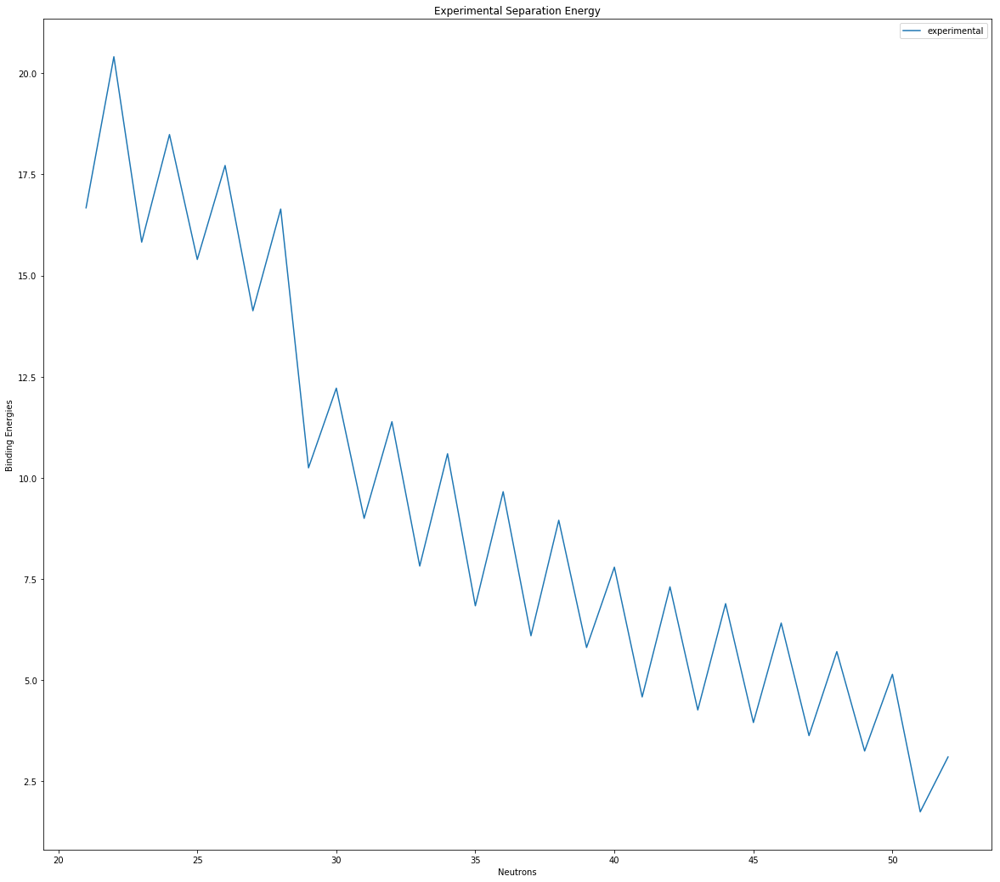

Separation Energy made from theoretical predictions


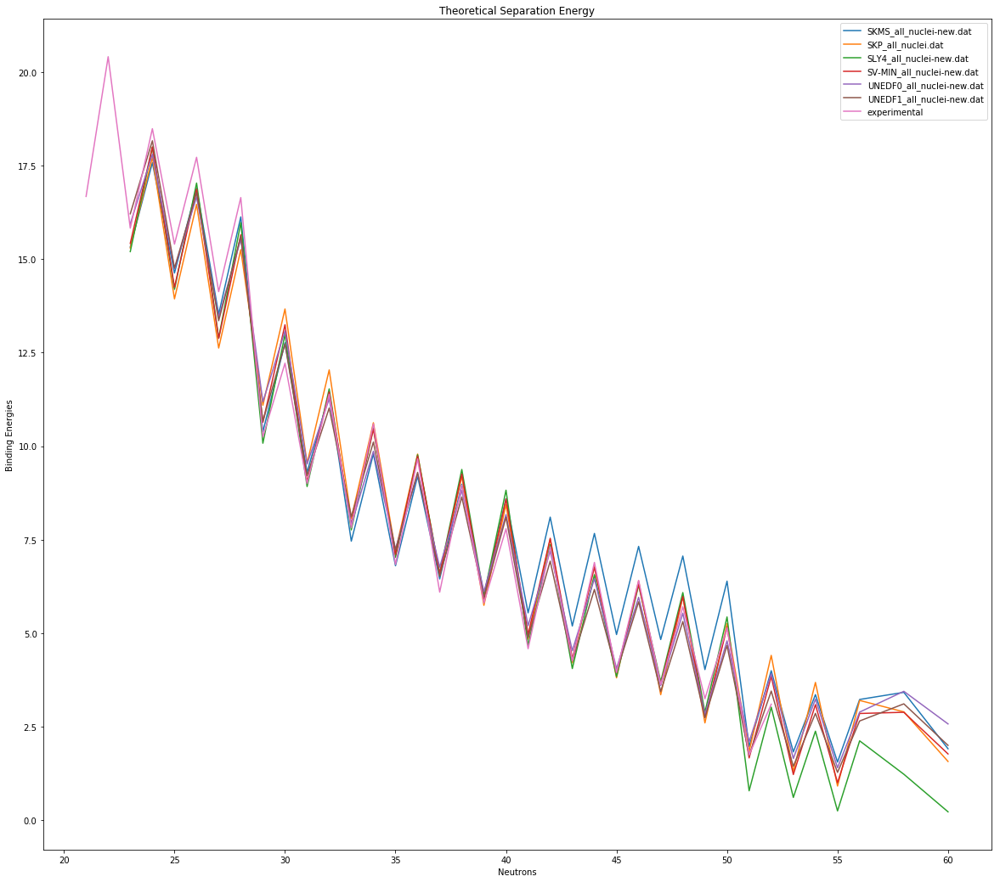

Made Separation Energy from prediction of diff alone


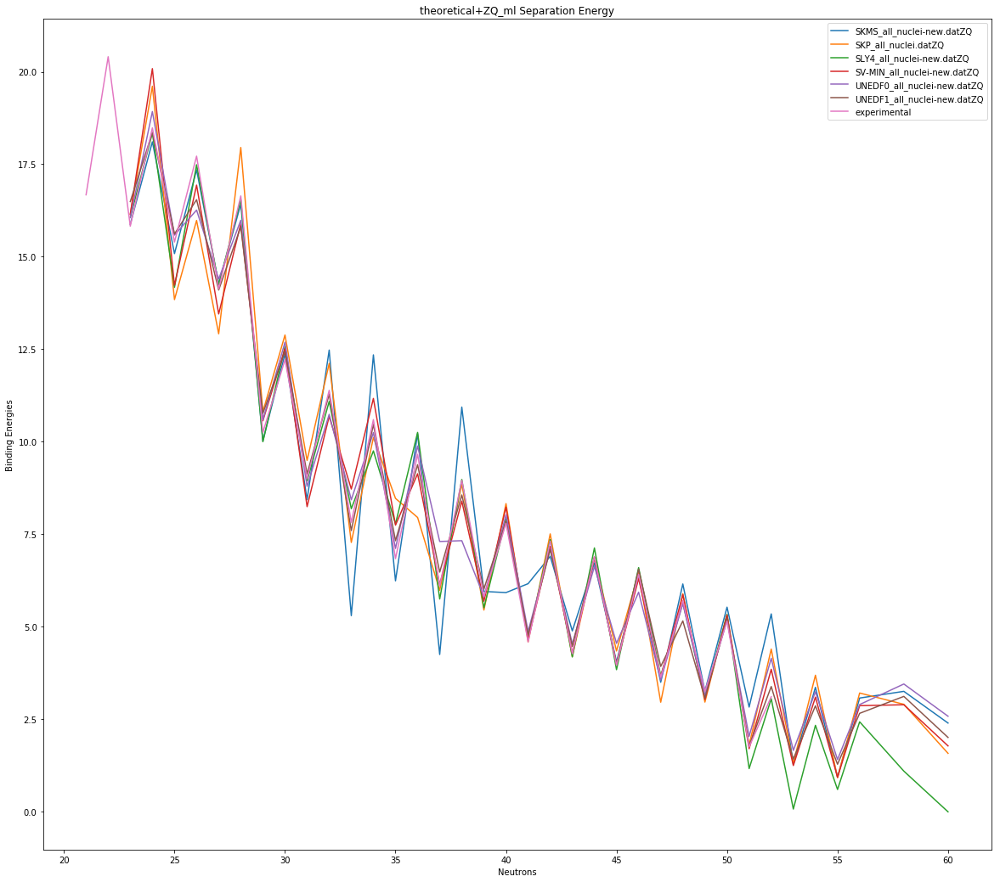

Made Separation Energy from prediction of diff + Sn combo


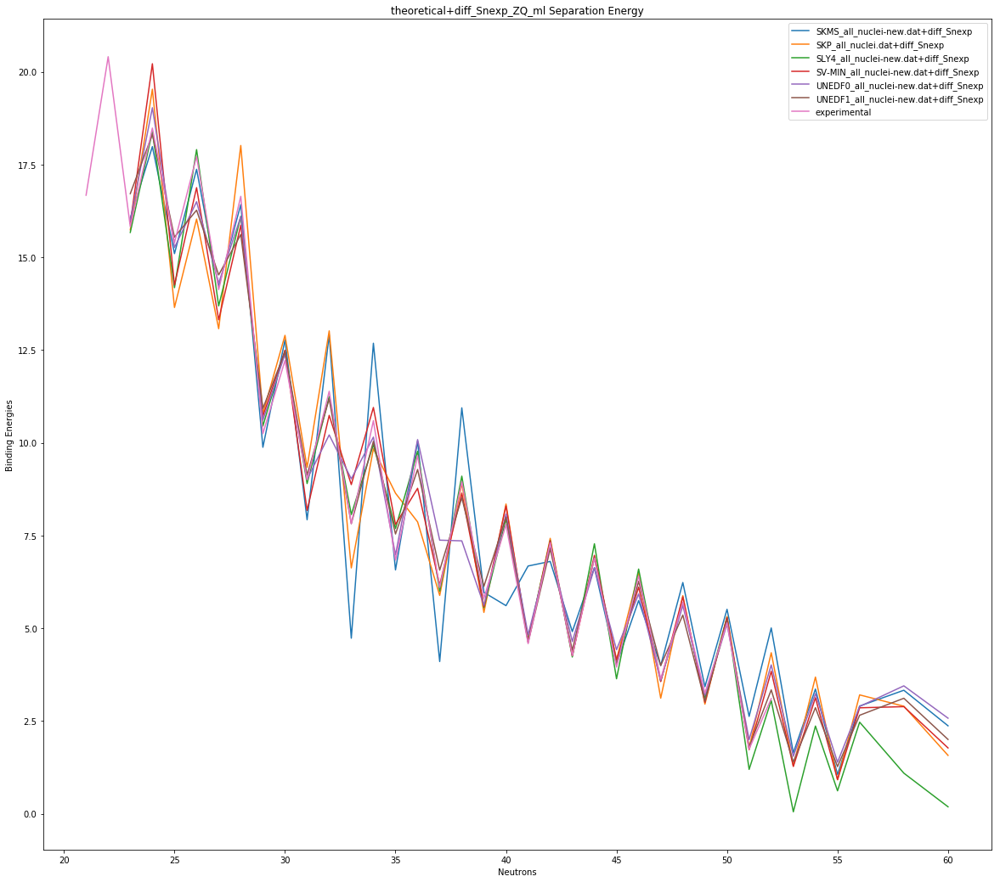

Separation energy made from diff + Sn combo 


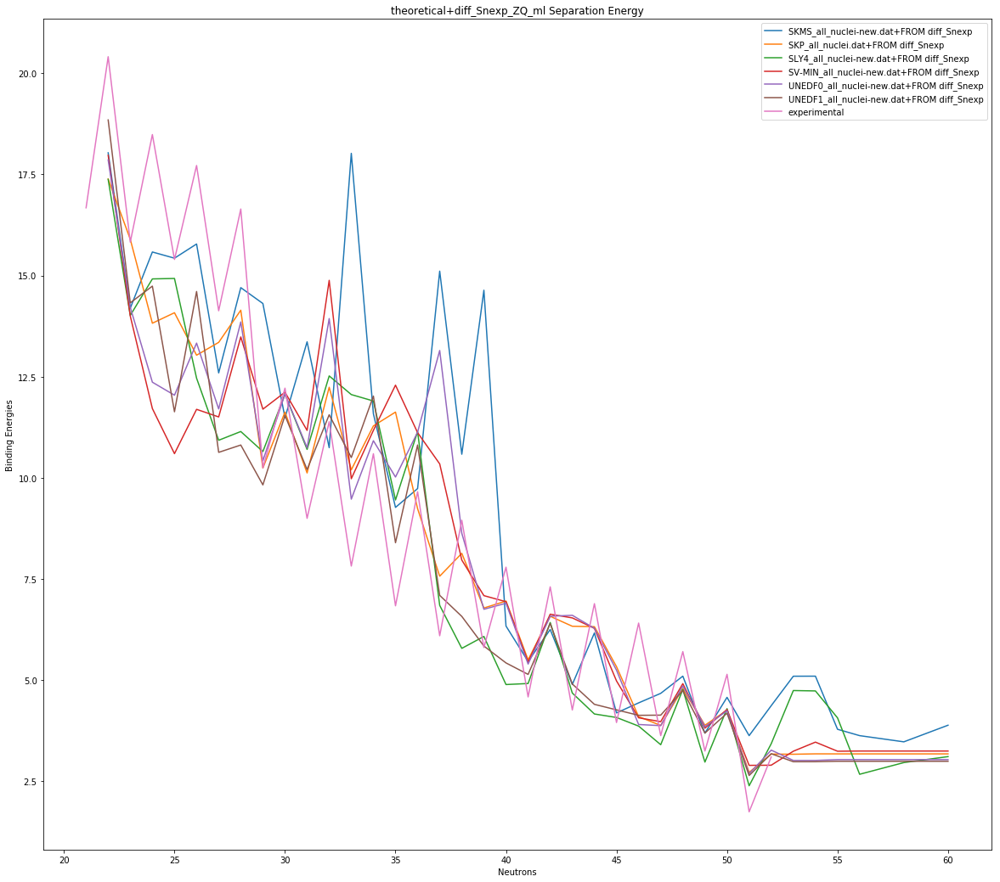

'\nfor j in range(0,6):\n    for i in range(1, len(N_Ca_the_w_NQ_ml[j])):\n        Se_Ca_the_w_NQ_ml[j].append(y_Ca_the_w_NQ_ml[j][i]-y_Ca_the_w_NQ_ml[j][i-1])\n        N_Ca_S_the_w_NQ_ml[j].append(N_Ca_the_w_NQ_ml[j][i])\n    plt.plot(N_Ca_S_the_w_NQ_ml[j], Se_Ca_the_w_NQ_ml[j], \'x\',  markersize=15,label=names[j])\n\nplt.title("theoretical+NQ_ml Separation Energy")\nplt.legend()\nplt.xlabel("Neutrons")\nplt.ylabel("Binding Energies")\nplt.show() \n\nfor j in range(0,6):\n    for i in range(1, len(N_Ca_the_w_ZN_Q_ml[j])):\n        Se_Ca_the_w_ZN_Q_ml[j].append(y_Ca_the_w_ZN_Q_ml[j][i]-y_Ca_the_w_ZN_Q_ml[j][i-1])\n        N_Ca_S_the_w_ZN_Q_ml[j].append(N_Ca_the_w_ZN_Q_ml[j][i])\n    plt.plot(N_Ca_S_the_w_ZN_Q_ml[j], Se_Ca_the_w_ZN_Q_ml[j], \'x\', markersize=15, label=names[j])\n\nplt.legend()\nplt.title("theoretical+ZN_Q_ml Separation Energy")\nplt.xlabel("Neutrons")\nplt.ylabel("Binding Energies")\nplt.show() \n'

In [75]:
N_Ca_S_exp                =[]
Se_Ca_exp                 =[]

N_Ca_S_the                =[[],[],[],[],[],[]]
Se_Ca_the                 =[[],[],[],[],[],[]]

N_Ca_S_the_w_ZQ_ml        =[[],[],[],[],[],[]]
Se_Ca_the_w_ZQ_ml         =[[],[],[],[],[],[]]

N_Ca_S_the_w_diff_Snexp_ZQ_ml        =[[],[],[],[],[],[]]
Se_Ca_the_w_diff_Snexp_ZQ_ml         =[[],[],[],[],[],[]]






N_Ca_S_the_w_NQ_ml        =[[],[],[],[],[],[]]
Se_Ca_the_w_NQ_ml         =[[],[],[],[],[],[]]

N_Ca_S_the_w_ZN_Q_ml      =[[],[],[],[],[],[]]
Se_Ca_the_w_ZN_Q_ml       =[[],[],[],[],[],[]]


for i in range(1, len(N_Ca_exp)):
    Se_Ca_exp.append(y_Ca_exp[i]-y_Ca_exp[i-1])
    N_Ca_S_exp.append(N_Ca_exp[i])

plt.plot(N_Ca_S_exp, Se_Ca_exp,  label="experimental")
plt.legend()
plt.title("Experimental Separation Energy")
plt.xlabel("Neutrons")
plt.ylabel("Binding Energies")
plt.show()

print("Separation Energy made from theoretical predictions")
for j in range(0,6):
    for i in range(1, len(N_Ca_the[j])):
        Se_Ca_the[j].append(y_Ca_the[j][i]-y_Ca_the[j][i-1])
        N_Ca_S_the[j].append(N_Ca_the[j][i])
    plt.plot(N_Ca_S_the[j], Se_Ca_the[j], label=names[j])

plt.plot(N_Ca_S_exp, Se_Ca_exp,  label="experimental")
plt.legend()
plt.title("Theoretical Separation Energy")
plt.xlabel("Neutrons")
plt.ylabel("Binding Energies")
plt.show()

print("Made Separation Energy from prediction of diff alone")

for j in range(0,6):
    for i in range(1, len(N_Ca_the_w_ZQ_ml[j])):
        Se_Ca_the_w_ZQ_ml[j].append(y_Ca_the_w_ZQ_ml[j][i]-y_Ca_the_w_ZQ_ml[j][i-1])
        N_Ca_S_the_w_ZQ_ml[j].append(N_Ca_the_w_ZQ_ml[j][i])
    plt.plot(N_Ca_S_the_w_ZQ_ml[j], Se_Ca_the_w_ZQ_ml[j], label=names[j]+"ZQ")

plt.plot(N_Ca_S_exp, Se_Ca_exp,  label="experimental")
plt.legend()
plt.title("theoretical+ZQ_ml Separation Energy")
plt.xlabel("Neutrons")
plt.ylabel("Binding Energies")
plt.show()

print("Made Separation Energy from prediction of diff + Sn combo")
for j in range(0,6):
    for i in range(1, len(N_Ca_the_w_diff_Snexp_ZQ_ml[j])):
        Se_Ca_the_w_diff_Snexp_ZQ_ml[j].append(y_Ca_the_w_diff_Snexp_ZQ_ml[j][i]-y_Ca_the_w_diff_Snexp_ZQ_ml[j][i-1])
        N_Ca_S_the_w_diff_Snexp_ZQ_ml[j].append(N_Ca_the_w_diff_Snexp_ZQ_ml[j][i])
    plt.plot(N_Ca_S_the_w_diff_Snexp_ZQ_ml[j], Se_Ca_the_w_diff_Snexp_ZQ_ml[j], label=names[j]+"+diff_Snexp")

plt.plot(N_Ca_S_exp, Se_Ca_exp,  label="experimental")
plt.legend()
plt.title("theoretical+diff_Snexp_ZQ_ml Separation Energy")
plt.xlabel("Neutrons")
plt.ylabel("Binding Energies")
plt.show()



print("Separation energy made from diff + Sn combo ")

    
for j in range(0,6):
    plt.plot(N_Ca_the_w_given_diff_Snexp_ZQ_ml[j], Sn_Ca_the_w_diff_Snexp_ZQ_ml[j], label=names[j]+"+FROM diff_Snexp")

plt.plot(N_Ca_S_exp, Se_Ca_exp,  label="experimental")
plt.legend()
plt.title("theoretical+diff_Snexp_ZQ_ml Separation Energy")
plt.xlabel("Neutrons")
plt.ylabel("Binding Energies")
plt.show()




"""
for j in range(0,6):
    for i in range(1, len(N_Ca_the_w_NQ_ml[j])):
        Se_Ca_the_w_NQ_ml[j].append(y_Ca_the_w_NQ_ml[j][i]-y_Ca_the_w_NQ_ml[j][i-1])
        N_Ca_S_the_w_NQ_ml[j].append(N_Ca_the_w_NQ_ml[j][i])
    plt.plot(N_Ca_S_the_w_NQ_ml[j], Se_Ca_the_w_NQ_ml[j], 'x',  markersize=15,label=names[j])

plt.title("theoretical+NQ_ml Separation Energy")
plt.legend()
plt.xlabel("Neutrons")
plt.ylabel("Binding Energies")
plt.show() 

for j in range(0,6):
    for i in range(1, len(N_Ca_the_w_ZN_Q_ml[j])):
        Se_Ca_the_w_ZN_Q_ml[j].append(y_Ca_the_w_ZN_Q_ml[j][i]-y_Ca_the_w_ZN_Q_ml[j][i-1])
        N_Ca_S_the_w_ZN_Q_ml[j].append(N_Ca_the_w_ZN_Q_ml[j][i])
    plt.plot(N_Ca_S_the_w_ZN_Q_ml[j], Se_Ca_the_w_ZN_Q_ml[j], 'x', markersize=15, label=names[j])

plt.legend()
plt.title("theoretical+ZN_Q_ml Separation Energy")
plt.xlabel("Neutrons")
plt.ylabel("Binding Energies")
plt.show() 
"""
     

!!!! (65,)
!!!! (65,)


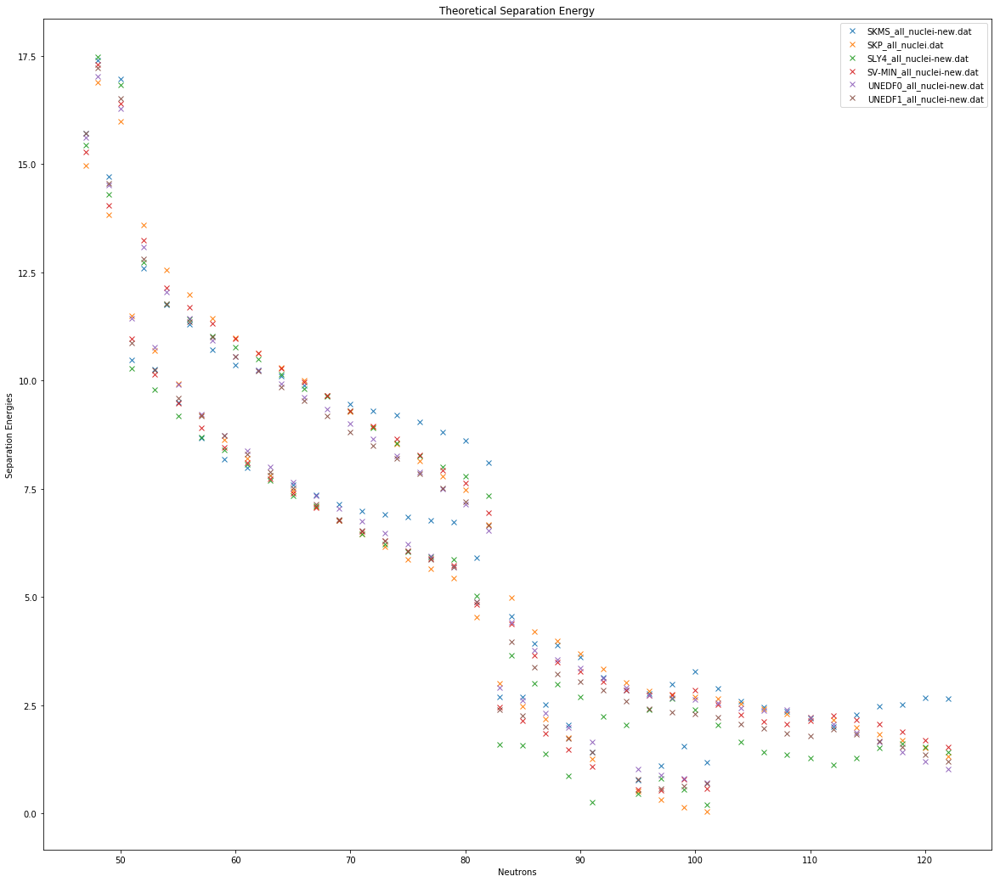

In [76]:
N_Ca_exp                =[]
y_Ca_exp                =[]

N_Ca_the                =[[],[],[],[],[],[]]
y_Ca_the                =[[],[],[],[],[],[]]

N_Ca_the_w_ZQ_ml        =[[],[],[],[],[],[]]
y_Ca_the_w_ZQ_ml        =[[],[],[],[],[],[]]




N_Ca_the_w_diff_Snexp_ZQ_ml        =[[],[],[],[],[],[]]
y_Ca_the_w_diff_Snexp_ZQ_ml        =[[],[],[],[],[],[]]

Sn_Ca_the_w_diff_Snexp_ZQ_ml       =[[],[],[],[],[],[]]




N_Ca_the_w_NQ_ml        =[[],[],[],[],[],[]]
y_Ca_the_w_NQ_ml        =[[],[],[],[],[],[]]

N_Ca_the_w_ZN_Q_ml      =[[],[],[],[],[],[]]
y_Ca_the_w_ZN_Q_ml      =[[],[],[],[],[],[]]


for n in range(0, 250):
    try:
        y_Ca_exp.append(y_exp_d[50,n])
        N_Ca_exp.append(n)
    except KeyError:
        continue
        
        
for n in range(0, 250):    
    for i in range(0,6):
        try:
            y_Ca_the[i].append(y_all_mat_d[i][50,n])
            N_Ca_the[i].append(n)
        except KeyError:
            continue
        
for n in range(0, 250):
    for i in range(0,6):
        try:
            y_Ca_the_w_ZQ_ml[i].append(y_all_mat_w_ZQ_ml_d[i][50,n])
            N_Ca_the_w_ZQ_ml[i].append(n)
        except KeyError:
            continue

for n in range(0, 250):
    for i in range(0,6):
        try:
            y_Ca_the_w_diff_Snexp_ZQ_ml[i].append(y_all_mat_w_diff_Snexp_ZQ_ml_d[i][50,n])
            
            
            N_Ca_the_w_diff_Snexp_ZQ_ml[i].append(n)
        except KeyError:
            continue
            

            
N_Ca_the_w_given_diff_Snexp_ZQ_ml=[[],[],[], [],[],[],]
for n in range(0, 250):
    for i in range(0,6):
        try:
            
            Sn_Ca_the_w_diff_Snexp_ZQ_ml[i].append(-Snexp_all_mat_w_diff_Snexp_ZQ_ml_d[i][50,n])
            
            N_Ca_the_w_given_diff_Snexp_ZQ_ml[i].append(n)
        except KeyError:
            continue
      

print("!!!!", np.shape(y_Ca_the_w_diff_Snexp_ZQ_ml[i]))
print("!!!!", np.shape(Sn_Ca_the_w_diff_Snexp_ZQ_ml[i]))
 
            
for n in range(0, 250):
    for i in range(0,6):
        try:
            y_Ca_the_w_NQ_ml[i].append(y_all_mat_w_NQ_ml_d[i][50,n])
            N_Ca_the_w_NQ_ml[i].append(n)
        except KeyError:
            continue

for n in range(0, 250):
    for i in range(0,6):
        try:
            y_Ca_the_w_ZN_Q_ml[i].append(y_all_mat_w_ZN_Q_ml_d[i][50,n])
            N_Ca_the_w_ZN_Q_ml[i].append(n)
        except KeyError:
            continue
            
S_n_given = [[],[],[],[],[],[],]
n_given   = [[],[],[],[],[],[],]

for i in range(0,6):
    for n in range(0,250):
        try:
            S_n_given[i].append(-S_n_all_mat_d[i][50,n])
            n_given[i].append(n)
        except KeyError:
            continue


for i in range(0,6):
    plt.plot(n_given[i], S_n_given[i],'x', label=names[i])

plt.legend()
plt.title("Theoretical Separation Energy")
plt.xlabel("Neutrons")
plt.ylabel("Separation Energies")
plt.show()

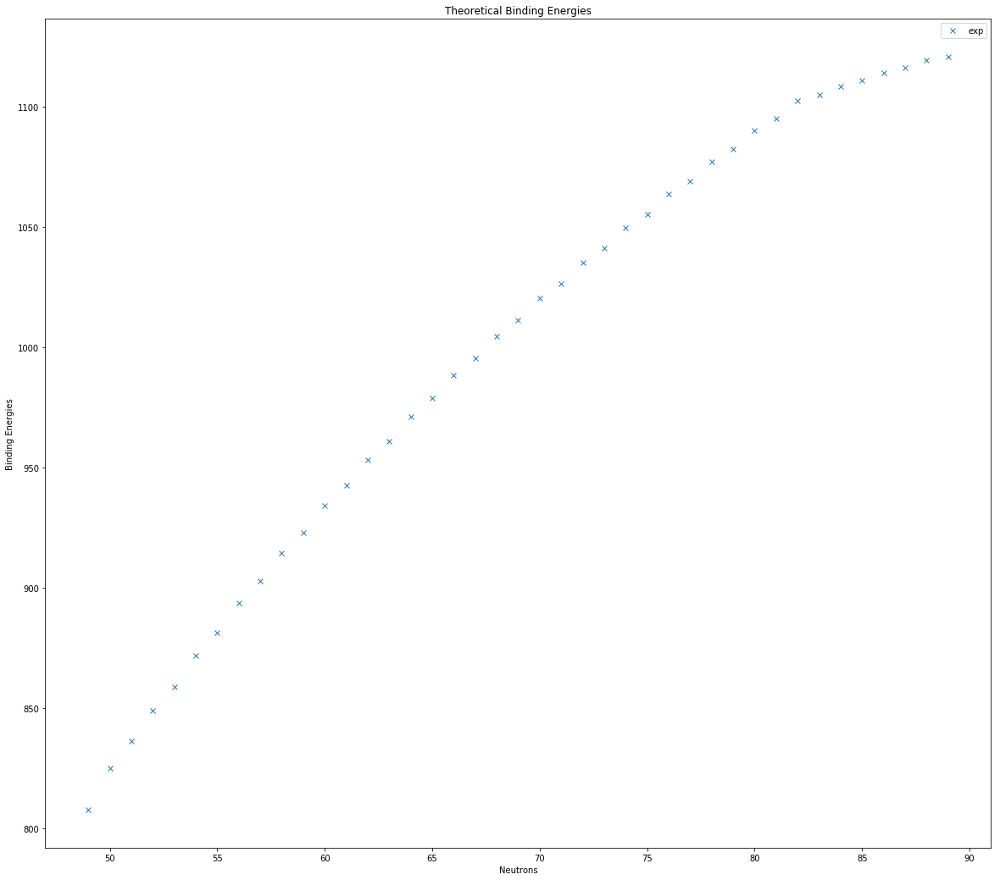

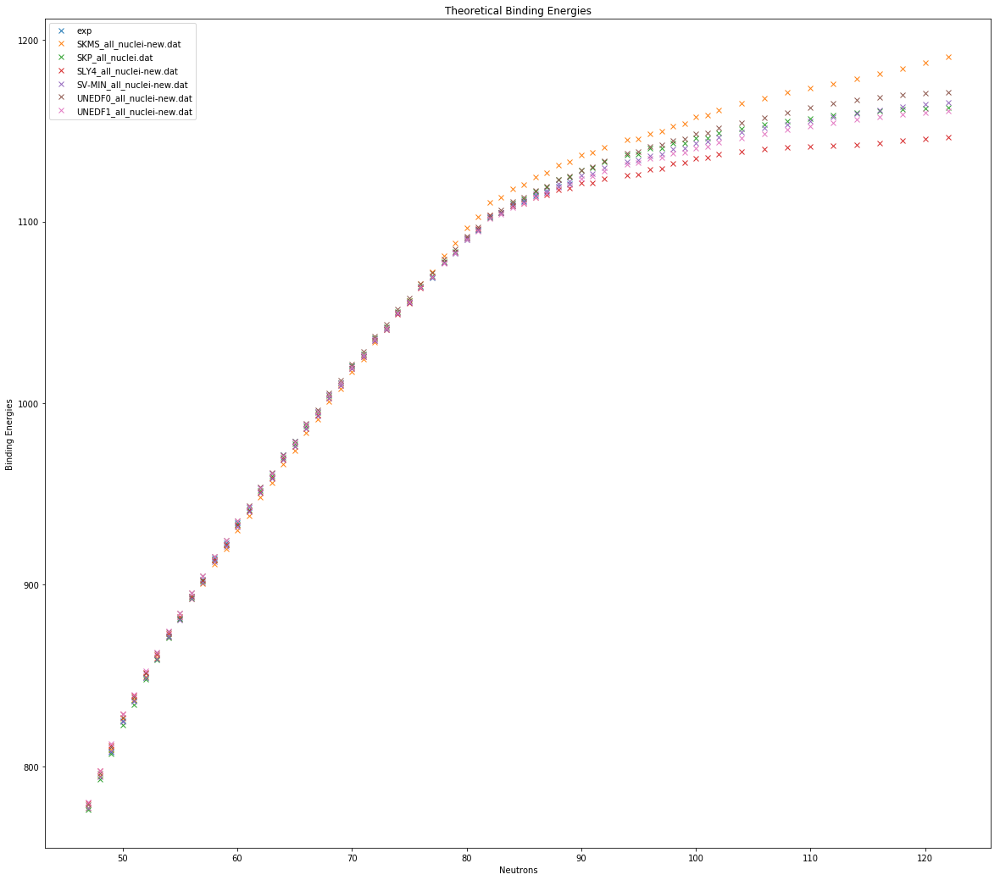

w_ZQ_ml


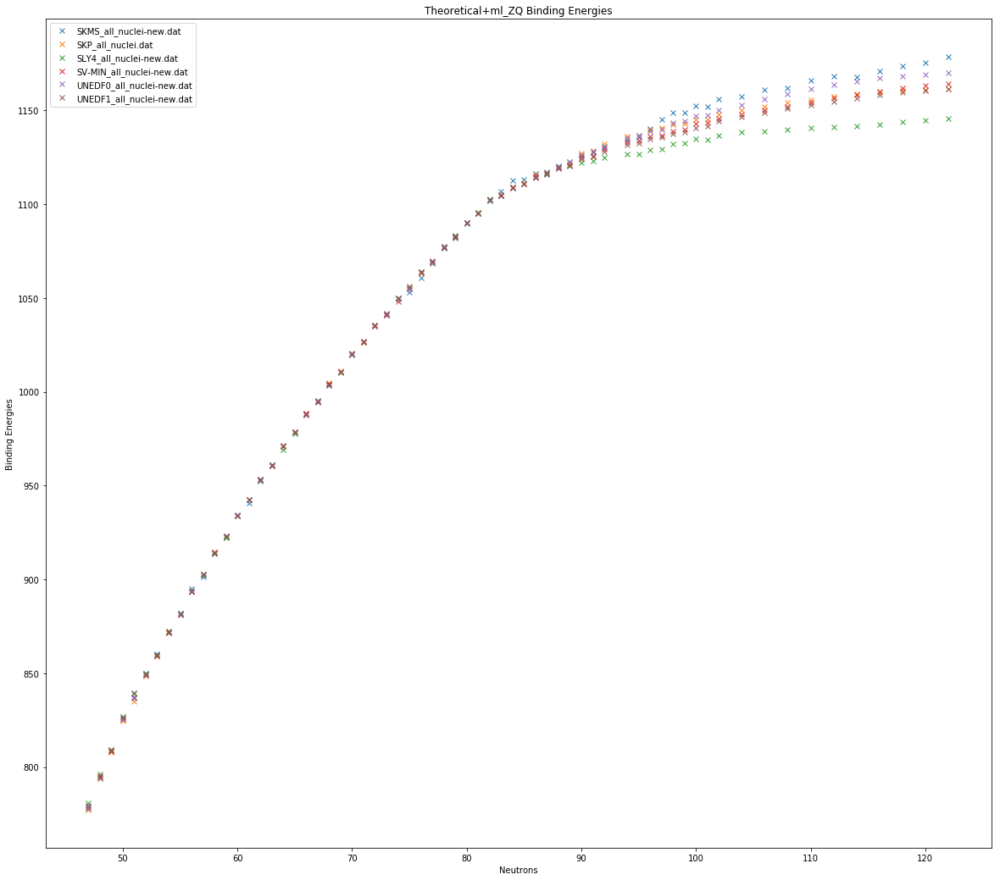

w_diff_Snexp_ZQ_ml


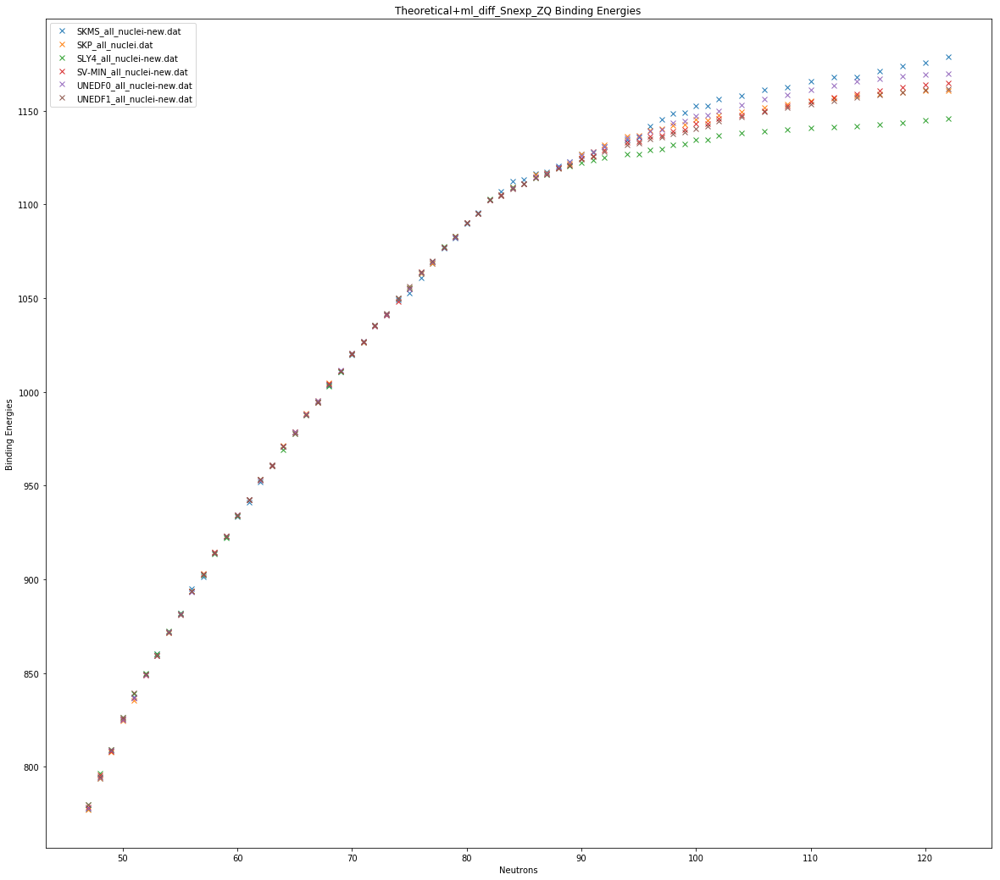

'\nprint("w_NQ_ml")\nfor i in range(0,6):\n    plt.plot(N_Ca_the_w_NQ_ml[i], y_Ca_the_w_NQ_ml[i], \'x\', label=names[i])\nplt.legend()\nplt.title("Theoretical+ml_NQ Binding Energies")\nplt.xlabel("Neutrons")\nplt.ylabel("Binding Energies")\nplt.show()\n\nprint("w_ZN_Q_ml")\nfor i in range(0,6):\n    plt.plot(N_Ca_the_w_ZN_Q_ml[i], y_Ca_the_w_ZN_Q_ml[i], \'x\', label=names[i])\nplt.legend()\nplt.title("Theoretical+ml_ZN_Q Binding Energies")\nplt.xlabel("Neutrons")\nplt.ylabel("Binding Energies")\nplt.show()\n'

In [77]:

plt.plot(N_Ca_exp, y_Ca_exp, 'x', label="exp")
plt.legend()
plt.title("Theoretical Binding Energies")
plt.xlabel("Neutrons")
plt.ylabel("Binding Energies")
plt.show()

plt.plot(N_Ca_exp, y_Ca_exp, 'x', label="exp")
for i in range(0,6):
    plt.plot(N_Ca_the[i], y_Ca_the[i], 'x', label=names[i])
plt.legend()
plt.title("Theoretical Binding Energies")
plt.xlabel("Neutrons")
plt.ylabel("Binding Energies")
plt.show()


print("w_ZQ_ml")
for i in range(0,6):
    plt.plot(N_Ca_the_w_ZQ_ml[i], y_Ca_the_w_ZQ_ml[i], 'x', label=names[i])
plt.legend()
plt.title("Theoretical+ml_ZQ Binding Energies")
plt.xlabel("Neutrons")
plt.ylabel("Binding Energies")
plt.show()

print("w_diff_Snexp_ZQ_ml")
for i in range(0,6):
    plt.plot(N_Ca_the_w_diff_Snexp_ZQ_ml[i], y_Ca_the_w_diff_Snexp_ZQ_ml[i], 'x', label=names[i])
plt.legend()
plt.title("Theoretical+ml_diff_Snexp_ZQ Binding Energies")
plt.xlabel("Neutrons")
plt.ylabel("Binding Energies")
plt.show()


"""
print("w_NQ_ml")
for i in range(0,6):
    plt.plot(N_Ca_the_w_NQ_ml[i], y_Ca_the_w_NQ_ml[i], 'x', label=names[i])
plt.legend()
plt.title("Theoretical+ml_NQ Binding Energies")
plt.xlabel("Neutrons")
plt.ylabel("Binding Energies")
plt.show()

print("w_ZN_Q_ml")
for i in range(0,6):
    plt.plot(N_Ca_the_w_ZN_Q_ml[i], y_Ca_the_w_ZN_Q_ml[i], 'x', label=names[i])
plt.legend()
plt.title("Theoretical+ml_ZN_Q Binding Energies")
plt.xlabel("Neutrons")
plt.ylabel("Binding Energies")
plt.show()
"""

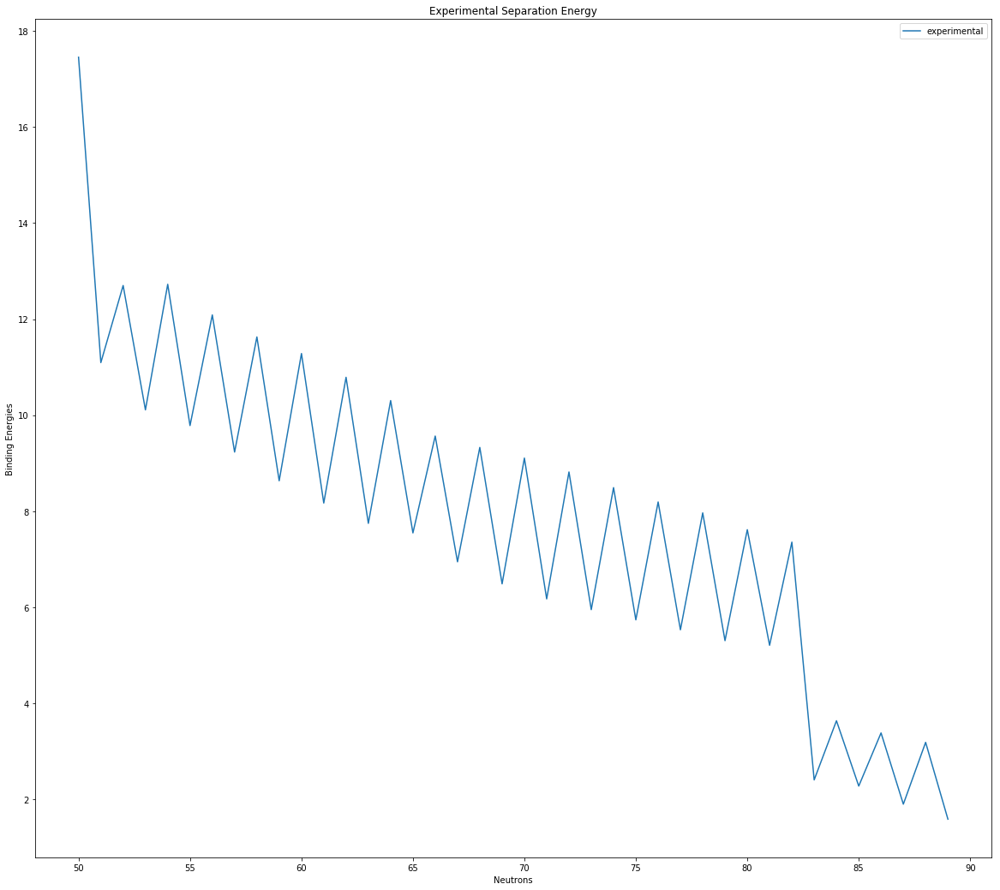

Separation Energy made from theoretical predictions


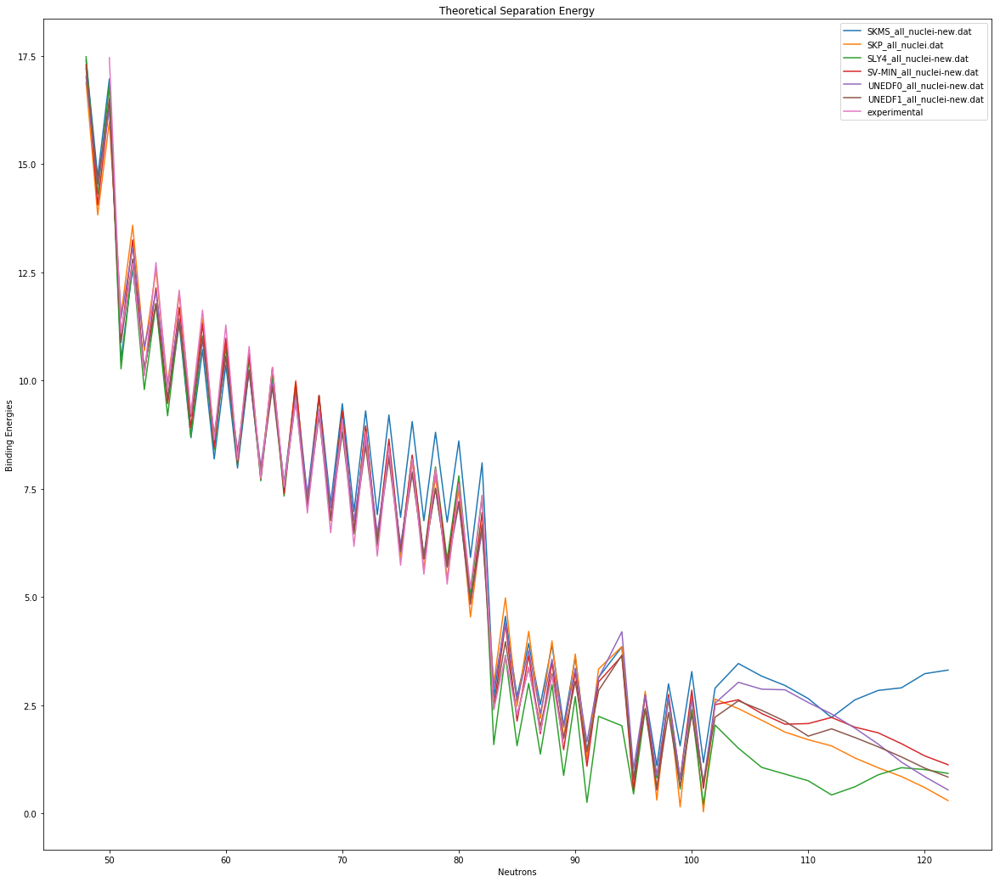

Made Separation Energy from prediction of diff alone


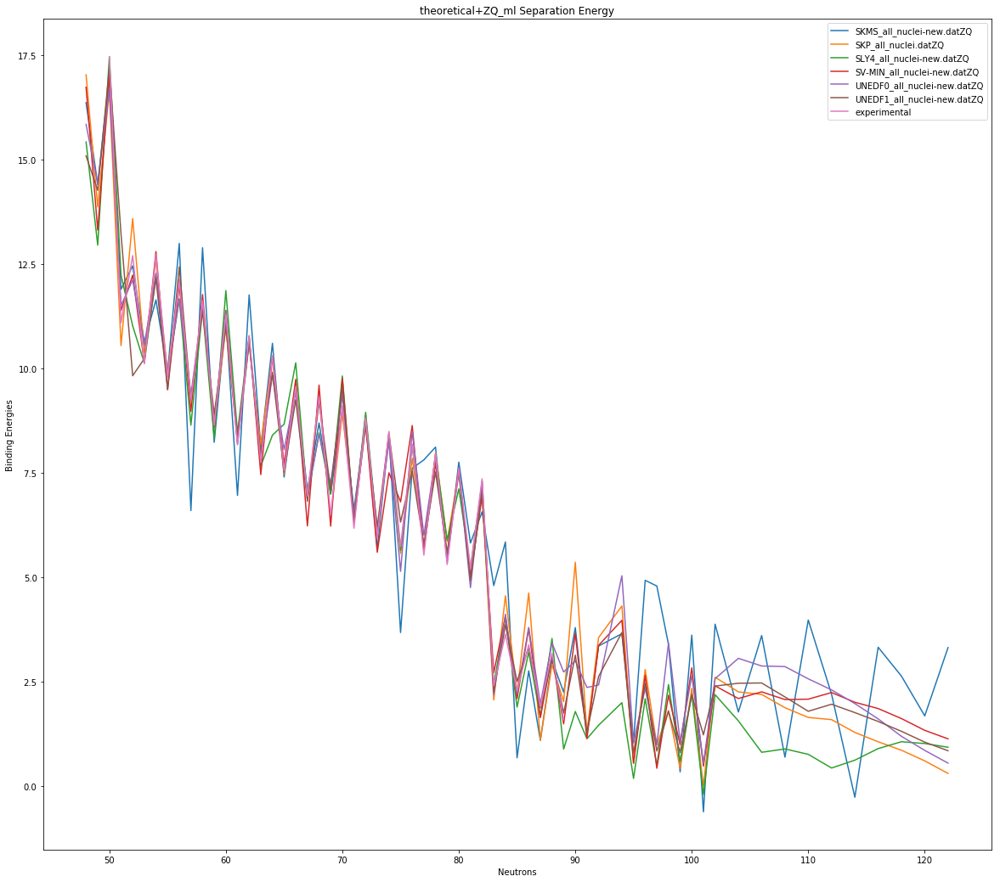

Made Separation Energy from prediction of diff + Sn combo


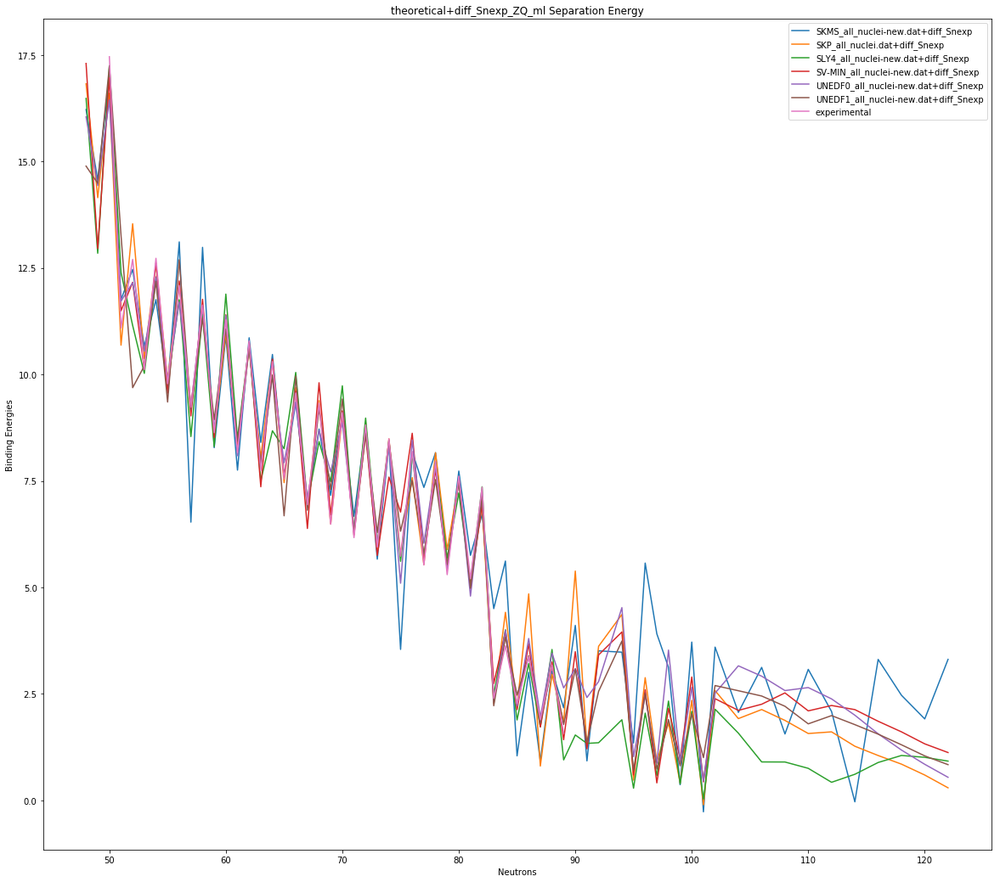

Separation energy made from diff + Sn combo 


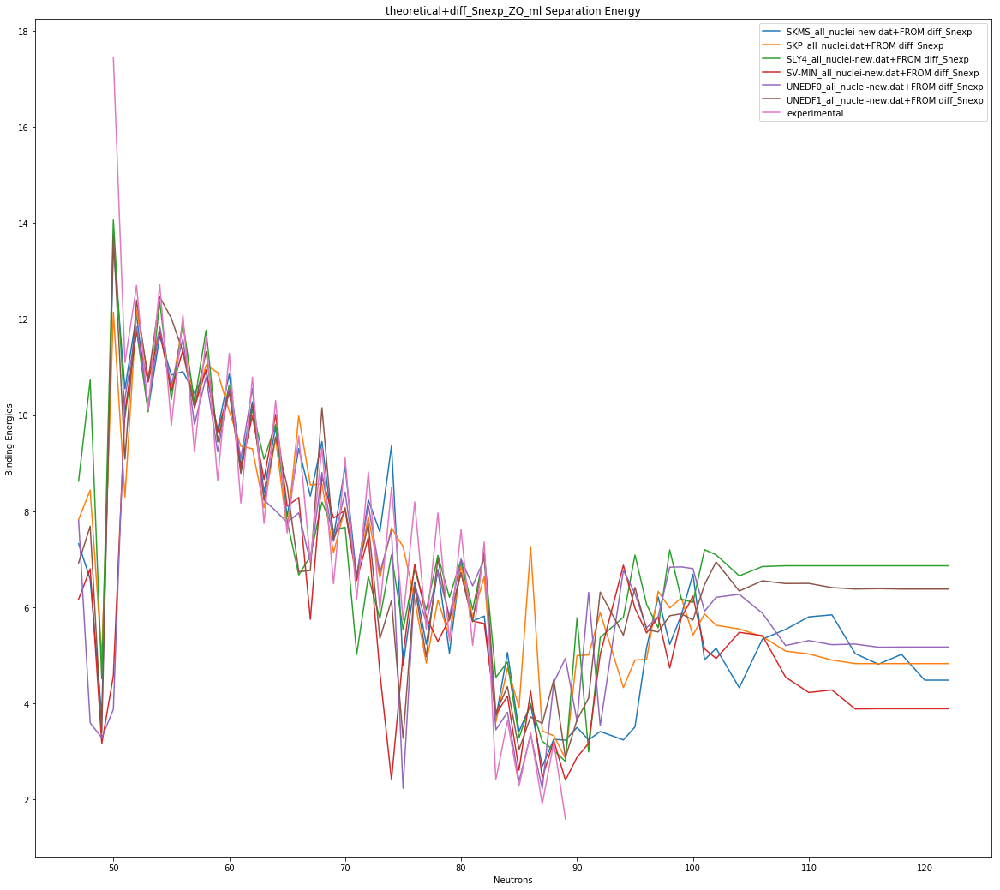

'\nfor j in range(0,6):\n    for i in range(1, len(N_Ca_the_w_NQ_ml[j])):\n        Se_Ca_the_w_NQ_ml[j].append(y_Ca_the_w_NQ_ml[j][i]-y_Ca_the_w_NQ_ml[j][i-1])\n        N_Ca_S_the_w_NQ_ml[j].append(N_Ca_the_w_NQ_ml[j][i])\n    plt.plot(N_Ca_S_the_w_NQ_ml[j], Se_Ca_the_w_NQ_ml[j], \'x\',  markersize=15,label=names[j])\n\nplt.title("theoretical+NQ_ml Separation Energy")\nplt.legend()\nplt.xlabel("Neutrons")\nplt.ylabel("Binding Energies")\nplt.show() \n\nfor j in range(0,6):\n    for i in range(1, len(N_Ca_the_w_ZN_Q_ml[j])):\n        Se_Ca_the_w_ZN_Q_ml[j].append(y_Ca_the_w_ZN_Q_ml[j][i]-y_Ca_the_w_ZN_Q_ml[j][i-1])\n        N_Ca_S_the_w_ZN_Q_ml[j].append(N_Ca_the_w_ZN_Q_ml[j][i])\n    plt.plot(N_Ca_S_the_w_ZN_Q_ml[j], Se_Ca_the_w_ZN_Q_ml[j], \'x\', markersize=15, label=names[j])\n\nplt.legend()\nplt.title("theoretical+ZN_Q_ml Separation Energy")\nplt.xlabel("Neutrons")\nplt.ylabel("Binding Energies")\nplt.show() \n'

In [78]:
N_Ca_S_exp                =[]
Se_Ca_exp                 =[]

N_Ca_S_the                =[[],[],[],[],[],[]]
Se_Ca_the                 =[[],[],[],[],[],[]]

N_Ca_S_the_w_ZQ_ml        =[[],[],[],[],[],[]]
Se_Ca_the_w_ZQ_ml         =[[],[],[],[],[],[]]

N_Ca_S_the_w_diff_Snexp_ZQ_ml        =[[],[],[],[],[],[]]
Se_Ca_the_w_diff_Snexp_ZQ_ml         =[[],[],[],[],[],[]]






N_Ca_S_the_w_NQ_ml        =[[],[],[],[],[],[]]
Se_Ca_the_w_NQ_ml         =[[],[],[],[],[],[]]

N_Ca_S_the_w_ZN_Q_ml      =[[],[],[],[],[],[]]
Se_Ca_the_w_ZN_Q_ml       =[[],[],[],[],[],[]]


for i in range(1, len(N_Ca_exp)):
    Se_Ca_exp.append(y_Ca_exp[i]-y_Ca_exp[i-1])
    N_Ca_S_exp.append(N_Ca_exp[i])

plt.plot(N_Ca_S_exp, Se_Ca_exp,  label="experimental")
plt.legend()
plt.title("Experimental Separation Energy")
plt.xlabel("Neutrons")
plt.ylabel("Binding Energies")
plt.show()

print("Separation Energy made from theoretical predictions")
for j in range(0,6):
    for i in range(1, len(N_Ca_the[j])):
        Se_Ca_the[j].append(y_Ca_the[j][i]-y_Ca_the[j][i-1])
        N_Ca_S_the[j].append(N_Ca_the[j][i])
    plt.plot(N_Ca_S_the[j], Se_Ca_the[j], label=names[j])

plt.plot(N_Ca_S_exp, Se_Ca_exp,  label="experimental")
plt.legend()
plt.title("Theoretical Separation Energy")
plt.xlabel("Neutrons")
plt.ylabel("Binding Energies")
plt.show()

print("Made Separation Energy from prediction of diff alone")

for j in range(0,6):
    for i in range(1, len(N_Ca_the_w_ZQ_ml[j])):
        Se_Ca_the_w_ZQ_ml[j].append(y_Ca_the_w_ZQ_ml[j][i]-y_Ca_the_w_ZQ_ml[j][i-1])
        N_Ca_S_the_w_ZQ_ml[j].append(N_Ca_the_w_ZQ_ml[j][i])
    plt.plot(N_Ca_S_the_w_ZQ_ml[j], Se_Ca_the_w_ZQ_ml[j], label=names[j]+"ZQ")

plt.plot(N_Ca_S_exp, Se_Ca_exp,  label="experimental")
plt.legend()
plt.title("theoretical+ZQ_ml Separation Energy")
plt.xlabel("Neutrons")
plt.ylabel("Binding Energies")
plt.show()

print("Made Separation Energy from prediction of diff + Sn combo")
for j in range(0,6):
    for i in range(1, len(N_Ca_the_w_diff_Snexp_ZQ_ml[j])):
        Se_Ca_the_w_diff_Snexp_ZQ_ml[j].append(y_Ca_the_w_diff_Snexp_ZQ_ml[j][i]-y_Ca_the_w_diff_Snexp_ZQ_ml[j][i-1])
        N_Ca_S_the_w_diff_Snexp_ZQ_ml[j].append(N_Ca_the_w_diff_Snexp_ZQ_ml[j][i])
    plt.plot(N_Ca_S_the_w_diff_Snexp_ZQ_ml[j], Se_Ca_the_w_diff_Snexp_ZQ_ml[j], label=names[j]+"+diff_Snexp")

plt.plot(N_Ca_S_exp, Se_Ca_exp,  label="experimental")
plt.legend()
plt.title("theoretical+diff_Snexp_ZQ_ml Separation Energy")
plt.xlabel("Neutrons")
plt.ylabel("Binding Energies")
plt.show()



print("Separation energy made from diff + Sn combo ")

    
for j in range(0,6):
    plt.plot(N_Ca_the_w_given_diff_Snexp_ZQ_ml[j], Sn_Ca_the_w_diff_Snexp_ZQ_ml[j], label=names[j]+"+FROM diff_Snexp")

plt.plot(N_Ca_S_exp, Se_Ca_exp,  label="experimental")
plt.legend()
plt.title("theoretical+diff_Snexp_ZQ_ml Separation Energy")
plt.xlabel("Neutrons")
plt.ylabel("Binding Energies")
plt.show()




"""
for j in range(0,6):
    for i in range(1, len(N_Ca_the_w_NQ_ml[j])):
        Se_Ca_the_w_NQ_ml[j].append(y_Ca_the_w_NQ_ml[j][i]-y_Ca_the_w_NQ_ml[j][i-1])
        N_Ca_S_the_w_NQ_ml[j].append(N_Ca_the_w_NQ_ml[j][i])
    plt.plot(N_Ca_S_the_w_NQ_ml[j], Se_Ca_the_w_NQ_ml[j], 'x',  markersize=15,label=names[j])

plt.title("theoretical+NQ_ml Separation Energy")
plt.legend()
plt.xlabel("Neutrons")
plt.ylabel("Binding Energies")
plt.show() 

for j in range(0,6):
    for i in range(1, len(N_Ca_the_w_ZN_Q_ml[j])):
        Se_Ca_the_w_ZN_Q_ml[j].append(y_Ca_the_w_ZN_Q_ml[j][i]-y_Ca_the_w_ZN_Q_ml[j][i-1])
        N_Ca_S_the_w_ZN_Q_ml[j].append(N_Ca_the_w_ZN_Q_ml[j][i])
    plt.plot(N_Ca_S_the_w_ZN_Q_ml[j], Se_Ca_the_w_ZN_Q_ml[j], 'x', markersize=15, label=names[j])

plt.legend()
plt.title("theoretical+ZN_Q_ml Separation Energy")
plt.xlabel("Neutrons")
plt.ylabel("Binding Energies")
plt.show() 
"""
     

## Unchanged

In [16]:
N_AT_exp                =[]
y_AT_exp                =[]

N_AT_the                =[[],[],[],[],[],[]]
y_AT_the                =[[],[],[],[],[],[]]

N_AT_the_w_ZQ_ml        =[[],[],[],[],[],[]]
y_AT_the_w_ZQ_ml        =[[],[],[],[],[],[]]

N_AT_the_w_NQ_ml        =[[],[],[],[],[],[]]
y_AT_the_w_NQ_ml        =[[],[],[],[],[],[]]

N_AT_the_w_ZN_Q_ml      =[[],[],[],[],[],[]]
y_AT_the_w_ZN_Q_ml      =[[],[],[],[],[],[]]


for n in range(0, 250):
    try:
        y_AT_exp.append(y_exp_d[28,n])
        N_AT_exp.append(n)
    except KeyError:
        continue
        
        
for n in range(0, 250):    
    for i in range(0,6):
        try:
            y_AT_the[i].append(y_all_mat_d[i][28,n])
            N_AT_the[i].append(n)
        except KeyError:
            continue
        
for n in range(0, 250):
    for i in range(0,6):
        try:
            y_AT_the_w_ZQ_ml[i].append(y_all_mat_w_ZQ_ml_d[i][28,n])
            N_AT_the_w_ZQ_ml[i].append(n)
        except KeyError:
            continue
            
for n in range(0, 250):
    for i in range(0,6):
        try:
            y_AT_the_w_NQ_ml[i].append(y_all_mat_w_NQ_ml_d[i][28,n])
            N_AT_the_w_NQ_ml[i].append(n)
        except KeyError:
            continue

for n in range(0, 250):
    for i in range(0,6):
        try:
            y_AT_the_w_ZN_Q_ml[i].append(y_all_mat_w_ZN_Q_ml_d[i][28,n])
            N_AT_the_w_ZN_Q_ml[i].append(n)
        except KeyError:
            continue
            

    

NICKEL Z=28
NICKEL Z=28
NICKEL Z=28


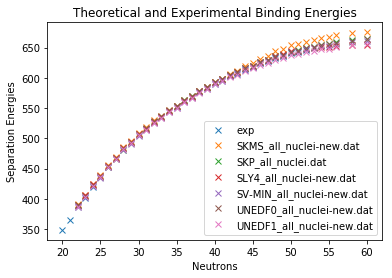

w_ZQ_ml


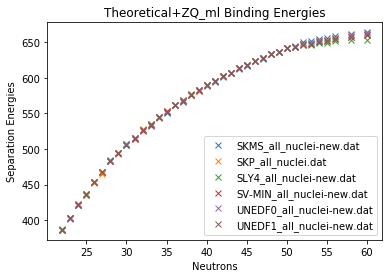

w_NQ_ml


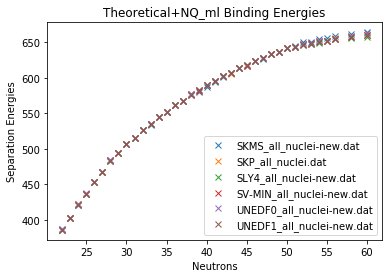

w_ZN_Q_ml


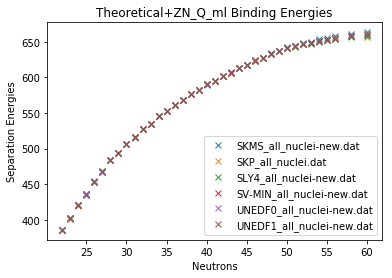

In [17]:
print("NICKEL Z=28")
print("NICKEL Z=28")
print("NICKEL Z=28")



plt.plot(N_AT_exp, y_AT_exp, 'x', label="exp")
for i in range(0,6):
    plt.plot(N_AT_the[i], y_AT_the[i], 'x', label=names[i])
plt.legend()
plt.title("Theoretical and Experimental Binding Energies")
plt.xlabel("Neutrons")
plt.ylabel("Separation Energies")
plt.show()


print("w_ZQ_ml")
for i in range(0,6):
    plt.plot(N_AT_the_w_ZQ_ml[i], y_AT_the_w_ZQ_ml[i], 'x', label=names[i])
plt.legend()
plt.title("Theoretical+ZQ_ml Binding Energies")
plt.xlabel("Neutrons")
plt.ylabel("Separation Energies")
plt.show()


print("w_NQ_ml")
for i in range(0,6):
    plt.plot(N_AT_the_w_NQ_ml[i], y_AT_the_w_NQ_ml[i], 'x', label=names[i])
plt.legend()
plt.title("Theoretical+NQ_ml Binding Energies")
plt.xlabel("Neutrons")
plt.ylabel("Separation Energies")
plt.show()

print("w_ZN_Q_ml")
for i in range(0,6):
    plt.plot(N_AT_the_w_ZN_Q_ml[i], y_AT_the_w_ZN_Q_ml[i], 'x', label=names[i])
plt.legend()
plt.title("Theoretical+ZN_Q_ml Binding Energies")
plt.xlabel("Neutrons")
plt.ylabel("Separation Energies")
plt.show()


NICKEL Z=28
NICKEL Z=28
NICKEL Z=28


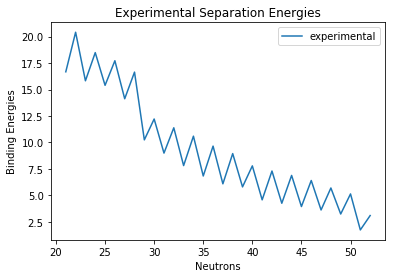

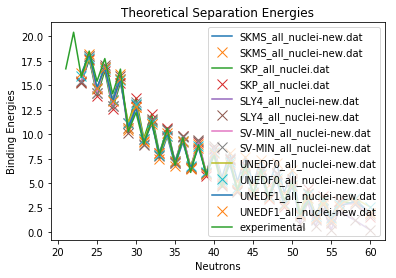

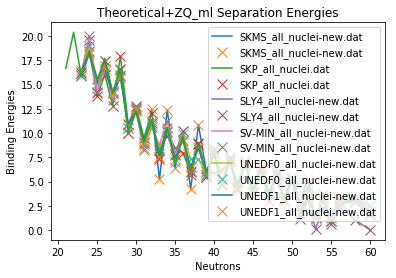

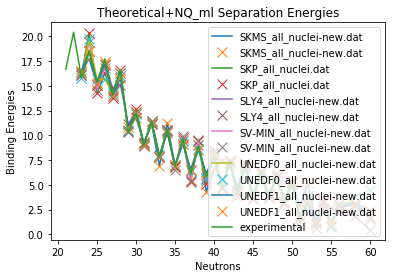

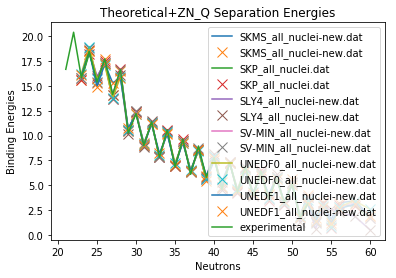

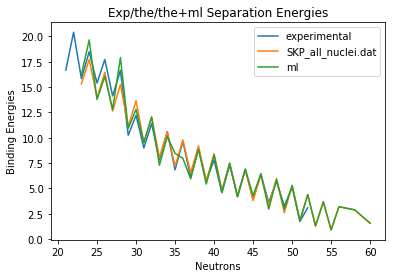

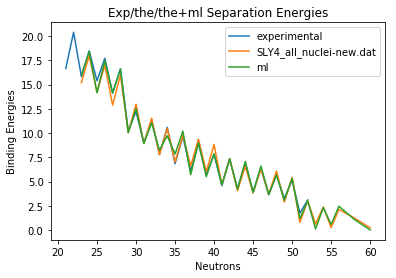

In [18]:
N_AT_S_exp                =[]
Se_AT_exp                 =[]

N_AT_S_the                =[[],[],[],[],[],[]]
Se_AT_the                 =[[],[],[],[],[],[]]

N_AT_S_the_w_ZQ_ml        =[[],[],[],[],[],[]]
Se_AT_the_w_ZQ_ml         =[[],[],[],[],[],[]]

N_AT_S_the_w_NQ_ml        =[[],[],[],[],[],[]]
Se_AT_the_w_NQ_ml         =[[],[],[],[],[],[]]

N_AT_S_the_w_ZN_Q_ml      =[[],[],[],[],[],[]]
Se_AT_the_w_ZN_Q_ml       =[[],[],[],[],[],[]]


print("NICKEL Z=28")
print("NICKEL Z=28")
print("NICKEL Z=28")



for i in range(1, len(N_AT_exp)):
    Se_AT_exp.append(y_AT_exp[i]-y_AT_exp[i-1])
    N_AT_S_exp.append(N_AT_exp[i])

    
plt.plot(N_AT_S_exp, Se_AT_exp, label="experimental")
plt.legend()
plt.title("Experimental Separation Energies")
plt.xlabel("Neutrons")
plt.ylabel("Binding Energies")
plt.show()


for j in range(0,6):
    for i in range(1, len(N_AT_the[j])):
        Se_AT_the[j].append(y_AT_the[j][i]-y_AT_the[j][i-1])
        N_AT_S_the[j].append(N_AT_the[j][i])
    plt.plot(N_AT_S_the[j], Se_AT_the[j], label=names[j])
    plt.plot(N_AT_S_the[j], Se_AT_the[j], 'x', markersize=10, label=names[j])
    

plt.plot(N_AT_S_exp, Se_AT_exp,  label="experimental")
plt.legend()
plt.title("Theoretical Separation Energies")
plt.xlabel("Neutrons")
plt.ylabel("Binding Energies")
plt.show()

for j in range(0,6):
    for i in range(1, len(N_AT_the_w_ZQ_ml[j])):
        Se_AT_the_w_ZQ_ml[j].append(y_AT_the_w_ZQ_ml[j][i]-y_AT_the_w_ZQ_ml[j][i-1])
        N_AT_S_the_w_ZQ_ml[j].append(N_AT_the_w_ZQ_ml[j][i])
    plt.plot(N_AT_S_the_w_ZQ_ml[j], Se_AT_the_w_ZQ_ml[j],  label=names[j])
    plt.plot(N_AT_S_the_w_ZQ_ml[j], Se_AT_the_w_ZQ_ml[j], 'x', markersize=10, label=names[j])

plt.legend()
plt.plot(N_AT_S_exp, Se_AT_exp,  label="experimental")
plt.title("Theoretical+ZQ_ml Separation Energies")
plt.xlabel("Neutrons")
plt.ylabel("Binding Energies")
plt.show()

for j in range(0,6):
    for i in range(1, len(N_AT_the_w_NQ_ml[j])):
        Se_AT_the_w_NQ_ml[j].append(y_AT_the_w_NQ_ml[j][i]-y_AT_the_w_NQ_ml[j][i-1])
        N_AT_S_the_w_NQ_ml[j].append(N_AT_the_w_NQ_ml[j][i])
    plt.plot(N_AT_S_the_w_NQ_ml[j], Se_AT_the_w_NQ_ml[j],  label=names[j])
    plt.plot(N_AT_S_the_w_NQ_ml[j], Se_AT_the_w_NQ_ml[j], 'x', markersize=10, label=names[j])

plt.plot(N_AT_S_exp, Se_AT_exp,  label="experimental")
plt.legend()
plt.title("Theoretical+NQ_ml Separation Energies")
plt.xlabel("Neutrons")
plt.ylabel("Binding Energies")
plt.show() 

for j in range(0,6):
    for i in range(1, len(N_AT_the_w_ZN_Q_ml[j])):
        Se_AT_the_w_ZN_Q_ml[j].append(y_AT_the_w_ZN_Q_ml[j][i]-y_AT_the_w_ZN_Q_ml[j][i-1])
        N_AT_S_the_w_ZN_Q_ml[j].append(N_AT_the_w_ZN_Q_ml[j][i])
    plt.plot(N_AT_S_the_w_ZN_Q_ml[j], Se_AT_the_w_ZN_Q_ml[j],  label=names[j])
    plt.plot(N_AT_S_the_w_ZN_Q_ml[j], Se_AT_the_w_ZN_Q_ml[j], 'x', markersize=10, label=names[j])



plt.plot(N_AT_S_exp, Se_AT_exp,  label="experimental")
plt.legend()
plt.title("Theoretical+ZN_Q Separation Energies")
plt.xlabel("Neutrons")
plt.ylabel("Binding Energies")
plt.show() 

plt.plot(N_AT_S_exp, Se_AT_exp, label="experimental")
plt.plot(N_AT_S_the[1], Se_AT_the[1], label=names[1])
plt.plot(N_AT_S_the_w_ZQ_ml[1], Se_AT_the_w_ZQ_ml[1],  label="ml")
plt.legend()
plt.title("Exp/the/the+ml Separation Energies")
plt.xlabel("Neutrons")
plt.ylabel("Binding Energies")
plt.show()

plt.plot(N_AT_S_exp, Se_AT_exp, label="experimental")
plt.plot(N_AT_S_the[2], Se_AT_the[2], label=names[2])
plt.plot(N_AT_S_the_w_ZQ_ml[2], Se_AT_the_w_ZQ_ml[2],  label="ml")
plt.legend()
plt.title("Exp/the/the+ml Separation Energies")
plt.xlabel("Neutrons")
plt.ylabel("Binding Energies")
plt.show()

   

In [52]:
N_AT_exp                =[]
y_AT_exp                =[]

N_AT_the                =[[],[],[],[],[],[]]
y_AT_the                =[[],[],[],[],[],[]]

N_AT_the_w_ZQ_ml        =[[],[],[],[],[],[]]
y_AT_the_w_ZQ_ml        =[[],[],[],[],[],[]]

N_AT_the_w_NQ_ml        =[[],[],[],[],[],[]]
y_AT_the_w_NQ_ml        =[[],[],[],[],[],[]]

N_AT_the_w_ZN_Q_ml      =[[],[],[],[],[],[]]
y_AT_the_w_ZN_Q_ml      =[[],[],[],[],[],[]]


for n in range(0, 250):
    try:
        y_AT_exp.append(y_exp_d[50,n])
        N_AT_exp.append(n)
    except KeyError:
        continue
        
        
for n in range(0, 250):    
    for i in range(0,6):
        try:
            y_AT_the[i].append(y_all_mat_d[i][50,n])
            N_AT_the[i].append(n)
        except KeyError:
            continue
        
for n in range(0, 250):
    for i in range(0,6):
        try:
            y_AT_the_w_ZQ_ml[i].append(y_all_mat_w_ZQ_ml_d[i][50,n])
            N_AT_the_w_ZQ_ml[i].append(n)
        except KeyError:
            continue
            
for n in range(0, 250):
    for i in range(0,6):
        try:
            y_AT_the_w_NQ_ml[i].append(y_all_mat_w_NQ_ml_d[i][50,n])
            N_AT_the_w_NQ_ml[i].append(n)
        except KeyError:
            continue

for n in range(0, 250):
    for i in range(0,6):
        try:
            y_AT_the_w_ZN_Q_ml[i].append(y_all_mat_w_ZN_Q_ml_d[i][50,n])
            N_AT_the_w_ZN_Q_ml[i].append(n)
        except KeyError:
            continue
            

    

TIN Z=50
TIN Z=50
TIN Z=50


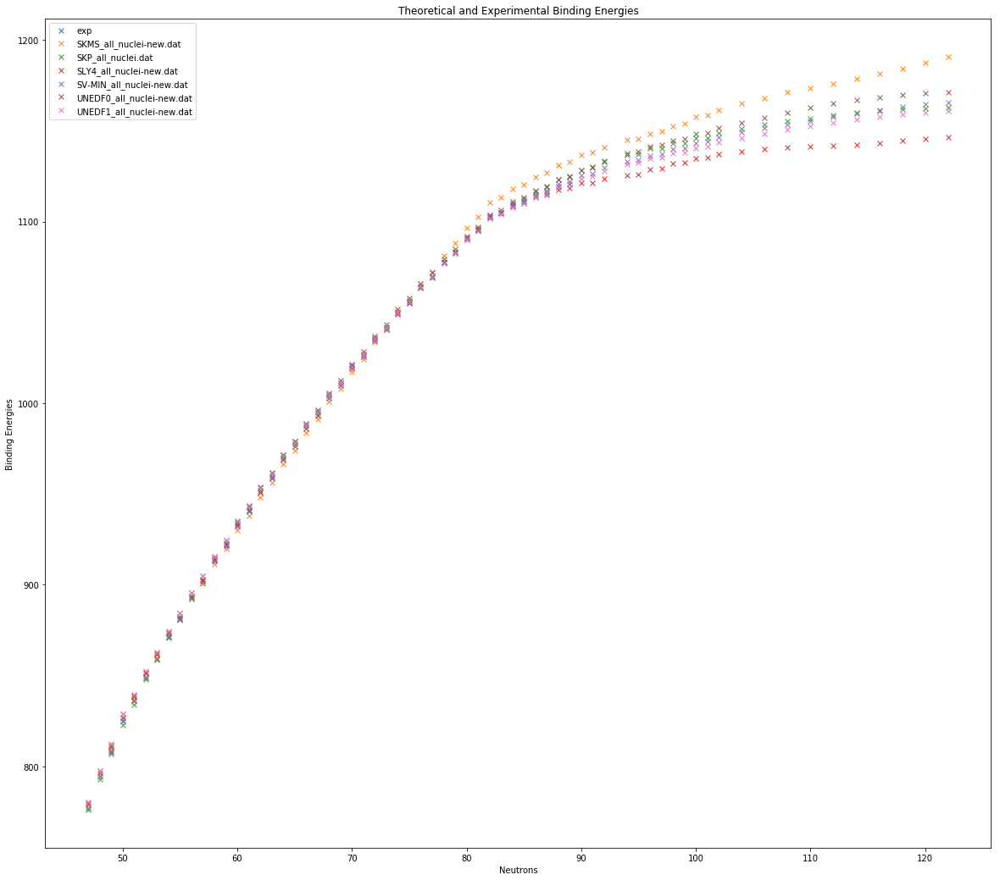

w_ZQ_ml


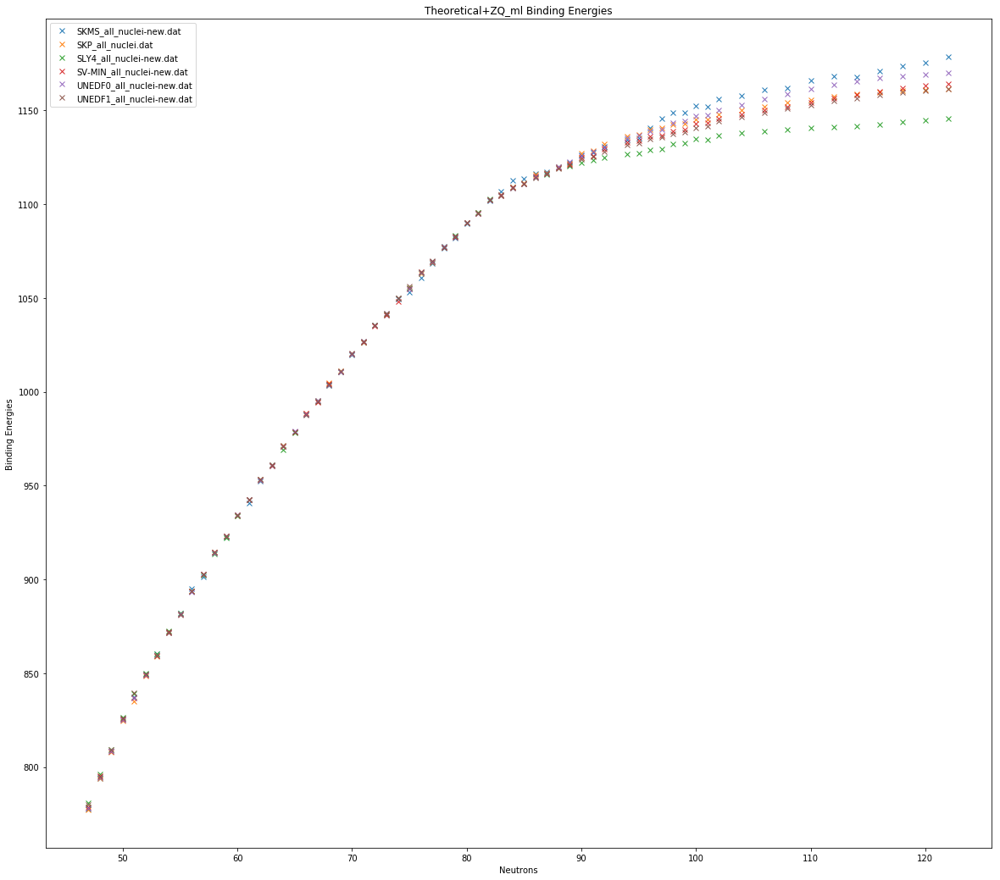

w_NQ_ml


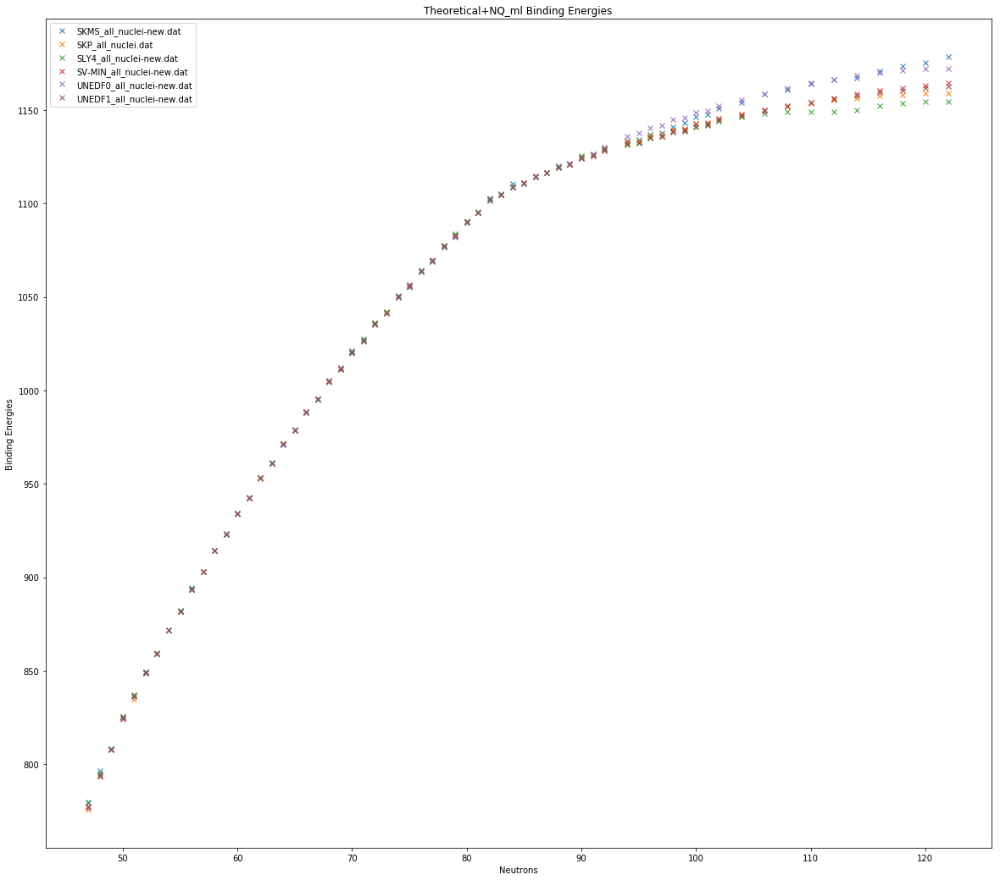

w_ZN_Q_ml


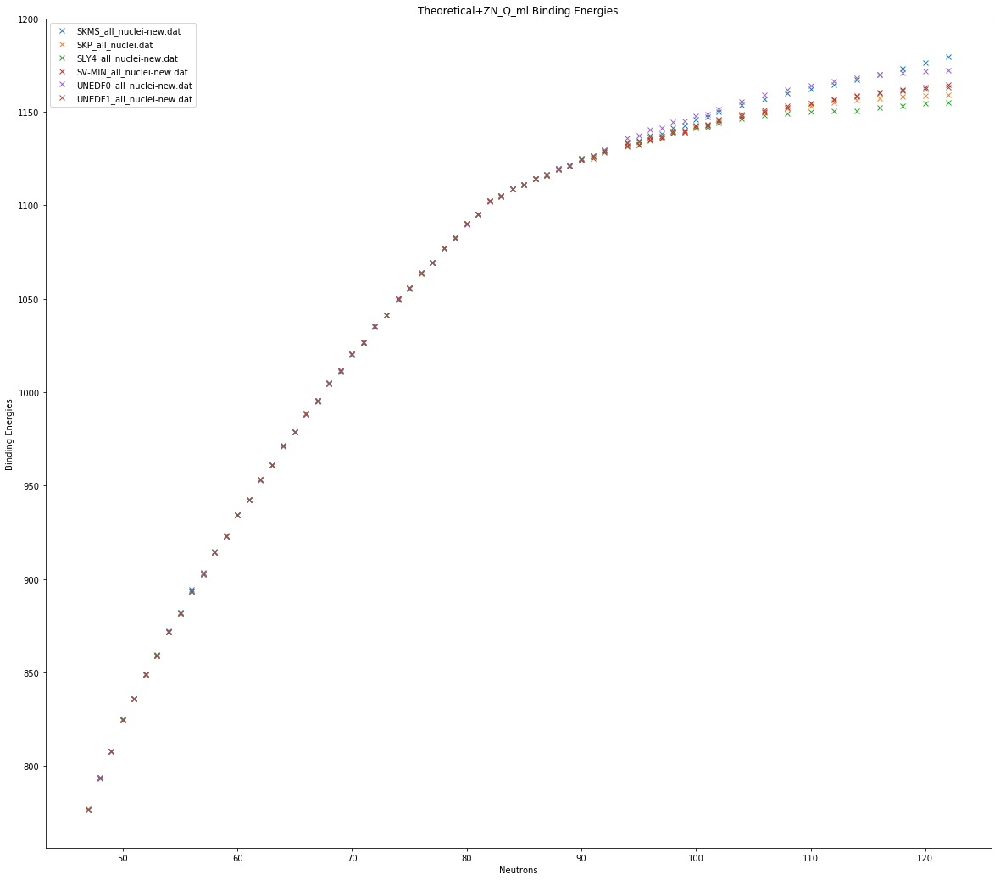

In [53]:
print("TIN Z=50")
print("TIN Z=50")
print("TIN Z=50")


plt.plot(N_AT_exp, y_AT_exp, 'x', label="exp")
for i in range(0,6):
    plt.plot(N_AT_the[i], y_AT_the[i], 'x', label=names[i])
plt.legend()
plt.title("Theoretical and Experimental Binding Energies")
plt.xlabel("Neutrons")
plt.ylabel("Binding Energies")
plt.show()


print("w_ZQ_ml")
for i in range(0,6):
    plt.plot(N_AT_the_w_ZQ_ml[i], y_AT_the_w_ZQ_ml[i], 'x', label=names[i])
plt.legend()
plt.title("Theoretical+ZQ_ml Binding Energies")
plt.xlabel("Neutrons")
plt.ylabel("Binding Energies")
plt.show()


print("w_NQ_ml")
for i in range(0,6):
    plt.plot(N_AT_the_w_NQ_ml[i], y_AT_the_w_NQ_ml[i], 'x', label=names[i])
plt.legend()
plt.title("Theoretical+NQ_ml Binding Energies")
plt.xlabel("Neutrons")
plt.ylabel("Binding Energies")
plt.show()

print("w_ZN_Q_ml")
for i in range(0,6):
    plt.plot(N_AT_the_w_ZN_Q_ml[i], y_AT_the_w_ZN_Q_ml[i], 'x', label=names[i])
plt.legend()
plt.title("Theoretical+ZN_Q_ml Binding Energies")
plt.xlabel("Neutrons")
plt.ylabel("Binding Energies")
plt.show()


TIN Z=50
TIN Z=50
TIN Z=50


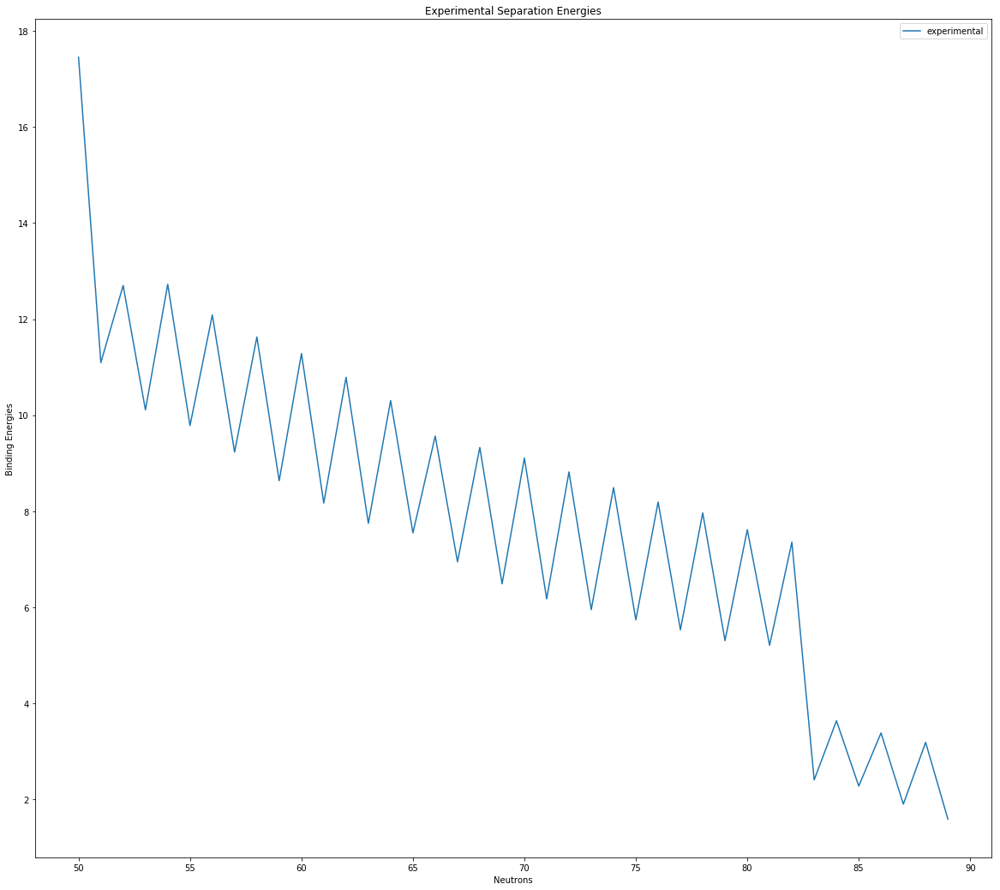

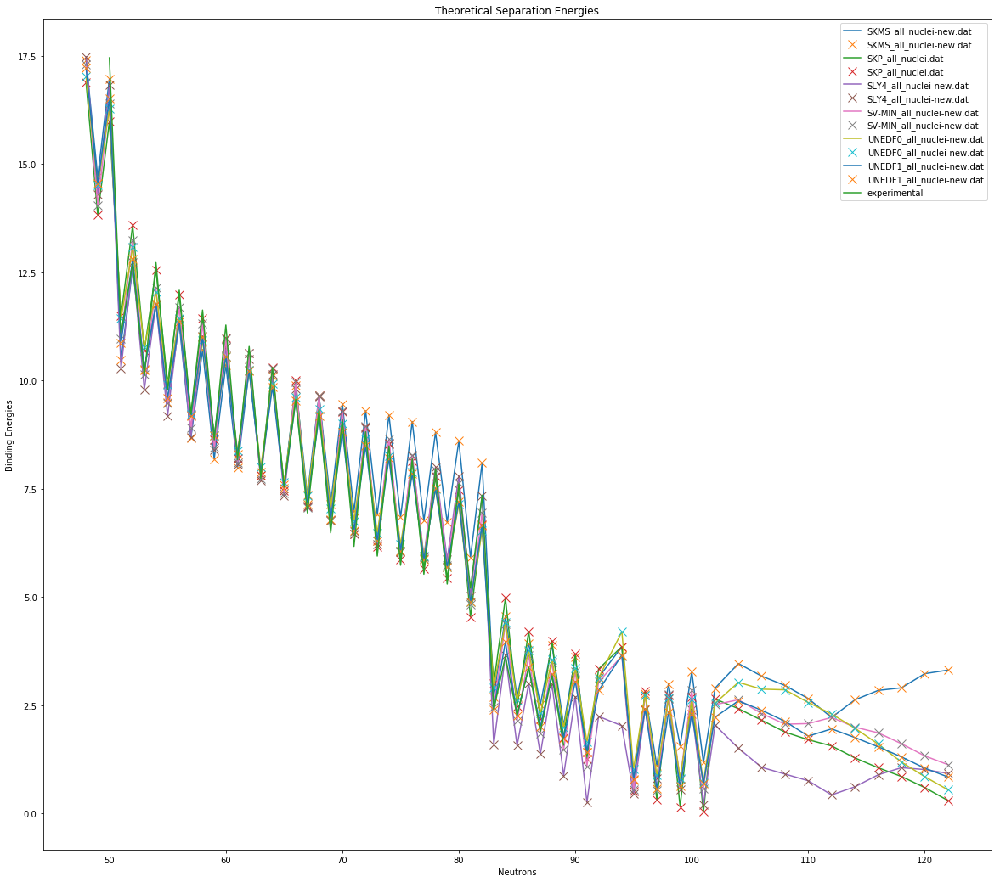

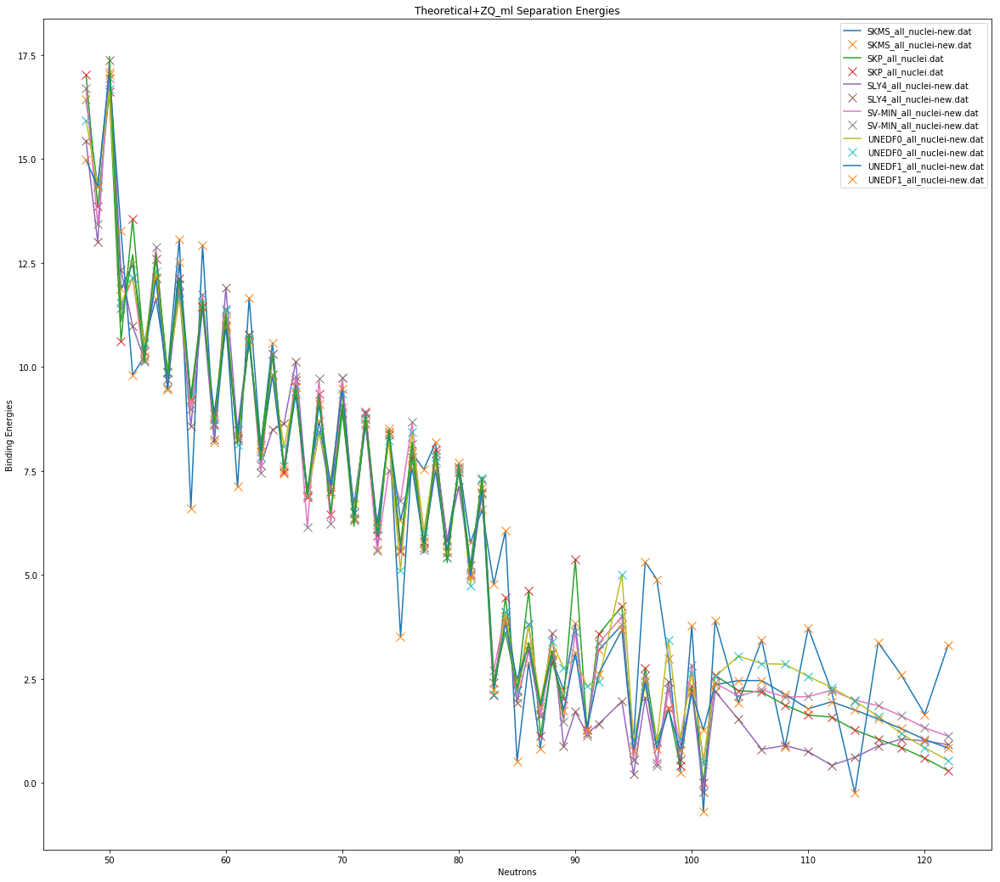

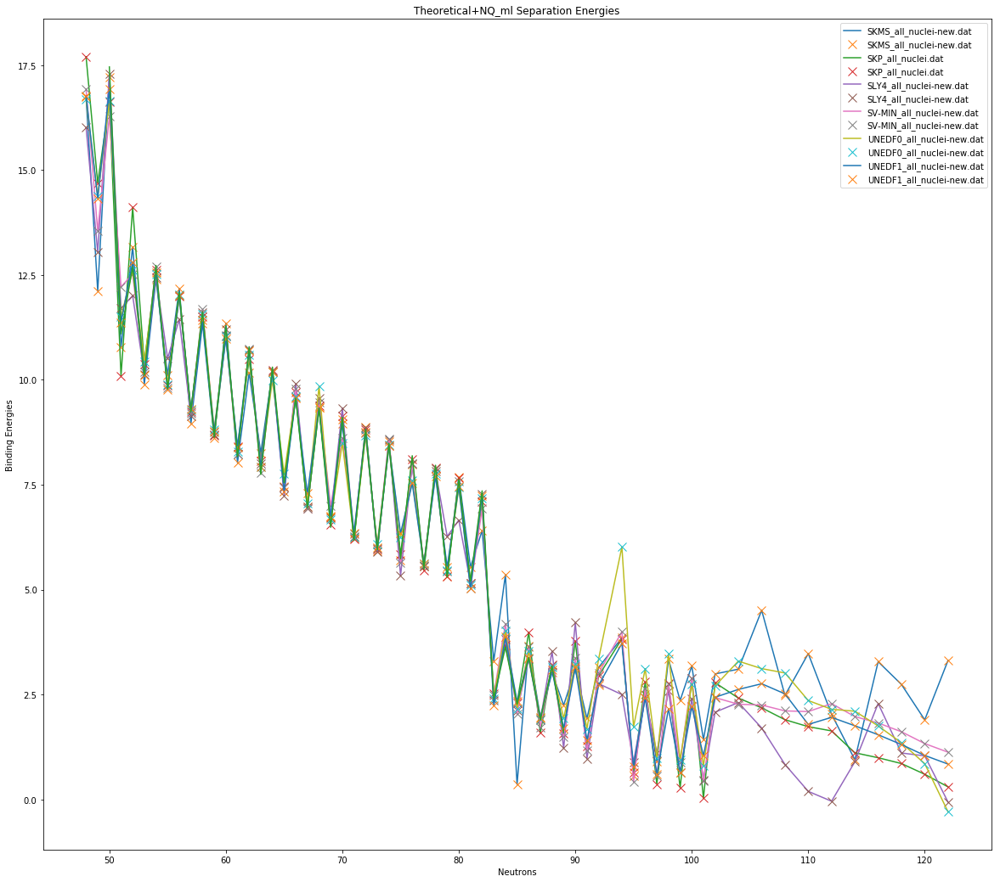

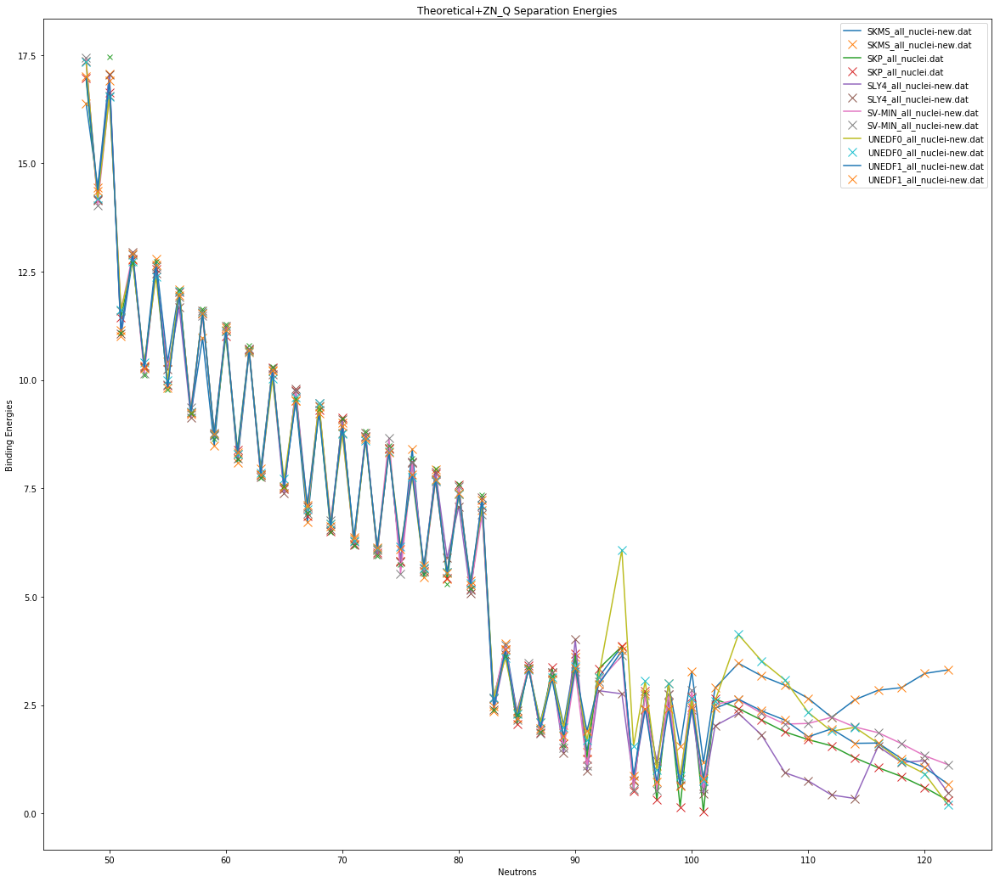

In [55]:
N_AT_S_exp                =[]
Se_AT_exp                 =[]

N_AT_S_the                =[[],[],[],[],[],[]]
Se_AT_the                 =[[],[],[],[],[],[]]

N_AT_S_the_w_ZQ_ml        =[[],[],[],[],[],[]]
Se_AT_the_w_ZQ_ml         =[[],[],[],[],[],[]]

N_AT_S_the_w_NQ_ml        =[[],[],[],[],[],[]]
Se_AT_the_w_NQ_ml         =[[],[],[],[],[],[]]

N_AT_S_the_w_ZN_Q_ml      =[[],[],[],[],[],[]]
Se_AT_the_w_ZN_Q_ml       =[[],[],[],[],[],[]]

print("TIN Z=50")
print("TIN Z=50")
print("TIN Z=50")


for i in range(1, len(N_AT_exp)):
    Se_AT_exp.append(y_AT_exp[i]-y_AT_exp[i-1])
    N_AT_S_exp.append(N_AT_exp[i])

    
plt.plot(N_AT_S_exp, Se_AT_exp,   label="experimental")
plt.legend()
plt.title("Experimental Separation Energies")
plt.xlabel("Neutrons")
plt.ylabel("Binding Energies")
plt.show()


for j in range(0,6):
    for i in range(1, len(N_AT_the[j])):
        Se_AT_the[j].append(y_AT_the[j][i]-y_AT_the[j][i-1])
        N_AT_S_the[j].append(N_AT_the[j][i])
    plt.plot(N_AT_S_the[j], Se_AT_the[j],  label=names[j])
    plt.plot(N_AT_S_the[j], Se_AT_the[j],'x', markersize=10,  label=names[j])

plt.plot(N_AT_S_exp, Se_AT_exp, label="experimental")
plt.legend()
plt.title("Theoretical Separation Energies")
plt.xlabel("Neutrons")
plt.ylabel("Binding Energies")
plt.show()

for j in range(0,6):
    for i in range(1, len(N_AT_the_w_ZQ_ml[j])):
        Se_AT_the_w_ZQ_ml[j].append(y_AT_the_w_ZQ_ml[j][i]-y_AT_the_w_ZQ_ml[j][i-1])
        N_AT_S_the_w_ZQ_ml[j].append(N_AT_the_w_ZQ_ml[j][i])
    plt.plot(N_AT_S_the_w_ZQ_ml[j], Se_AT_the_w_ZQ_ml[j],   label=names[j])
    plt.plot(N_AT_S_the_w_ZQ_ml[j], Se_AT_the_w_ZQ_ml[j], 'x', markersize=10,  label=names[j])

plt.legend()
plt.plot(N_AT_S_exp, Se_AT_exp, label="experimental")
plt.title("Theoretical+ZQ_ml Separation Energies")
plt.xlabel("Neutrons")
plt.ylabel("Binding Energies")
plt.show()

for j in range(0,6):
    for i in range(1, len(N_AT_the_w_NQ_ml[j])):
        Se_AT_the_w_NQ_ml[j].append(y_AT_the_w_NQ_ml[j][i]-y_AT_the_w_NQ_ml[j][i-1])
        N_AT_S_the_w_NQ_ml[j].append(N_AT_the_w_NQ_ml[j][i])
    plt.plot(N_AT_S_the_w_NQ_ml[j], Se_AT_the_w_NQ_ml[j], label=names[j])
    plt.plot(N_AT_S_the_w_NQ_ml[j], Se_AT_the_w_NQ_ml[j], 'x', markersize=10, label=names[j])

plt.legend()
plt.plot(N_AT_S_exp, Se_AT_exp, label="experimental")
plt.title("Theoretical+NQ_ml Separation Energies")
plt.xlabel("Neutrons")
plt.ylabel("Binding Energies")
plt.show() 

for j in range(0,6):
    for i in range(1, len(N_AT_the_w_ZN_Q_ml[j])):
        Se_AT_the_w_ZN_Q_ml[j].append(y_AT_the_w_ZN_Q_ml[j][i]-y_AT_the_w_ZN_Q_ml[j][i-1])
        N_AT_S_the_w_ZN_Q_ml[j].append(N_AT_the_w_ZN_Q_ml[j][i])
    plt.plot(N_AT_S_the_w_ZN_Q_ml[j], Se_AT_the_w_ZN_Q_ml[j],   label=names[j])
    plt.plot(N_AT_S_the_w_ZN_Q_ml[j], Se_AT_the_w_ZN_Q_ml[j], 'x', markersize=10,   label=names[j])

plt.legend()
plt.plot(N_AT_S_exp, Se_AT_exp, 'x', label="experimental")
plt.title("Theoretical+ZN_Q Separation Energies")
plt.xlabel("Neutrons")
plt.ylabel("Binding Energies")
plt.show() 

   

In [56]:
N_AT_exp                =[]
y_AT_exp                =[]

N_AT_the                =[[],[],[],[],[],[]]
y_AT_the                =[[],[],[],[],[],[]]

N_AT_the_w_ZQ_ml        =[[],[],[],[],[],[]]
y_AT_the_w_ZQ_ml        =[[],[],[],[],[],[]]

N_AT_the_w_NQ_ml        =[[],[],[],[],[],[]]
y_AT_the_w_NQ_ml        =[[],[],[],[],[],[]]

N_AT_the_w_ZN_Q_ml      =[[],[],[],[],[],[]]
y_AT_the_w_ZN_Q_ml      =[[],[],[],[],[],[]]


for n in range(0, 250):
    try:
        y_AT_exp.append(y_exp_d[82,n])
        N_AT_exp.append(n)
    except KeyError:
        continue
        
        
for n in range(0, 250):    
    for i in range(0,6):
        try:
            y_AT_the[i].append(y_all_mat_d[i][82,n])
            N_AT_the[i].append(n)
        except KeyError:
            continue
        
for n in range(0, 250):
    for i in range(0,6):
        try:
            y_AT_the_w_ZQ_ml[i].append(y_all_mat_w_ZQ_ml_d[i][82,n])
            N_AT_the_w_ZQ_ml[i].append(n)
        except KeyError:
            continue
            
for n in range(0, 250):
    for i in range(0,6):
        try:
            y_AT_the_w_NQ_ml[i].append(y_all_mat_w_NQ_ml_d[i][82,n])
            N_AT_the_w_NQ_ml[i].append(n)
        except KeyError:
            continue

for n in range(0, 250):
    for i in range(0,6):
        try:
            y_AT_the_w_ZN_Q_ml[i].append(y_all_mat_w_ZN_Q_ml_d[i][82,n])
            N_AT_the_w_ZN_Q_ml[i].append(n)
        except KeyError:
            continue
            

    

NICKEL Z=28
NICKEL Z=28
NICKEL Z=28


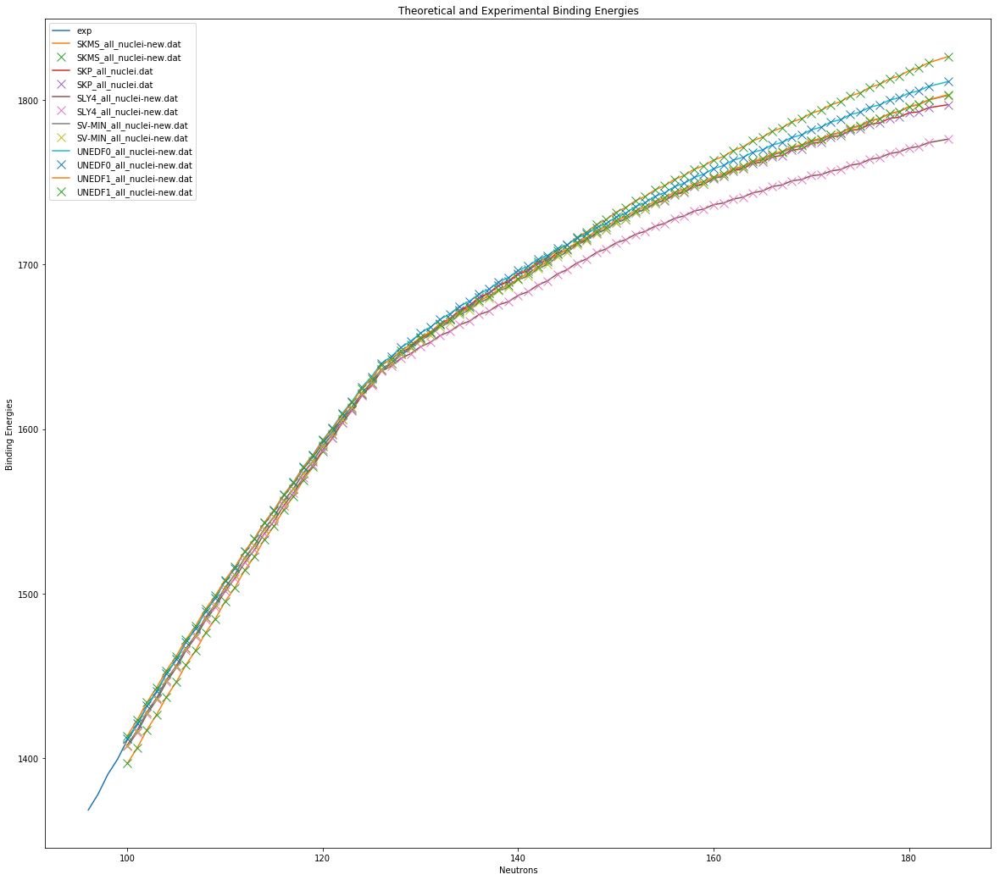

w_ZQ_ml


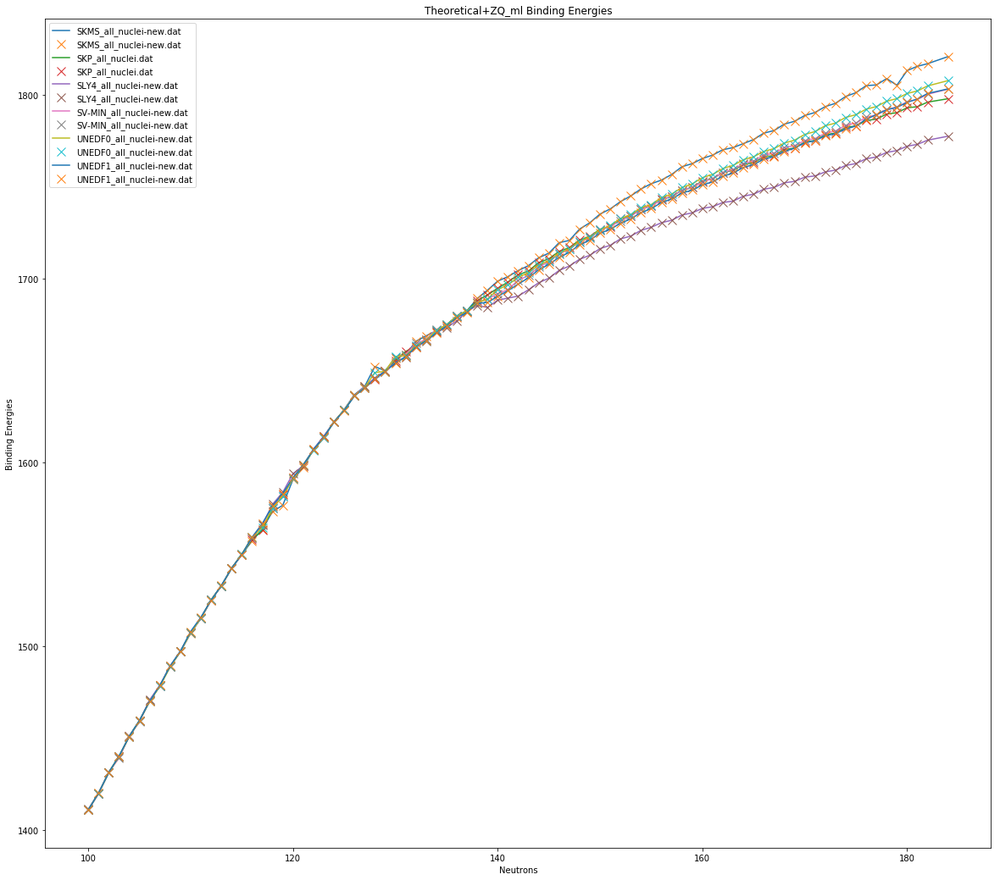

w_NQ_ml


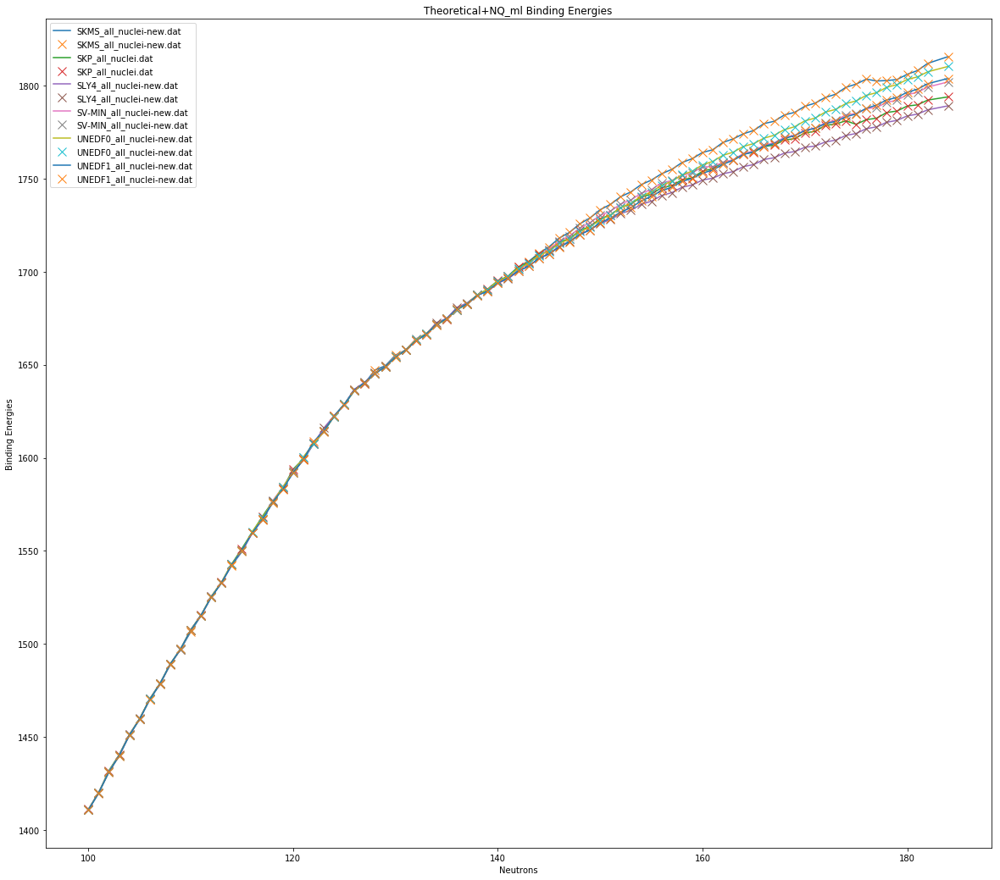

w_ZN_Q_ml


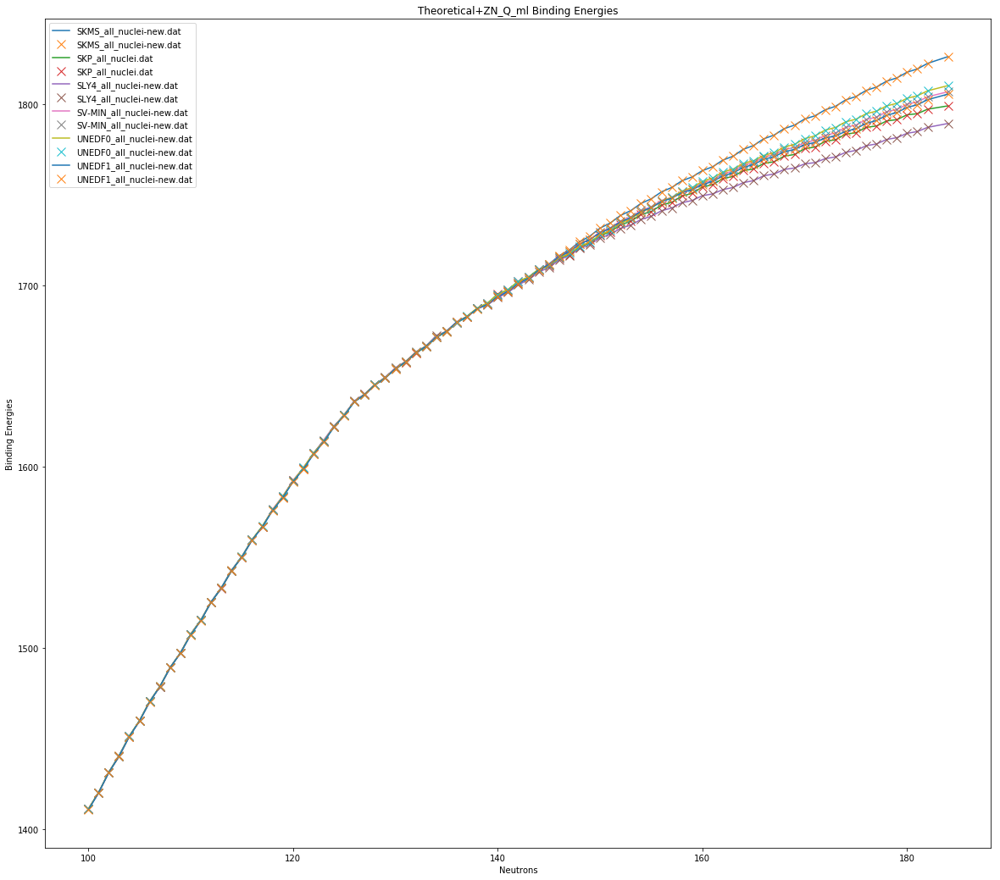

In [58]:
print("NICKEL Z=28")
print("NICKEL Z=28")
print("NICKEL Z=28")



plt.plot(N_AT_exp, y_AT_exp, label="exp")
for i in range(0,6):
    plt.plot(N_AT_the[i], y_AT_the[i], label=names[i])
    plt.plot(N_AT_the[i], y_AT_the[i],'x', markersize=10, label=names[i])

plt.legend()
plt.title("Theoretical and Experimental Binding Energies")
plt.xlabel("Neutrons")
plt.ylabel("Binding Energies")
plt.show()


print("w_ZQ_ml")
for i in range(0,6):
    plt.plot(N_AT_the_w_ZQ_ml[i], y_AT_the_w_ZQ_ml[i], label=names[i])
    plt.plot(N_AT_the_w_ZQ_ml[i], y_AT_the_w_ZQ_ml[i],'x', markersize=10,  label=names[i])

plt.legend()
plt.title("Theoretical+ZQ_ml Binding Energies")
plt.xlabel("Neutrons")
plt.ylabel("Binding Energies")
plt.show()


print("w_NQ_ml")
for i in range(0,6):
    plt.plot(N_AT_the_w_NQ_ml[i], y_AT_the_w_NQ_ml[i], label=names[i])
    plt.plot(N_AT_the_w_NQ_ml[i], y_AT_the_w_NQ_ml[i],'x', markersize=10,  label=names[i])

plt.legend()
plt.title("Theoretical+NQ_ml Binding Energies")
plt.xlabel("Neutrons")
plt.ylabel("Binding Energies")
plt.show()

print("w_ZN_Q_ml")
for i in range(0,6):
    plt.plot(N_AT_the_w_ZN_Q_ml[i], y_AT_the_w_ZN_Q_ml[i], label=names[i])
    plt.plot(N_AT_the_w_ZN_Q_ml[i], y_AT_the_w_ZN_Q_ml[i],'x', markersize=10, label=names[i])

plt.legend()
plt.title("Theoretical+ZN_Q_ml Binding Energies")
plt.xlabel("Neutrons")
plt.ylabel("Binding Energies")
plt.show()


Lead   Z=82
Lead   Z=82
Lead   Z=82


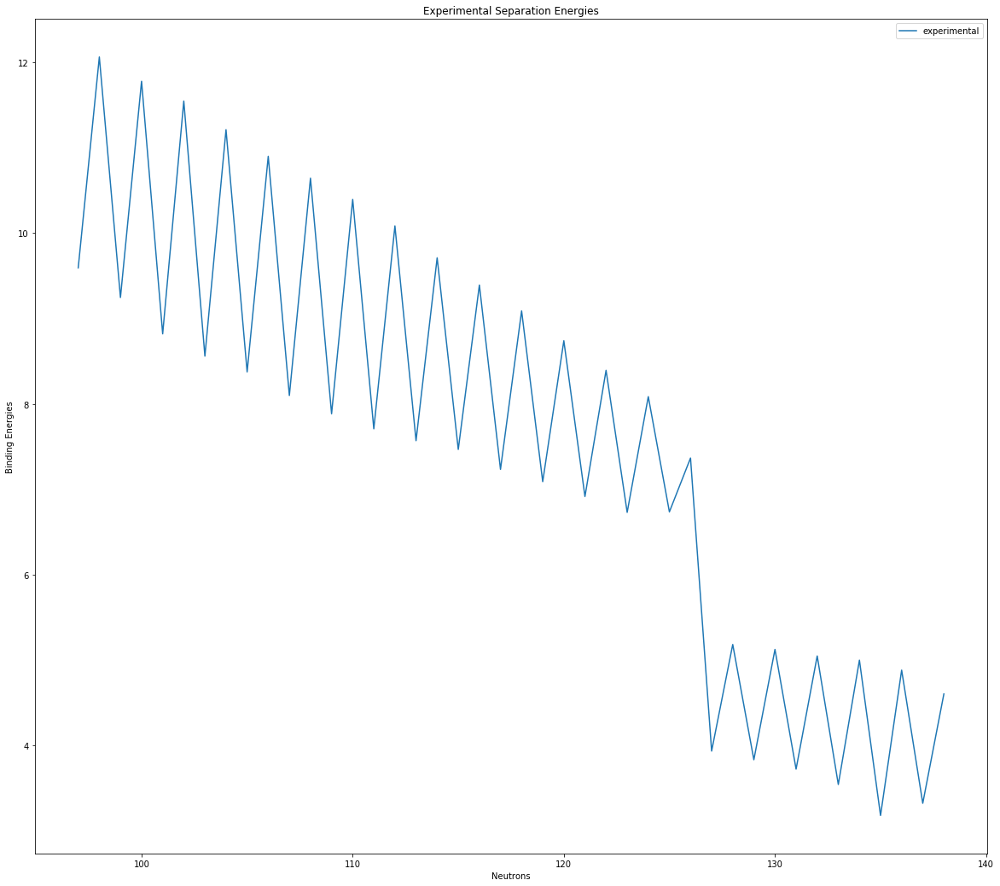

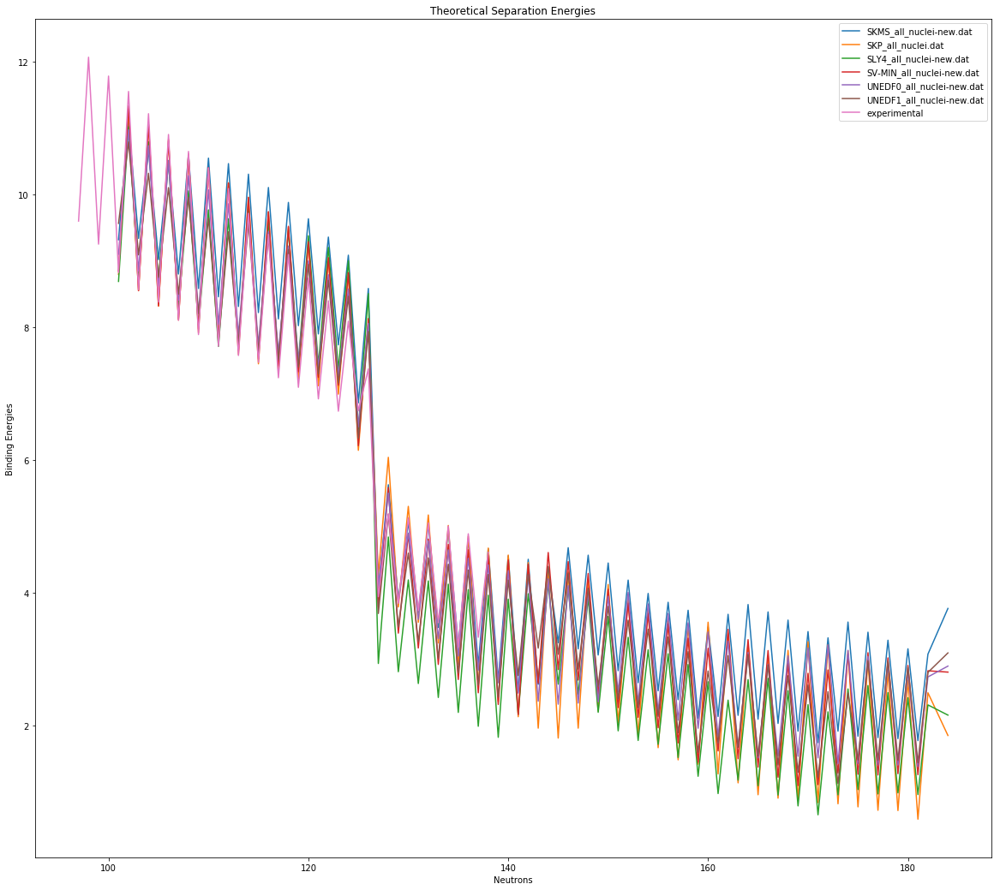

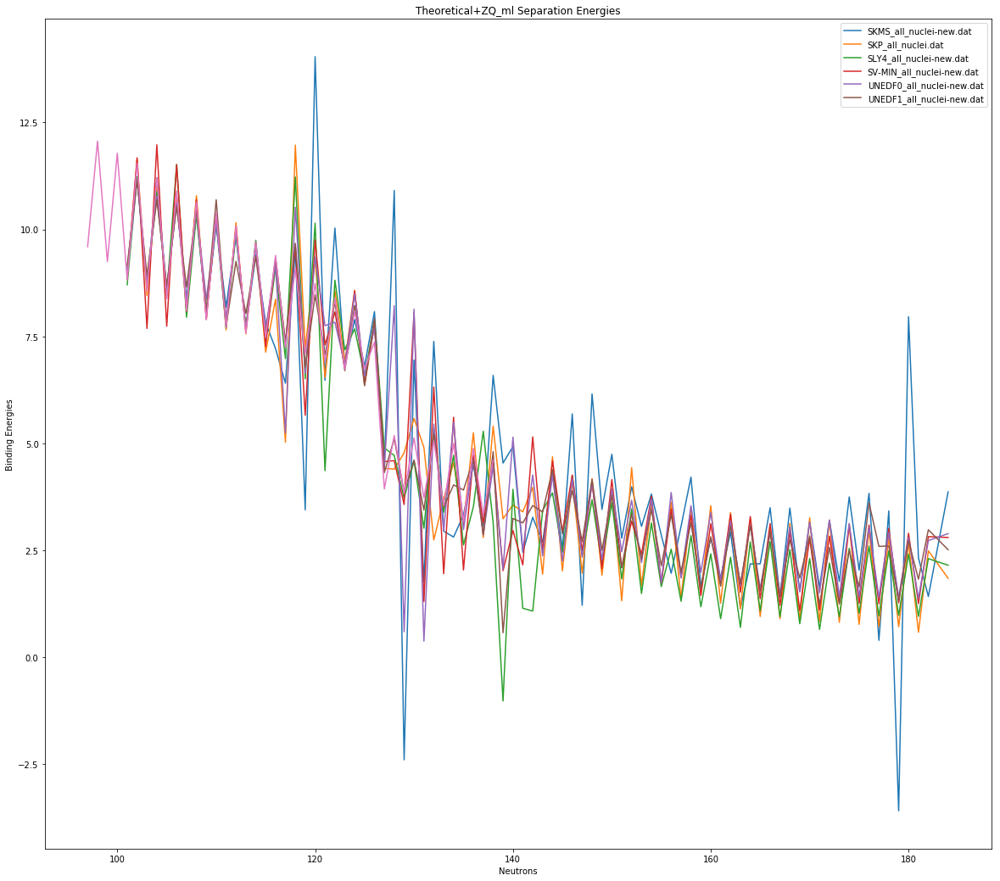

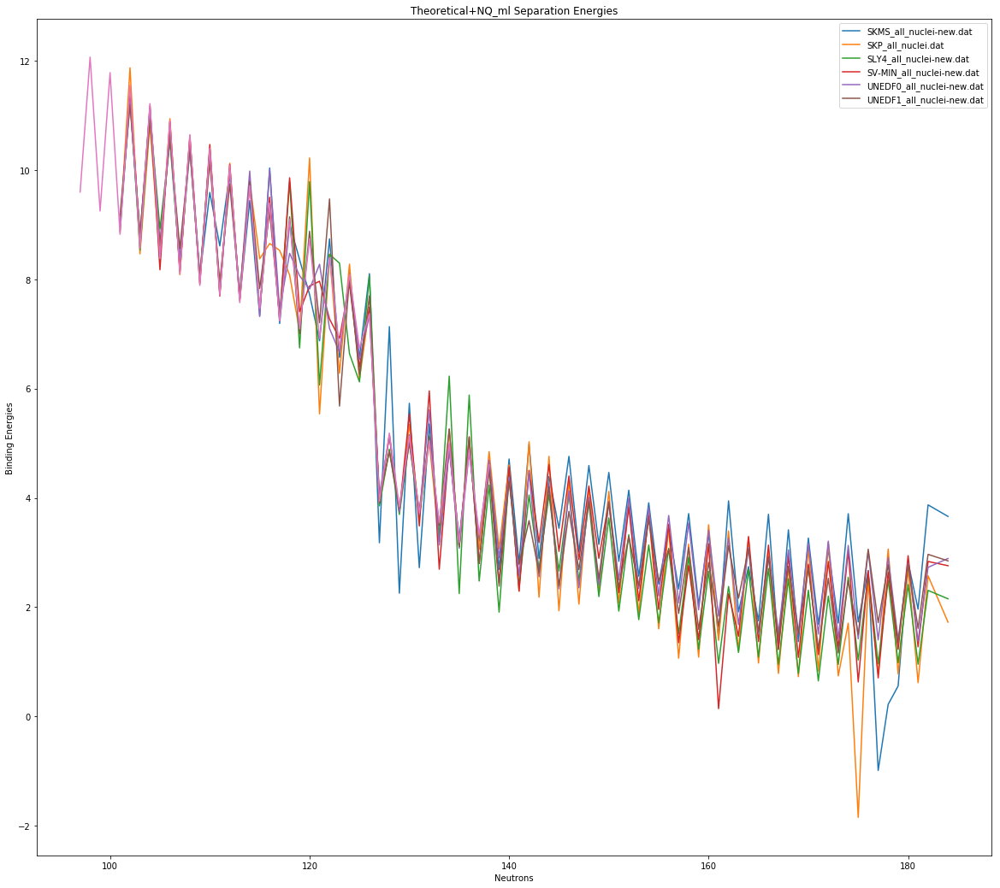

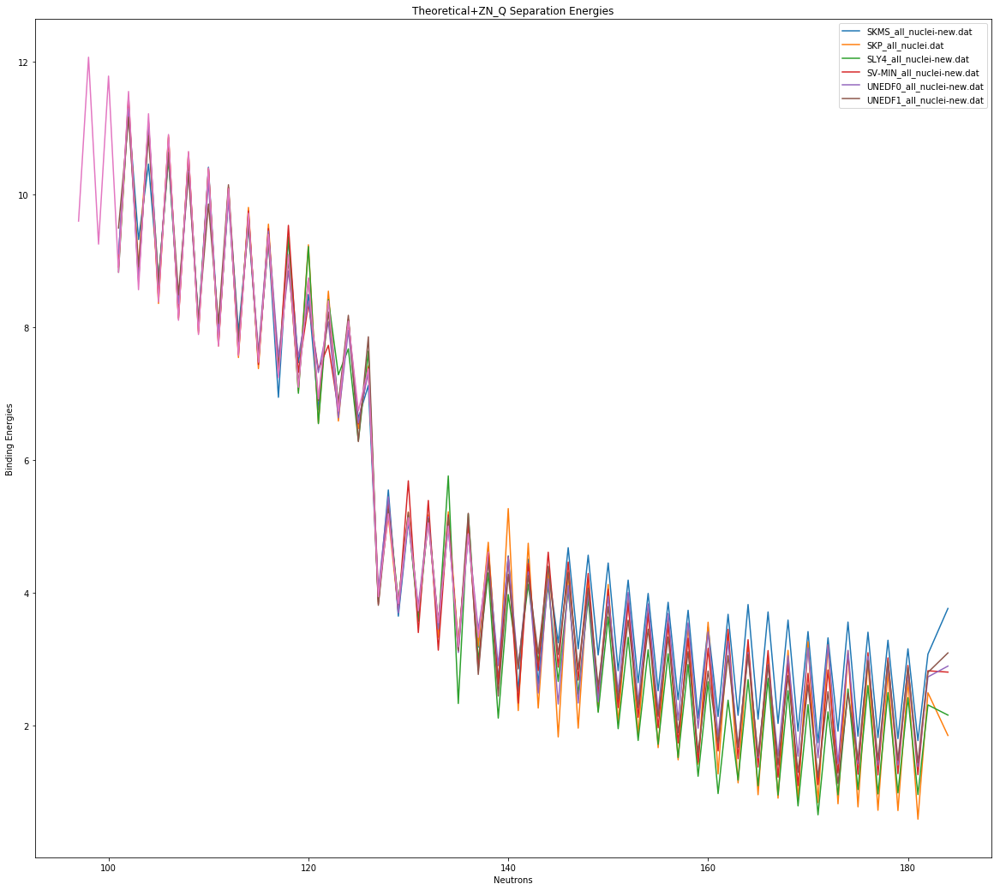

In [59]:
N_AT_S_exp                =[]
Se_AT_exp                 =[]

N_AT_S_the                =[[],[],[],[],[],[]]
Se_AT_the                 =[[],[],[],[],[],[]]

N_AT_S_the_w_ZQ_ml        =[[],[],[],[],[],[]]
Se_AT_the_w_ZQ_ml         =[[],[],[],[],[],[]]

N_AT_S_the_w_NQ_ml        =[[],[],[],[],[],[]]
Se_AT_the_w_NQ_ml         =[[],[],[],[],[],[]]

N_AT_S_the_w_ZN_Q_ml      =[[],[],[],[],[],[]]
Se_AT_the_w_ZN_Q_ml       =[[],[],[],[],[],[]]


print("Lead   Z=82")
print("Lead   Z=82")
print("Lead   Z=82")

for i in range(1, len(N_AT_exp)):
    Se_AT_exp.append(y_AT_exp[i]-y_AT_exp[i-1])
    N_AT_S_exp.append(N_AT_exp[i])

    
plt.plot(N_AT_S_exp, Se_AT_exp, label="experimental")
plt.legend()
plt.title("Experimental Separation Energies")
plt.xlabel("Neutrons")
plt.ylabel("Binding Energies")
plt.show()


for j in range(0,6):
    for i in range(1, len(N_AT_the[j])):
        Se_AT_the[j].append(y_AT_the[j][i]-y_AT_the[j][i-1])
        N_AT_S_the[j].append(N_AT_the[j][i])
    plt.plot(N_AT_S_the[j], Se_AT_the[j], label=names[j])

plt.plot(N_AT_S_exp, Se_AT_exp, label="experimental")
plt.legend()
plt.title("Theoretical Separation Energies")
plt.xlabel("Neutrons")
plt.ylabel("Binding Energies")
plt.show()

for j in range(0,6):
    for i in range(1, len(N_AT_the_w_ZQ_ml[j])):
        Se_AT_the_w_ZQ_ml[j].append(y_AT_the_w_ZQ_ml[j][i]-y_AT_the_w_ZQ_ml[j][i-1])
        N_AT_S_the_w_ZQ_ml[j].append(N_AT_the_w_ZQ_ml[j][i])
    plt.plot(N_AT_S_the_w_ZQ_ml[j], Se_AT_the_w_ZQ_ml[j], label=names[j])

plt.legend()
plt.plot(N_AT_S_exp, Se_AT_exp, label="experimental")
plt.title("Theoretical+ZQ_ml Separation Energies")
plt.xlabel("Neutrons")
plt.ylabel("Binding Energies")
plt.show()

for j in range(0,6):
    for i in range(1, len(N_AT_the_w_NQ_ml[j])):
        Se_AT_the_w_NQ_ml[j].append(y_AT_the_w_NQ_ml[j][i]-y_AT_the_w_NQ_ml[j][i-1])
        N_AT_S_the_w_NQ_ml[j].append(N_AT_the_w_NQ_ml[j][i])
    plt.plot(N_AT_S_the_w_NQ_ml[j], Se_AT_the_w_NQ_ml[j], label=names[j])

plt.legend()
plt.plot(N_AT_S_exp, Se_AT_exp, label="experimental")
plt.title("Theoretical+NQ_ml Separation Energies")
plt.xlabel("Neutrons")
plt.ylabel("Binding Energies")
plt.show() 

for j in range(0,6):
    for i in range(1, len(N_AT_the_w_ZN_Q_ml[j])):
        Se_AT_the_w_ZN_Q_ml[j].append(y_AT_the_w_ZN_Q_ml[j][i]-y_AT_the_w_ZN_Q_ml[j][i-1])
        N_AT_S_the_w_ZN_Q_ml[j].append(N_AT_the_w_ZN_Q_ml[j][i])
    plt.plot(N_AT_S_the_w_ZN_Q_ml[j], Se_AT_the_w_ZN_Q_ml[j], label=names[j])

plt.legend()
plt.plot(N_AT_S_exp, Se_AT_exp, label="experimental")
plt.title("Theoretical+ZN_Q Separation Energies")
plt.xlabel("Neutrons")
plt.ylabel("Binding Energies")
plt.show() 

   